In [42]:
import pandas as pd
import numpy as np

# Загрузка и препроцессинг первичных контекстных данных

### Загрузка датасетов

In [43]:
pupils_df = pd.read_csv('raw_data/pupils_ruma456_2019_2020.csv')

C:\Users\PC\AppData\Local\Temp\ipykernel_26864\2922557893.py:1: DtypeWarning: Columns (0,1,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  pupils_df = pd.read_csv('raw_data/pupils_ruma456_2019_2020.csv')


In [44]:
schools_df = pd.read_excel('raw_data/Конт_данныеОО.xlsx')

In [45]:
pupils_df

,Класс,Код_предмета,ЛогинОО,Код_ученика,Балл,Отметка,Year
0,4,2,sch01110001,4001,11,4,2019
1,4,2,sch01110001,4002,18,5,2019
2,4,2,sch01110001,4003,9,3,2019
3,4,2,sch01110001,4004,11,4,2019
4,4,2,sch01110001,4005,8,3,2019
...,...,...,...,...,...,...,...
11221344,5,1,sch87176023,50212,10,2,2020
11221345,5,1,sch87176023,50213,21,3,2020
11221346,5,1,sch87176023,50214,21,3,2020
11221347,5,1,sch87176023,50216,21,3,2020


In [46]:
schools_df

,Логин ОО,Где расположена образовательная организация?,Наименование населенного пункта,Размер населенного пункта,ОО является специальной (коррекционной),Количество обучающихся в ОО (в сумме по всем классам)
0,Логин ОО,NaN,NaN,NaN,NaN,NaN
1,sch05153602,"4. Населенный пункт сельского типа (село, хуто...",село Шумлелик,1. Менее 1 тыс. человек,Нет,207
2,sch05153601,"4. Населенный пункт сельского типа (село, хуто...",Червленные-буруны,2. 1–5 тыс. человек,Да,287
3,sch05153598,"4. Населенный пункт сельского типа (село, хуто...",Ортатюбе,3. 5–10 тыс. чел,Нет,110
4,sch05153594,"4. Населенный пункт сельского типа (село, хуто...",Кумли,1. Менее 1 тыс. человек,Нет,96
...,...,...,...,...,...,...
36896,sch62126033,"4. Населенный пункт сельского типа (село, хуто...",Новая Деревня,1. Менее 1 тыс. человек,Нет,32
36897,sch63130094,"4. Населенный пункт сельского типа (село, хуто...",Кабановка,2. 1–5 тыс. человек,Нет,75
36898,sch63133298,"4. Населенный пункт сельского типа (село, хуто...",Черновский,2. 1–5 тыс. человек,Нет,3110
36899,sch05153226,"4. Населенный пункт сельского типа (село, хуто...",c. Кунки,1. Менее 1 тыс. человек,Нет,21


### Чистка данных от пустых значений

In [47]:
pupils_df = pupils_df.drop_duplicates().dropna()

In [48]:
schools_df = schools_df.drop_duplicates().dropna()

In [49]:
schools_df

,Логин ОО,Где расположена образовательная организация?,Наименование населенного пункта,Размер населенного пункта,ОО является специальной (коррекционной),Количество обучающихся в ОО (в сумме по всем классам)
1,sch05153602,"4. Населенный пункт сельского типа (село, хуто...",село Шумлелик,1. Менее 1 тыс. человек,Нет,207
2,sch05153601,"4. Населенный пункт сельского типа (село, хуто...",Червленные-буруны,2. 1–5 тыс. человек,Да,287
3,sch05153598,"4. Населенный пункт сельского типа (село, хуто...",Ортатюбе,3. 5–10 тыс. чел,Нет,110
4,sch05153594,"4. Населенный пункт сельского типа (село, хуто...",Кумли,1. Менее 1 тыс. человек,Нет,96
5,sch05153592,"4. Населенный пункт сельского типа (село, хуто...",Карагас,2. 1–5 тыс. человек,Нет,220
...,...,...,...,...,...,...
36896,sch62126033,"4. Населенный пункт сельского типа (село, хуто...",Новая Деревня,1. Менее 1 тыс. человек,Нет,32
36897,sch63130094,"4. Населенный пункт сельского типа (село, хуто...",Кабановка,2. 1–5 тыс. человек,Нет,75
36898,sch63133298,"4. Населенный пункт сельского типа (село, хуто...",Черновский,2. 1–5 тыс. человек,Нет,3110
36899,sch05153226,"4. Населенный пункт сельского типа (село, хуто...",c. Кунки,1. Менее 1 тыс. человек,Нет,21


### Одну из колонок можно свести в бинарному типу

In [50]:
set(schools_df['ОО является специальной (коррекционной)'])

{'Да', 'Нет', 'да', 'нет'}

In [51]:
schools_df['ОО является специальной (коррекционной)'] = schools_df['ОО является специальной (коррекционной)'].apply(lambda x: True if x in ['Да', 'да'] else False)

In [52]:
set(schools_df['ОО является специальной (коррекционной)'])

{False, True}

In [53]:
set(schools_df['Размер населенного пункта'])

{'1. Менее 1 тыс. человек',
 '2. 1–5 тыс. человек',
 '3. 5–10 тыс. чел',
 '4. 10–50 тыс. человек',
 '5. 50–100 тыс. человек',
 '6. 100–450 тыс. человек',
 '7. 450–680 тыс. человек',
 '8. Более 680 тыс. человек'}

In [54]:
set(schools_df['Где расположена образовательная организация?'])

{'1. Столица субъекта РФ',
 '2. Город',
 '3. Населенный пункт городского типа (рабочий поселок, поселок городского типа и пр.)',
 '4. Населенный пункт сельского типа (село, хутор, деревня и пр.)'}

### Учеников, имеющих неизвестный номер ОО, необходимо убрать из рассмотрения

In [55]:
all_school_ids = set(pupils_df['ЛогинОО'])
known_school_ids = set(schools_df['Логин ОО'])

In [56]:
len(all_school_ids), len(known_school_ids)

(39392, 36898)

In [57]:
unknown_school_ids = all_school_ids - known_school_ids
len(unknown_school_ids)

3667

In [58]:
pupils_df=pupils_df[pupils_df['ЛогинОО'].isin(known_school_ids)]

### Сохранение промежуточных результатов

In [59]:
pupils_df.to_csv('filtered_raw_data/pupils.csv')

In [60]:
schools_df.to_csv('filtered_raw_data/schools.csv')

In [61]:
pupils_df

,Класс,Код_предмета,ЛогинОО,Код_ученика,Балл,Отметка,Year
0,4,2,sch01110001,4001,11,4,2019
1,4,2,sch01110001,4002,18,5,2019
2,4,2,sch01110001,4003,9,3,2019
3,4,2,sch01110001,4004,11,4,2019
4,4,2,sch01110001,4005,8,3,2019
...,...,...,...,...,...,...,...
11221344,5,1,sch87176023,50212,10,2,2020
11221345,5,1,sch87176023,50213,21,3,2020
11221346,5,1,sch87176023,50214,21,3,2020
11221347,5,1,sch87176023,50216,21,3,2020


In [62]:
schools_df

,Логин ОО,Где расположена образовательная организация?,Наименование населенного пункта,Размер населенного пункта,ОО является специальной (коррекционной),Количество обучающихся в ОО (в сумме по всем классам)
1,sch05153602,"4. Населенный пункт сельского типа (село, хуто...",село Шумлелик,1. Менее 1 тыс. человек,False,207
2,sch05153601,"4. Населенный пункт сельского типа (село, хуто...",Червленные-буруны,2. 1–5 тыс. человек,True,287
3,sch05153598,"4. Населенный пункт сельского типа (село, хуто...",Ортатюбе,3. 5–10 тыс. чел,False,110
4,sch05153594,"4. Населенный пункт сельского типа (село, хуто...",Кумли,1. Менее 1 тыс. человек,False,96
5,sch05153592,"4. Населенный пункт сельского типа (село, хуто...",Карагас,2. 1–5 тыс. человек,False,220
...,...,...,...,...,...,...
36896,sch62126033,"4. Населенный пункт сельского типа (село, хуто...",Новая Деревня,1. Менее 1 тыс. человек,False,32
36897,sch63130094,"4. Населенный пункт сельского типа (село, хуто...",Кабановка,2. 1–5 тыс. человек,False,75
36898,sch63133298,"4. Населенный пункт сельского типа (село, хуто...",Черновский,2. 1–5 тыс. человек,False,3110
36899,sch05153226,"4. Населенный пункт сельского типа (село, хуто...",c. Кунки,1. Менее 1 тыс. человек,False,21


## Подготовка датафрейма с нормализованными баллами для каждого ученика для соединения со школами

In [63]:
pupils_df = pd.read_csv('filtered_raw_data/pupils.csv').drop('Unnamed: 0', axis=1)

In [64]:
pupils_df

,Класс,Код_предмета,ЛогинОО,Код_ученика,Балл,Отметка,Year
0,4,2,sch01110001,4001,11,4,2019
1,4,2,sch01110001,4002,18,5,2019
2,4,2,sch01110001,4003,9,3,2019
3,4,2,sch01110001,4004,11,4,2019
4,4,2,sch01110001,4005,8,3,2019
...,...,...,...,...,...,...,...
10728206,5,1,sch87176023,50212,10,2,2020
10728207,5,1,sch87176023,50213,21,3,2020
10728208,5,1,sch87176023,50214,21,3,2020
10728209,5,1,sch87176023,50216,21,3,2020


### Нормализуем баллы учеников в соответствии с известными максимальными баллами

In [65]:
subject_codes = {
    1: 'ru',
    2: 'ma'
}
max_scores = {
    1: {4: 38, 5: 45, 6: 45},
    2: {4: 20, 5: 20, 6: 20},
}

In [66]:
pupils_df.apply(lambda row: row['Балл'] / max_scores[row['Код_предмета']][row['Класс']], axis=1 )

0           0.550000
1           0.900000
2           0.450000
3           0.550000
4           0.400000
              ...   
10728206    0.222222
10728207    0.466667
10728208    0.466667
10728209    0.466667
10728210    0.688889
Length: 10728211, dtype: float64

In [67]:
pupils_df['Балл'] = pupils_df.apply(lambda row: row['Балл'] / max_scores[row['Код_предмета']][row['Класс']], axis=1 )

In [68]:
pupils_df

,Класс,Код_предмета,ЛогинОО,Код_ученика,Балл,Отметка,Year
0,4,2,sch01110001,4001,0.550000,4,2019
1,4,2,sch01110001,4002,0.900000,5,2019
2,4,2,sch01110001,4003,0.450000,3,2019
3,4,2,sch01110001,4004,0.550000,4,2019
4,4,2,sch01110001,4005,0.400000,3,2019
...,...,...,...,...,...,...,...
10728206,5,1,sch87176023,50212,0.222222,2,2020
10728207,5,1,sch87176023,50213,0.466667,3,2020
10728208,5,1,sch87176023,50214,0.466667,3,2020
10728209,5,1,sch87176023,50216,0.466667,3,2020


In [69]:
len(pupils_df[pupils_df['Year'] == 2019]), len(pupils_df[pupils_df['Year'] == 2020])

(5604905, 5123306)

### Разделим датафрейм в соответствии с годами

In [70]:
pupils_df_2019 = pupils_df[pupils_df['Year'] == 2019]
pupils_df_2020 = pupils_df[pupils_df['Year'] == 2020]

### Разделим датафреймы в соответствии с кодами предметов

In [71]:
pupils_df_2019_ru = pupils_df_2019[pupils_df_2019['Код_предмета'] == 1]
pupils_df_2019_ma = pupils_df_2019[pupils_df_2019['Код_предмета'] == 2]
pupils_df_2020_ru = pupils_df_2020[pupils_df_2020['Код_предмета'] == 1]
pupils_df_2020_ma = pupils_df_2020[pupils_df_2020['Код_предмета'] == 2]

### Проверим, что за каждый год есть лишь 2 класса

In [72]:
set(pupils_df_2019['Класс']), set(pupils_df_2019_ma['Класс']), set(pupils_df_2020_ru['Класс']), set(pupils_df_2020_ma['Класс'])


({4, 5}, {4, 5}, {5, 6}, {5, 6})

### Получим средние по школе баллы по каждому предмету за каждый год

In [73]:
pupils_df_2019_ru_4 = pupils_df_2019_ru[pupils_df_2019_ru['Класс'] == 4]
pupils_df_2019_ru_5 = pupils_df_2019_ru[pupils_df_2019_ru['Класс'] == 5]
pupils_df_2019_ma_4 = pupils_df_2019_ma[pupils_df_2019_ma['Класс'] == 4]
pupils_df_2019_ma_5 = pupils_df_2019_ma[pupils_df_2019_ma['Класс'] == 5]

pupils_df_2020_ru_5 = pupils_df_2020_ru[pupils_df_2020_ru['Класс'] == 5]
pupils_df_2020_ru_6 = pupils_df_2020_ru[pupils_df_2020_ru['Класс'] == 6]
pupils_df_2020_ma_5 = pupils_df_2020_ma[pupils_df_2020_ma['Класс'] == 5]
pupils_df_2020_ma_6 = pupils_df_2020_ma[pupils_df_2020_ma['Класс'] == 6]

In [74]:
pupils_df_2019_ru_4 = pupils_df_2019_ru_4.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)
pupils_df_2019_ru_5 = pupils_df_2019_ru_5.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)
pupils_df_2019_ma_4 = pupils_df_2019_ma_4.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)
pupils_df_2019_ma_5 = pupils_df_2019_ma_5.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)

pupils_df_2020_ru_5 = pupils_df_2020_ru_5.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)
pupils_df_2020_ru_6 = pupils_df_2020_ru_6.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)
pupils_df_2020_ma_5 = pupils_df_2020_ma_5.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)
pupils_df_2020_ma_6 = pupils_df_2020_ma_6.drop(['Класс', "Код_предмета", "Код_ученика", "Year", "Отметка"], axis=1)

In [75]:
mean_score_df_2019_ru_4 = pupils_df_2019_ru_4.groupby('ЛогинОО').mean()
mean_score_df_2019_ru_5 = pupils_df_2019_ru_5.groupby('ЛогинОО').mean()
mean_score_df_2019_ma_4 = pupils_df_2019_ma_4.groupby('ЛогинОО').mean()
mean_score_df_2019_ma_5 = pupils_df_2019_ma_5.groupby('ЛогинОО').mean()

mean_score_df_2020_ru_5 = pupils_df_2020_ru_5.groupby('ЛогинОО').mean()
mean_score_df_2020_ru_6 = pupils_df_2020_ru_6.groupby('ЛогинОО').mean()
mean_score_df_2020_ma_5 = pupils_df_2020_ma_5.groupby('ЛогинОО').mean()
mean_score_df_2020_ma_6 = pupils_df_2020_ma_6.groupby('ЛогинОО').mean()


In [76]:
mean_score_df_2019_ru_4['Логин ОО'] = mean_score_df_2019_ru_4.index
mean_score_df_2019_ru_5['Логин ОО'] = mean_score_df_2019_ru_5.index
mean_score_df_2019_ma_4['Логин ОО'] = mean_score_df_2019_ma_4.index
mean_score_df_2019_ma_5['Логин ОО'] = mean_score_df_2019_ma_5.index

mean_score_df_2020_ru_5['Логин ОО'] = mean_score_df_2020_ru_5.index
mean_score_df_2020_ru_6['Логин ОО'] = mean_score_df_2020_ru_6.index
mean_score_df_2020_ma_5['Логин ОО'] = mean_score_df_2020_ma_5.index
mean_score_df_2020_ma_6['Логин ОО'] = mean_score_df_2020_ma_6.index

In [77]:
mean_score_df_2020_ru_5

,Балл,Логин ОО
ЛогинОО,,
ksh38180031,0.498148,ksh38180031
sch01110001,0.514379,sch01110001
sch01110003,0.476825,sch01110003
sch01110004,0.429744,sch01110004
sch01110005,0.476190,sch01110005
...,...,...
sch92122007,0.638889,sch92122007
sch92122008,0.520513,sch92122008
sch92126001,0.543119,sch92126001


### Подгрузим ранее отфильтрованные данные о школах

In [84]:
schools_df = pd.read_csv('filtered_raw_data/schools.csv').drop('Unnamed: 0', axis=1)

In [85]:
schools_df

,Логин ОО,Где расположена образовательная организация?,Наименование населенного пункта,Размер населенного пункта,ОО является специальной (коррекционной),Количество обучающихся в ОО (в сумме по всем классам)
0,sch05153602,"4. Населенный пункт сельского типа (село, хуто...",село Шумлелик,1. Менее 1 тыс. человек,False,207
1,sch05153601,"4. Населенный пункт сельского типа (село, хуто...",Червленные-буруны,2. 1–5 тыс. человек,True,287
2,sch05153598,"4. Населенный пункт сельского типа (село, хуто...",Ортатюбе,3. 5–10 тыс. чел,False,110
3,sch05153594,"4. Населенный пункт сельского типа (село, хуто...",Кумли,1. Менее 1 тыс. человек,False,96
4,sch05153592,"4. Населенный пункт сельского типа (село, хуто...",Карагас,2. 1–5 тыс. человек,False,220
...,...,...,...,...,...,...
36893,sch62126033,"4. Населенный пункт сельского типа (село, хуто...",Новая Деревня,1. Менее 1 тыс. человек,False,32
36894,sch63130094,"4. Населенный пункт сельского типа (село, хуто...",Кабановка,2. 1–5 тыс. человек,False,75
36895,sch63133298,"4. Населенный пункт сельского типа (село, хуто...",Черновский,2. 1–5 тыс. человек,False,3110
36896,sch05153226,"4. Населенный пункт сельского типа (село, хуто...",c. Кунки,1. Менее 1 тыс. человек,False,21


In [86]:
mean_score_df_2019_ru_4
mean_score_df_2019_ru_5
mean_score_df_2019_ma_4
mean_score_df_2019_ma_5

mean_score_df_2020_ru_5
mean_score_df_2020_ru_6
mean_score_df_2020_ma_5
mean_score_df_2020_ma_6

,Балл,Логин ОО
ЛогинОО,,
ksh38180031,0.478571,ksh38180031
sch01110001,0.439063,sch01110001
sch01110003,0.494898,sch01110003
sch01110004,0.407937,sch01110004
sch01110005,0.534091,sch01110005
...,...,...
sch92122008,0.366000,sch92122008
sch92126001,0.553731,sch92126001
sch92126007,0.265385,sch92126007


In [87]:
schools_df.columns

Index(['Логин ОО', 'Где расположена образовательная организация?',
       'Наименование населенного пункта', 'Размер населенного пункта',
       'ОО является специальной (коррекционной)',
       'Количество обучающихся в ОО (в сумме по всем классам)'],
      dtype='object')

### Присоединим полученные датафрейсы с баллами к датафрейму с данными о школах

In [91]:
schools_df = schools_df.join(mean_score_df_2019_ru_4, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2019_ru_4'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)
schools_df = schools_df.join(mean_score_df_2019_ru_5, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2019_ru_5'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)
schools_df = schools_df.join(mean_score_df_2019_ma_4, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2019_ma_4'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)
schools_df = schools_df.join(mean_score_df_2019_ma_5, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2019_ma_5'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)

schools_df = schools_df.join(mean_score_df_2020_ru_5, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2020_ru_5'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)
schools_df = schools_df.join(mean_score_df_2020_ru_6, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2020_ru_6'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)
schools_df = schools_df.join(mean_score_df_2020_ma_5, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2020_ma_5'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)
schools_df = schools_df.join(mean_score_df_2020_ma_6, on="Логин ОО", how="left", lsuffix='_l', rsuffix='_r').rename(columns={'Балл': 'mean_score_df_2020_ma_6'}).drop('Логин ОО_r', axis=1).drop('Логин ОО_l', axis=1)

In [92]:
schools_df

,Логин ОО,Где расположена образовательная организация?,Наименование населенного пункта,Размер населенного пункта,ОО является специальной (коррекционной),Количество обучающихся в ОО (в сумме по всем классам),mean_score_df_2019_ru_4,mean_score_df_2019_ru_5,mean_score_df_2019_ma_4,mean_score_df_2019_ma_5,mean_score_df_2020_ru_5,mean_score_df_2020_ru_6,mean_score_df_2020_ma_5,mean_score_df_2020_ma_6
0,sch05153602,"4. Населенный пункт сельского типа (село, хуто...",село Шумлелик,1. Менее 1 тыс. человек,False,207,0.674342,0.653333,0.643750,0.533333,0.461905,0.388889,0.542857,0.685714
1,sch05153601,"4. Населенный пункт сельского типа (село, хуто...",Червленные-буруны,2. 1–5 тыс. человек,True,287,0.776316,0.644444,0.658333,0.666667,0.478788,0.501852,0.537500,0.446154
2,sch05153598,"4. Населенный пункт сельского типа (село, хуто...",Ортатюбе,3. 5–10 тыс. чел,False,110,0.622807,0.683951,0.658333,0.567647,0.488889,0.622222,0.536364,0.575000
3,sch05153594,"4. Населенный пункт сельского типа (село, хуто...",Кумли,1. Менее 1 тыс. человек,False,96,0.689474,0.649383,0.640000,0.683333,0.444444,0.498148,0.525000,0.522727
4,sch05153592,"4. Населенный пункт сельского типа (село, хуто...",Карагас,2. 1–5 тыс. человек,False,220,0.641700,0.683838,0.600000,0.568750,0.558974,0.516239,0.580000,0.484615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36893,sch62126033,"4. Населенный пункт сельского типа (село, хуто...",Новая Деревня,1. Менее 1 тыс. человек,False,32,0.973684,0.833333,0.900000,0.725000,0.511111,0.400000,0.566667,0.400000
36894,sch63130094,"4. Населенный пункт сельского типа (село, хуто...",Кабановка,2. 1–5 тыс. человек,False,75,0.698830,0.563889,0.615000,0.437500,0.610101,0.698413,0.750000,0.533333
36895,sch63133298,"4. Населенный пункт сельского типа (село, хуто...",Черновский,2. 1–5 тыс. человек,False,3110,0.678268,0.583951,0.691935,0.547222,0.492593,0.525926,0.491379,0.513158
36896,sch05153226,"4. Населенный пункт сельского типа (село, хуто...",c. Кунки,1. Менее 1 тыс. человек,False,21,0.473684,0.488889,0.800000,0.400000,0.414815,0.711111,0.550000,0.700000


### Очистим датафрейм от пустых значений

In [93]:
schools_df = schools_df.dropna()

In [94]:
schools_df

,Логин ОО,Где расположена образовательная организация?,Наименование населенного пункта,Размер населенного пункта,ОО является специальной (коррекционной),Количество обучающихся в ОО (в сумме по всем классам),mean_score_df_2019_ru_4,mean_score_df_2019_ru_5,mean_score_df_2019_ma_4,mean_score_df_2019_ma_5,mean_score_df_2020_ru_5,mean_score_df_2020_ru_6,mean_score_df_2020_ma_5,mean_score_df_2020_ma_6
0,sch05153602,"4. Населенный пункт сельского типа (село, хуто...",село Шумлелик,1. Менее 1 тыс. человек,False,207,0.674342,0.653333,0.643750,0.533333,0.461905,0.388889,0.542857,0.685714
1,sch05153601,"4. Населенный пункт сельского типа (село, хуто...",Червленные-буруны,2. 1–5 тыс. человек,True,287,0.776316,0.644444,0.658333,0.666667,0.478788,0.501852,0.537500,0.446154
2,sch05153598,"4. Населенный пункт сельского типа (село, хуто...",Ортатюбе,3. 5–10 тыс. чел,False,110,0.622807,0.683951,0.658333,0.567647,0.488889,0.622222,0.536364,0.575000
3,sch05153594,"4. Населенный пункт сельского типа (село, хуто...",Кумли,1. Менее 1 тыс. человек,False,96,0.689474,0.649383,0.640000,0.683333,0.444444,0.498148,0.525000,0.522727
4,sch05153592,"4. Населенный пункт сельского типа (село, хуто...",Карагас,2. 1–5 тыс. человек,False,220,0.641700,0.683838,0.600000,0.568750,0.558974,0.516239,0.580000,0.484615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36893,sch62126033,"4. Населенный пункт сельского типа (село, хуто...",Новая Деревня,1. Менее 1 тыс. человек,False,32,0.973684,0.833333,0.900000,0.725000,0.511111,0.400000,0.566667,0.400000
36894,sch63130094,"4. Населенный пункт сельского типа (село, хуто...",Кабановка,2. 1–5 тыс. человек,False,75,0.698830,0.563889,0.615000,0.437500,0.610101,0.698413,0.750000,0.533333
36895,sch63133298,"4. Населенный пункт сельского типа (село, хуто...",Черновский,2. 1–5 тыс. человек,False,3110,0.678268,0.583951,0.691935,0.547222,0.492593,0.525926,0.491379,0.513158
36896,sch05153226,"4. Населенный пункт сельского типа (село, хуто...",c. Кунки,1. Менее 1 тыс. человек,False,21,0.473684,0.488889,0.800000,0.400000,0.414815,0.711111,0.550000,0.700000


### Сожмём категориальную переменную "Размер населенного пункта" до меньшего числа значений

In [95]:
population_mapping = {
    '1. Менее 1 тыс. человек': '0-1.000',
    '2. 1–5 тыс. человек': '1.000-10.000',
    '3. 5–10 тыс. чел': '1.000-10.000',
    '4. 10–50 тыс. человек': '10.000-100.000',
    '5. 50–100 тыс. человек': '10.000-100.000',
    '6. 100–450 тыс. человек': '100.000+',
    '7. 450–680 тыс. человек': '100.000+',
    '8. Более 680 тыс. человек': '100.000+'

}
schools_df['Размер населенного пункта'] = schools_df['Размер населенного пункта'].apply(lambda x: population_mapping[x])

C:\Users\PC\AppData\Local\Temp\ipykernel_26864\70561138.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  schools_df['Размер населенного пункта'] = schools_df['Размер населенного пункта'].apply(lambda x: population_mapping[x])


In [96]:
schools_df.sample(5)

,Логин ОО,Где расположена образовательная организация?,Наименование населенного пункта,Размер населенного пункта,ОО является специальной (коррекционной),Количество обучающихся в ОО (в сумме по всем классам),mean_score_df_2019_ru_4,mean_score_df_2019_ru_5,mean_score_df_2019_ma_4,mean_score_df_2019_ma_5,mean_score_df_2020_ru_5,mean_score_df_2020_ru_6,mean_score_df_2020_ma_5,mean_score_df_2020_ma_6
12740,sch02124306,"4. Населенный пункт сельского типа (село, хуто...",Райманово,1.000-10.000,False,260,0.630326,0.589418,0.523913,0.495238,0.511111,0.481746,0.519231,0.437037
9909,sch25153110,2. Город,Артем,100.000+,False,705,0.475499,0.534279,0.512931,0.508511,0.400473,0.222222,0.520455,0.219565
15501,sch36163622,"4. Населенный пункт сельского типа (село, хуто...",Ямное,0-1.000,False,783,0.633553,0.625694,0.680952,0.567742,0.420789,0.583607,0.505797,0.602419
29471,sch45156009,"4. Населенный пункт сельского типа (село, хуто...",Обанино,0-1.000,False,36,0.605263,0.644444,0.725000,0.466667,0.377778,0.400000,0.350000,0.600000
35561,sch25153123,"4. Населенный пункт сельского типа (село, хуто...",Устиновка,0-1.000,False,70,0.592105,0.733333,0.566667,0.500000,0.408889,0.588889,0.470000,0.457143


### Переименуем колонки для удобства дальнейшего использования

In [97]:
schools_df = schools_df.rename(columns={
    'Где расположена образовательная организация?': 'location_type',
    'Размер населенного пункта': 'city_population',
    'Наименование населенного пункта': 'city_name',
    'ОО является специальной (коррекционной)': 'is_correctional',
    'Количество обучающихся в ОО (в сумме по всем классам)': 'pupils_amount',
    'mean_score_df_2019_ru_4': '2019_ru_4',
    'mean_score_df_2019_ru_5': '2019_ru_5',
    'mean_score_df_2019_ma_4': '2019_ma_4',
    'mean_score_df_2019_ma_5': '2019_ma_5',
    'mean_score_df_2020_ru_5': '2020_ru_5',
    'mean_score_df_2020_ru_6': '2020_ru_6',
    'mean_score_df_2020_ma_5': '2020_ma_5',
    'mean_score_df_2020_ma_6': '2020_ma_6'})

In [98]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6
0,sch05153602,"4. Населенный пункт сельского типа (село, хуто...",село Шумлелик,0-1.000,False,207,0.674342,0.653333,0.643750,0.533333,0.461905,0.388889,0.542857,0.685714
1,sch05153601,"4. Населенный пункт сельского типа (село, хуто...",Червленные-буруны,1.000-10.000,True,287,0.776316,0.644444,0.658333,0.666667,0.478788,0.501852,0.537500,0.446154
2,sch05153598,"4. Населенный пункт сельского типа (село, хуто...",Ортатюбе,1.000-10.000,False,110,0.622807,0.683951,0.658333,0.567647,0.488889,0.622222,0.536364,0.575000
3,sch05153594,"4. Населенный пункт сельского типа (село, хуто...",Кумли,0-1.000,False,96,0.689474,0.649383,0.640000,0.683333,0.444444,0.498148,0.525000,0.522727
4,sch05153592,"4. Населенный пункт сельского типа (село, хуто...",Карагас,1.000-10.000,False,220,0.641700,0.683838,0.600000,0.568750,0.558974,0.516239,0.580000,0.484615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36893,sch62126033,"4. Населенный пункт сельского типа (село, хуто...",Новая Деревня,0-1.000,False,32,0.973684,0.833333,0.900000,0.725000,0.511111,0.400000,0.566667,0.400000
36894,sch63130094,"4. Населенный пункт сельского типа (село, хуто...",Кабановка,1.000-10.000,False,75,0.698830,0.563889,0.615000,0.437500,0.610101,0.698413,0.750000,0.533333
36895,sch63133298,"4. Населенный пункт сельского типа (село, хуто...",Черновский,1.000-10.000,False,3110,0.678268,0.583951,0.691935,0.547222,0.492593,0.525926,0.491379,0.513158
36896,sch05153226,"4. Населенный пункт сельского типа (село, хуто...",c. Кунки,0-1.000,False,21,0.473684,0.488889,0.800000,0.400000,0.414815,0.711111,0.550000,0.700000


### Обновим названия типов субъектов

In [99]:
location_mapping = {
    '1. Столица субъекта РФ': 'Столица субъекта РФ',
    '2. Город': 'Город',
    '3. Населенный пункт городского типа (рабочий поселок, поселок городского типа и пр.)': 'НПГТ',
    '4. Населенный пункт сельского типа (село, хутор, деревня и пр.)': 'НПСТ'
}

In [100]:
schools_df['location_type'] = schools_df['location_type'].apply(lambda x: location_mapping[x])


### Добавим переменную, отражающую принадлежность тому или иному округу

In [101]:
schools_df['region'] = schools_df['Логин ОО'].str[3:5].astype(int)
districts = pd.DataFrame({
    'district': ['ЦФО', 'СЗФО', 'ЮФО', 'СКФО', 'ПФО', 'УрФО', 'СФО', 'ДВФО', 'Севастополь', 'За пределами РФ']
}, index=np.arange(1, 11))
districts.index.name = 'district code'
schools_df['district'] = schools_df['region'].replace({
    1: 3,  2: 5,  3: 7,  4: 7,  5: 4,  6: 4,  7: 4,  8: 3,  9: 4, 10: 2, 11: 2, 12: 5, 13: 5, 14: 8, 15: 4, 16: 5, 17: 7,
    18: 5, 19: 7, 20: 4, 21: 5, 22: 7, 23: 3, 24: 7, 25: 8, 26: 4, 27: 8, 28: 8, 29: 2, 30: 3, 31: 1, 32: 1, 33: 1, 34: 3,
    35: 2, 36: 1, 37: 1, 38: 7, 39: 2, 40: 1, 41: 8, 42: 7, 43: 5, 44: 1, 45: 6, 46: 1, 47: 2, 48: 1, 49: 8, 50: 1, 51: 2,
    52: 5, 53: 2, 54: 7, 55: 7, 56: 5, 57: 1, 58: 5, 59: 5, 60: 2, 61: 3, 62: 1, 63: 5, 64: 5, 65: 8, 66: 6, 67: 1, 68: 1,
    69: 1, 70: 7, 71: 1, 72: 6, 73: 5, 74: 6, 75: 7, 76: 1, 77: 1, 78: 2, 79: 8, 82: 3, 83: 2, 86: 6, 87: 8, 89: 6, 90: 10,
    92: 9
})
schools_df['district'] = schools_df['district'].apply(lambda x: districts.loc[x].values[0])
schools_df = schools_df.drop(columns='region')


### Сохраним результаты

In [102]:
schools_df.to_csv('processed_data/schools_with_score_all.csv',index=False)

# Загрузка дополнительных признаков и их дообработка

In [137]:
df_with_extended_features = pd.read_csv('data_extended/9.csv')
df_with_extended_features

,login,locality_type,locality_name,population,correction,pupils_amount,district,lat,lon,distance_to_regional_center,...,elevation_cat,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,1,287,СКФО,44.158394,45.623682,93.536682,...,низменность,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды
1,sch05153592,НПСТ,Карагас,1.000-10.000,0,220,СКФО,44.255992,45.383536,107.145403,...,низменность,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды
2,sch05153590,НПСТ,Боранчи,100.000+,1,82,СКФО,44.215541,45.531833,100.562561,...,низменность,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды
3,sch05154110,Город,Южно-Сухокумск,10.000-100.000,0,528,СКФО,44.655488,45.654485,148.676522,...,низменность,0.147212,равнина_до_2,3.756093e-05,пограничная_до_30км,1,умеренный,4.439111,0,нет_преграды
4,sch05153460,НПСТ,Некрасовка,0-1.000,0,198,СКФО,48.351537,135.234497,18.301028,...,низменность,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5146,sch27173291,НПСТ,село Дружба,1.000-10.000,0,287,ДВФО,42.240163,48.004948,92.376641,...,низменность,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды
5147,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,0,218,ЦФО,56.253823,41.309117,57.538488,...,низменность,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера
5148,sch10100191,НПСТ,Кубово,100.000+,0,42,СЗФО,61.949586,37.169885,149.059591,...,низменность,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера
5149,sch30103082,НПСТ,Заречное,1.000-10.000,0,225,ЮФО,51.657741,43.142866,165.118296,...,низменность,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды


In [143]:
import pandas as pd

def clean_duplicate_columns(df, keep_suffix='_x', drop_suffix='_y'):
    df_clean = df.copy()
    dropped = []
    dup_names = df_clean.columns[df_clean.columns.duplicated(keep='first')]
    if len(dup_names) > 0:
        df_clean.drop(columns=dup_names, inplace=True)
        dropped.extend(dup_names)

    df_T = df_clean.T
    val_dup_mask = df_T.duplicated(keep='first')
    val_dups = df_T[val_dup_mask].index.tolist()
    if val_dups:
        df_clean.drop(columns=val_dups, inplace=True)
        dropped.extend(val_dups)

    suffix_drops = []
    for col in df_clean.columns:
        if col.endswith(drop_suffix):
            base = col[:-len(drop_suffix)]
            if f"{base}{keep_suffix}" in df_clean.columns:
                suffix_drops.append(col)
    if suffix_drops:
        df_clean.drop(columns=suffix_drops, inplace=True)
        dropped.extend(suffix_drops)
    return df_clean

df_final = clean_duplicate_columns(pd.merge(left=schools_df, right=df_with_extended_features, left_on='Логин ОО', right_on='login'))

In [146]:
df_final.columns

Index(['Логин ОО', 'location_type', 'city_name', 'city_population',
       'is_correctional', 'pupils_amount_x', '2019_ru_4', '2019_ru_5',
       '2019_ma_4', '2019_ma_5', '2020_ru_5', '2020_ru_6', '2020_ma_5',
       '2020_ma_6', 'district_x', 'lat', 'lon', 'distance_to_regional_center',
       'nearest_region_center', 'distance_to_large_city', 'nearest_large_city',
       'distance_to_large_city_cat', 'distance_to_federal_road',
       'distance_to_federal_road_cat', 'distance_to_railway_station',
       'nearest_railway_station', 'distance_to_railway_station_cat',
       'elevation_meters', 'elevation_cat', 'terrain_slope_degrees',
       'terrain_slope_cat', 'distance_to_border_km', 'border_proximity_cat',
       'climate_severity_index', 'climate_severity_cat',
       'distance_to_river_km', 'river_barrier_flag', 'river_barrier_cat'],
      dtype='object')

Создадим категориальную колонку для расстояния до адм. центра

In [147]:
bins = [0, 10, 50, 150, 300, np.inf]
labels = [
    "в_центре_региона",      # 0-10 км
    "ближняя_зона_10_50",    # 10-50 км
    "средняя_50_150",        # 50-150 км
    "дальняя_150_300",       # 150-300 км
    "критически_удалённая"   # 300+ км
]

# Создаём категориальную колонку
df_final[f"distance_to_regional_center_cat"] = pd.cut(
    df_final['distance_to_regional_center'],
    bins=bins,
    labels=labels,
    right=False,  # интервалы [a, b)
    include_lowest=True
).astype("category")

In [165]:
df_final = df_final.rename(columns={'district_x': 'district', 'pupils_amount_x': 'pupils_amount'})

In [209]:
df_final.dropna().to_csv('processed_data/schools_with_coord_features.csv', index=False)

# Изучение данных (построение графиков)

In [210]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt


In [211]:
schools_df = pd.read_csv('processed_data/schools_with_coord_features.csv',)

In [212]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,...,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat,distance_to_regional_center_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,True,287,0.776316,0.644444,0.658333,0.666667,...,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды,средняя_50_150
1,sch05153592,НПСТ,Карагас,1.000-10.000,False,220,0.641700,0.683838,0.600000,0.568750,...,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды,средняя_50_150
2,sch05153590,НПСТ,Боранчи,100.000+,True,82,0.610048,0.807407,0.600000,0.716667,...,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды,средняя_50_150
3,sch05153460,НПСТ,Некрасовка,0-1.000,False,198,0.501548,0.679365,0.584375,0.510000,...,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды,ближняя_зона_10_50
4,sch28183253,НПСТ,Лазаревка,0-1.000,False,43,0.605263,0.590476,0.475000,0.578571,...,1.284062,равнина_до_2,9.564162e-05,пограничная_до_30км,1,умеренный,1.332083,1,зона_барьера,дальняя_150_300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch27173291,НПСТ,село Дружба,1.000-10.000,False,287,0.663377,0.626389,0.533333,0.428125,...,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды,средняя_50_150
4914,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,False,218,0.713033,0.625000,0.636364,0.552083,...,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера,средняя_50_150
4915,sch10100191,НПСТ,Кубово,100.000+,False,42,0.483553,0.651852,0.493750,0.458333,...,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера,средняя_50_150
4916,sch30103082,НПСТ,Заречное,1.000-10.000,False,225,0.682566,0.515033,0.716667,0.486667,...,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды,дальняя_150_300


### Сократим названия двух из видов округов для удобства отображения графиков

In [213]:
schools_df['district'] = schools_df['district'].apply(lambda x: 'ЗПРФ' if x =='За пределами РФ' else  'Сев' if x =='Севастополь' else x)

In [214]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,...,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat,distance_to_regional_center_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,True,287,0.776316,0.644444,0.658333,0.666667,...,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды,средняя_50_150
1,sch05153592,НПСТ,Карагас,1.000-10.000,False,220,0.641700,0.683838,0.600000,0.568750,...,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды,средняя_50_150
2,sch05153590,НПСТ,Боранчи,100.000+,True,82,0.610048,0.807407,0.600000,0.716667,...,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды,средняя_50_150
3,sch05153460,НПСТ,Некрасовка,0-1.000,False,198,0.501548,0.679365,0.584375,0.510000,...,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды,ближняя_зона_10_50
4,sch28183253,НПСТ,Лазаревка,0-1.000,False,43,0.605263,0.590476,0.475000,0.578571,...,1.284062,равнина_до_2,9.564162e-05,пограничная_до_30км,1,умеренный,1.332083,1,зона_барьера,дальняя_150_300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch27173291,НПСТ,село Дружба,1.000-10.000,False,287,0.663377,0.626389,0.533333,0.428125,...,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды,средняя_50_150
4914,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,False,218,0.713033,0.625000,0.636364,0.552083,...,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера,средняя_50_150
4915,sch10100191,НПСТ,Кубово,100.000+,False,42,0.483553,0.651852,0.493750,0.458333,...,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера,средняя_50_150
4916,sch30103082,НПСТ,Заречное,1.000-10.000,False,225,0.682566,0.515033,0.716667,0.486667,...,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды,дальняя_150_300


### Построим графики зависимости среднего балла по предметам, классам и годам от типа населённого пункта, размера населения и округа

In [215]:
def mean_points(dataframe, mean_score, hue,):
    fig, axs = plt.subplots(figsize=(25,5), ncols=3)
    sns.barplot(data=dataframe, x='location_type', y=mean_score, hue=hue, legend=False, ax=axs[0]).set(title="Зависимость успеваемости от типа НП")
    sns.barplot(data=dataframe, x='district', y=mean_score, hue=hue, legend=False, ax=axs[2]).set(title="Зависимость успеваемости от округа и типа НП")
    sns.barplot(data=dataframe, x='city_population', y=mean_score, hue='city_population', legend=False, ax=axs[1]).set(title="Зависимость успеваемости от размера населения")

    plt.show()

In [216]:
schools_df[schools_df['location_type'] == 'НПСТ'].describe()

,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,lat,...,distance_to_regional_center,distance_to_large_city,distance_to_federal_road,distance_to_railway_station,elevation_meters,terrain_slope_degrees,distance_to_border_km,climate_severity_index,distance_to_river_km,river_barrier_flag
count,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,...,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,2855.000000,2.855000e+03,2855.000000,2855.000000,2855.000000
mean,232.735201,0.647088,0.588376,0.584941,0.507766,0.463602,0.535771,0.504323,0.453055,51.233414,...,126.191297,120.615277,8.114195,34.322721,241.115236,2.707545,6.338764e-05,1.803853,3.488582,0.621366
std,249.598287,0.094356,0.104880,0.086572,0.099001,0.092250,0.114148,0.095801,0.105162,5.729368,...,115.404687,126.493262,33.292730,68.230784,256.507484,9.366668,2.917656e-04,0.740783,20.265302,0.485132
min,7.000000,0.131579,0.000000,0.233333,0.000000,0.000000,0.051852,0.050000,0.000000,41.864908,...,0.454936,0.454936,0.000043,0.000000,0.000000,0.000000,1.681568e-09,1.000000,0.000100,0.000000
25%,75.000000,0.592105,0.525347,0.530422,0.444174,0.405556,0.464248,0.443750,0.387992,45.193886,...,50.807349,41.958295,0.471723,3.740249,104.000000,0.330505,1.155413e-05,1.000000,0.436327,0.000000
50%,139.000000,0.653021,0.592593,0.583824,0.505769,0.466667,0.542222,0.500000,0.454839,52.021141,...,95.283762,83.347376,1.618211,13.772137,154.000000,0.862610,2.605098e-05,2.000000,0.937253,1.000000
75%,290.000000,0.708502,0.657226,0.637500,0.569231,0.524074,0.611785,0.562500,0.520833,55.510344,...,166.382130,150.405894,6.713551,36.332450,266.000000,1.803453,5.897577e-05,2.000000,2.998443,1.000000
max,2523.000000,0.956140,0.955556,1.000000,1.000000,0.800000,0.911111,1.000000,1.000000,70.739149,...,1061.904505,1387.369758,1019.551700,1023.804200,3775.000000,90.000000,1.464793e-02,4.000000,1017.650300,1.000000


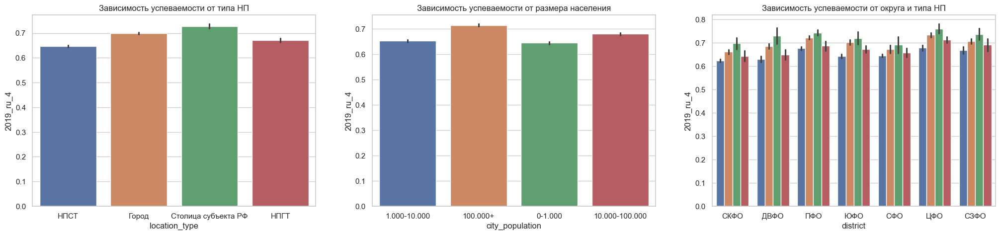

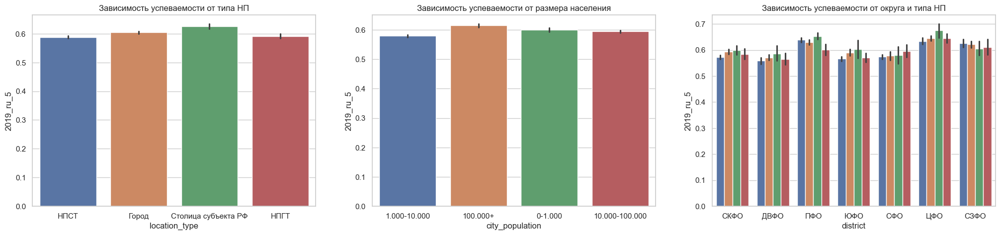

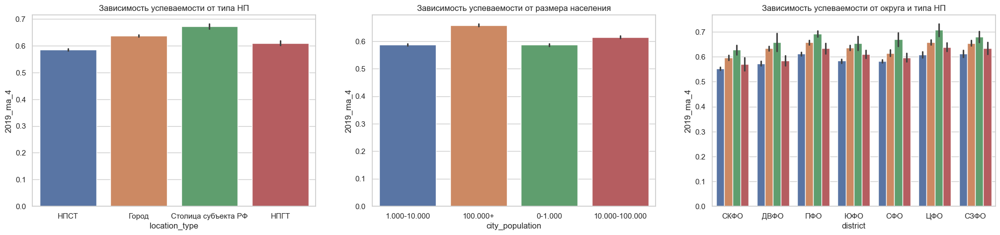

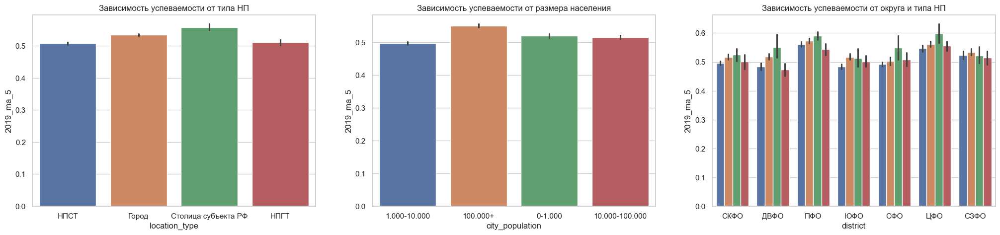

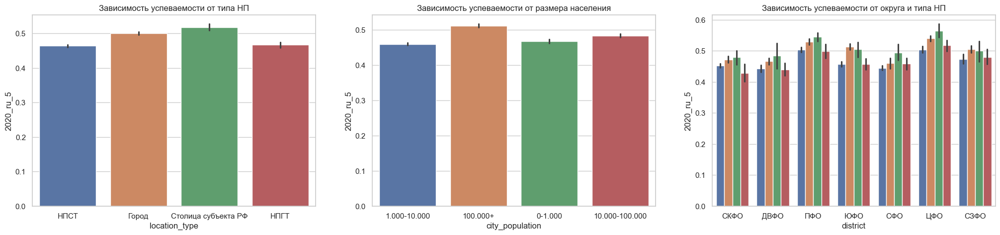

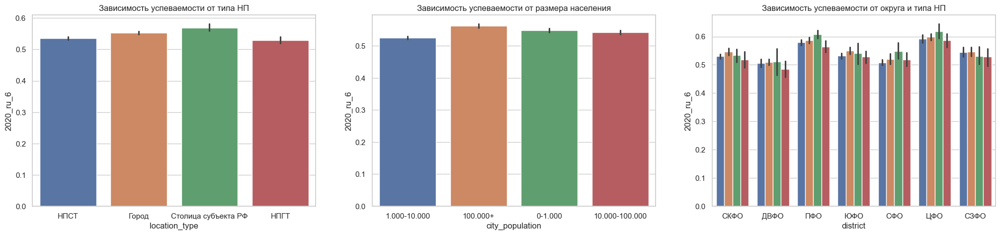

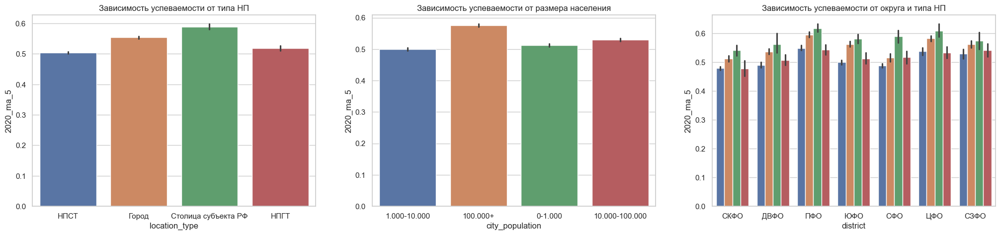

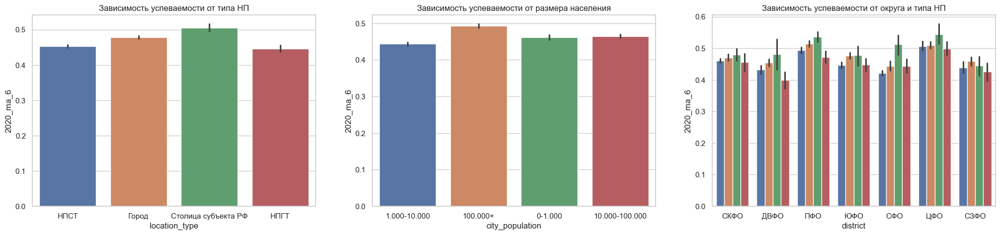

In [217]:
for i, mean_score in enumerate(["2019_ru_4",	"2019_ru_5",	"2019_ma_4",	"2019_ma_5",	"2020_ru_5",	"2020_ru_6",	"2020_ma_5",	"2020_ma_6"]):
    mean_points(schools_df, mean_score, 'location_type')

В целом, можно наблюдать ожидаемую закономерность - наивысшая успеваемость в столицах субъектов РФ, а также в самых крупных городах

Изучим динамику баллов

In [218]:
meaned_df = schools_df[['location_type', "2019_ru_4",	"2019_ru_5",	"2019_ma_4",	"2019_ma_5",	"2020_ru_5",	"2020_ru_6",	"2020_ma_5",	"2020_ma_6"]].groupby('location_type').mean()

In [219]:
meaned_df

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6
location_type,,,,,,,,
Город,0.698341,0.604638,0.636913,0.534306,0.499856,0.553632,0.554344,0.478552
НПГТ,0.671539,0.591833,0.609696,0.511278,0.466871,0.530047,0.518531,0.446412
НПСТ,0.647088,0.588376,0.584941,0.507766,0.463602,0.535771,0.504323,0.453055
Столица субъекта РФ,0.727852,0.625179,0.672655,0.558816,0.517372,0.569676,0.588453,0.505527


In [220]:
def _prepare_data(dataframe, a: str, b: str):
    return list(dataframe[[a,b]].itertuples())

In [221]:
def plot_score_hist(dataframe, a, b):
    fig, axs = plt.subplots(figsize=(10,5))
    data = _prepare_data(dataframe, a, b)
    legend = []
    for d in data:
        print(d)
        y = d[1:]
        x = list(range(0, len(y)))
        legend.append(d[0])
        axs.plot(x,y)
    axs.legend(legend)
    axs.set_title(f'{a} -> {b}')


Pandas(Index='Город', _1=0.6983405013063959, _2=0.499856369560433)
Pandas(Index='НПГТ', _1=0.671538935273728, _2=0.46687119122197934)
Pandas(Index='НПСТ', _1=0.6470876723927508, _2=0.4636022539290156)
Pandas(Index='Столица субъекта РФ', _1=0.7278518241229854, _2=0.5173716951326249)
Pandas(Index='Город', _1=0.6369127058904336, _2=0.5543443782433302)
Pandas(Index='НПГТ', _1=0.6096962387190764, _2=0.5185306617377033)
Pandas(Index='НПСТ', _1=0.5849408909879802, _2=0.504323360112878)
Pandas(Index='Столица субъекта РФ', _1=0.6726548289942678, _2=0.5884531722006879)
Pandas(Index='Город', _1=0.6046376417294128, _2=0.5536317671218891)
Pandas(Index='НПГТ', _1=0.5918333479904843, _2=0.5300474045651106)
Pandas(Index='НПСТ', _1=0.5883757681216696, _2=0.5357713183718205)
Pandas(Index='Столица субъекта РФ', _1=0.6251794858742971, _2=0.5696761444132777)
Pandas(Index='Город', _1=0.5343056543252706, _2=0.47855196850491105)
Pandas(Index='НПГТ', _1=0.5112784168166732, _2=0.4464119003738418)
Pandas(Index='

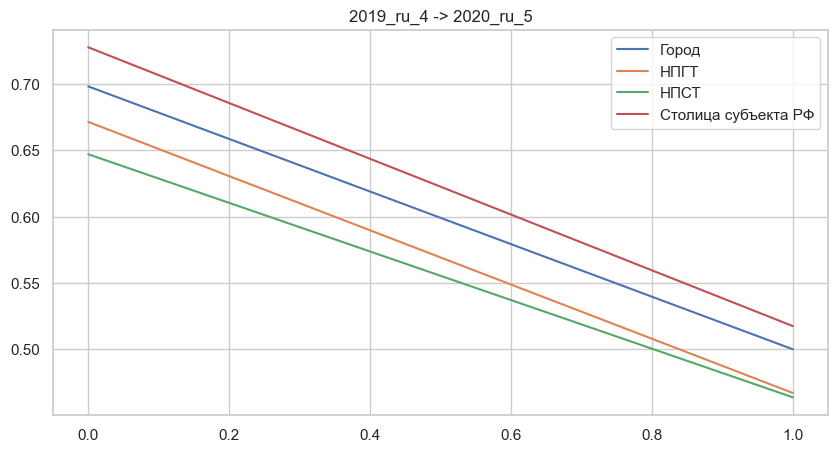

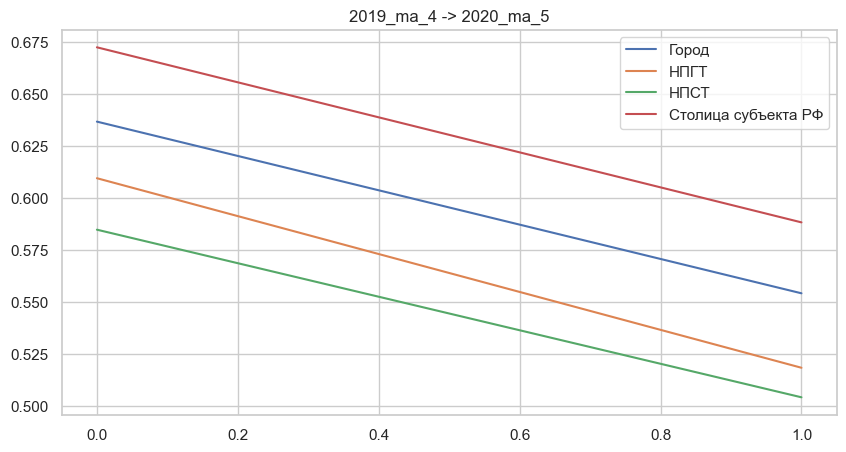

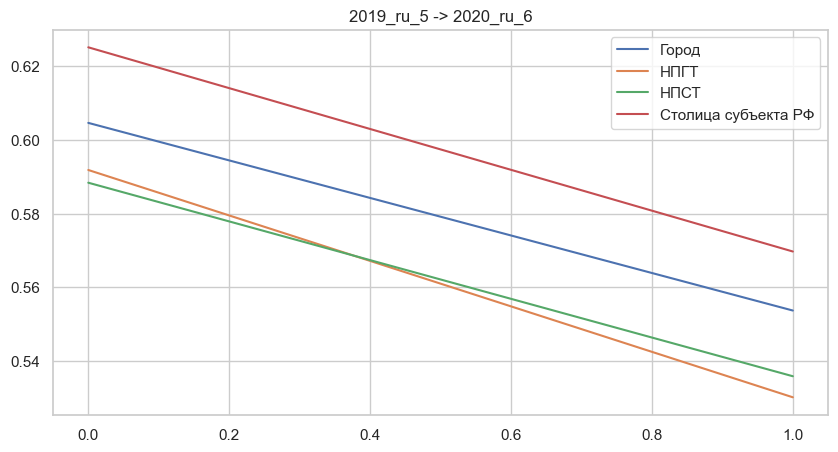

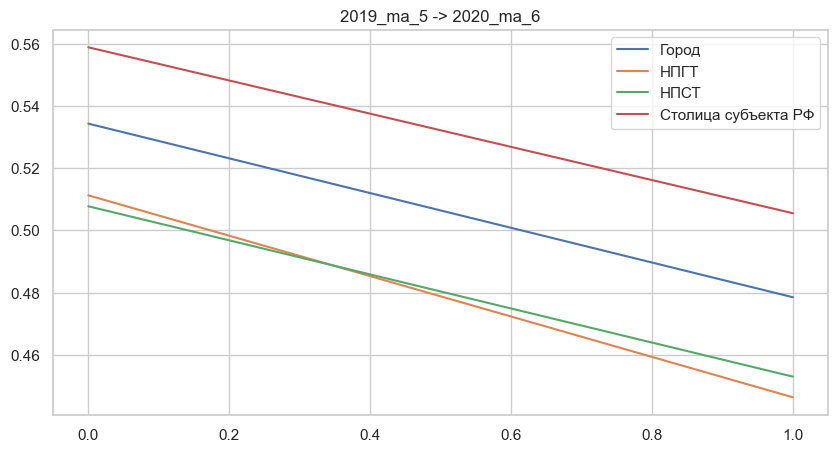

In [222]:
plot_score_hist(meaned_df, '2019_ru_4', '2020_ru_5')
plot_score_hist(meaned_df, '2019_ma_4', '2020_ma_5')
plot_score_hist(meaned_df, '2019_ru_5', '2020_ru_6')
plot_score_hist(meaned_df, '2019_ma_5', '2020_ma_6')

Мы можем наблюдать, что по всем предметам результаты падают.

# Изучение дополнительных признаков

In [224]:
schools_df['elevation_cat']

0       низменность
1       низменность
2       низменность
3       низменность
4       низменность
           ...     
4913    низменность
4914    низменность
4915    низменность
4916    низменность
4917    низменность
Name: elevation_cat, Length: 4918, dtype: object


distance_to_large_city_cat
Значение признака  Абсолютная частота (n)  Доля в выборке (%)
   удалённая_зона                    2679                54.5
        периферия                     816                16.6
         в_городе                     553                11.2
 ближний_пригород                     477                 9.7
    спальный_пояс                     393                 8.0
------------------------------------------------------------

distance_to_federal_road_cat
Значение признака  Абсолютная частота (n)  Доля в выборке (%)
        на_трассе                    2148                43.7
            в_1км                    1306                26.6
           в_15км                     616                12.5
            в_5км                     520                10.6
       далее_15км                     328                 6.7
------------------------------------------------------------

distance_to_railway_station_cat
   Значение признака  Абсолютная частота (n

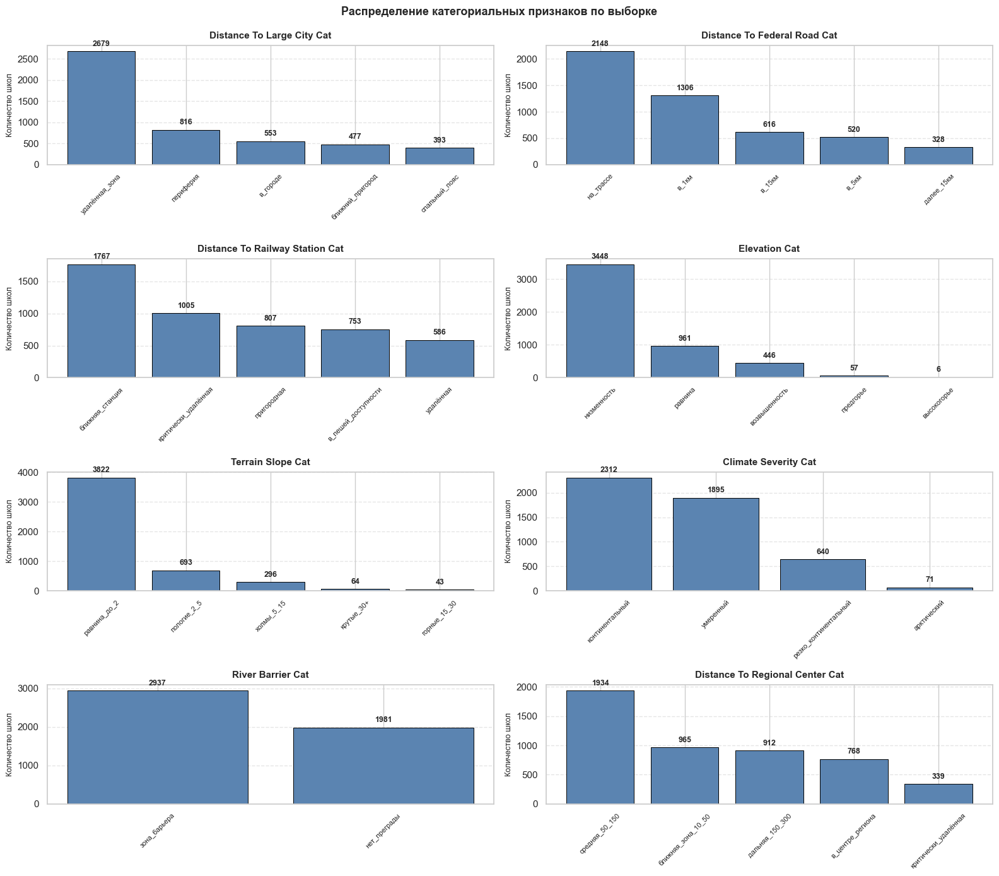

In [228]:
fig, axes = plt.subplots(4, 2, figsize=(16, 14))
axes = axes.flatten()
sns.set_theme(style="whitegrid", font_scale=1.0)

for i, feat in enumerate(['distance_to_large_city_cat', 'distance_to_federal_road_cat',
    'distance_to_railway_station_cat', 'elevation_cat', 'terrain_slope_cat',
    'climate_severity_cat', 'river_barrier_cat', 'distance_to_regional_center_cat']):
    ax = axes[i]
    # value_counts(dropna=False) покажет пропуски, если они есть (важно для отчёта)
    counts = schools_df[feat].value_counts(dropna=False)

    # Цвета в академическом стиле
    bars = ax.bar(counts.index, counts.values, color='#5B84B1', edgecolor='black', linewidth=0.7)

    ax.set_title(feat.replace('_', ' ').title(), fontsize=11, pad=8, fontweight='bold')
    ax.set_ylabel('Количество школ', fontsize=9)
    ax.tick_params(axis='x', rotation=45, labelsize=8)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    # Подписи значений на столбцах
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{int(height)}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 4), textcoords="offset points",
                    ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.suptitle('Распределение категориальных признаков по выборке',
             fontsize=13, y=0.99, fontweight='bold')
plt.tight_layout()


for feat in ['distance_to_large_city_cat', 'distance_to_federal_road_cat',
    'distance_to_railway_station_cat', 'elevation_cat', 'terrain_slope_cat',
    'climate_severity_cat', 'river_barrier_cat', 'distance_to_regional_center_cat']:
    counts = schools_df[feat].value_counts(dropna=False)
    total = counts.sum()

    df_table = pd.DataFrame({
        'Значение признака': counts.index,
        'Абсолютная частота (n)': counts.values,
        'Доля в выборке (%)': (counts.values / total * 100).round(1)
    })

    print(f"\n{feat}")
    print(df_table.to_string(index=False))
    print("-" * 60)

# Кластеризация KModes

In [ ]:
import pandas as pd
import numpy as np
from mykmodes import MyKModes
import matplotlib.pyplot as plt


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "c:\Users\PC\.pyenv\pyenv-win\versions\3.10.11\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\PC\.pyenv\pyenv-win\versions\3.10.11\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "c:\Users\PC\.pyenv\pyenv-win\versions\3.10.11\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "c:\Users\PC\.pyenv\pyenv-win\versions\3.10.11\lib\site-packages\traitlets\config\application.py", line 10

AttributeError: _ARRAY_API not found

ImportError: numpy.core.multiarray failed to import

: 

### Считывание ранее подготовленных данных

In [ ]:
schools_df = pd.read_csv('processed_data/schools_with_coord_features.csv')

In [273]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,...,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat,distance_to_regional_center_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,True,287,0.776316,0.644444,0.658333,0.666667,...,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды,средняя_50_150
1,sch05153592,НПСТ,Карагас,1.000-10.000,False,220,0.641700,0.683838,0.600000,0.568750,...,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды,средняя_50_150
2,sch05153590,НПСТ,Боранчи,100.000+,True,82,0.610048,0.807407,0.600000,0.716667,...,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды,средняя_50_150
3,sch05153460,НПСТ,Некрасовка,0-1.000,False,198,0.501548,0.679365,0.584375,0.510000,...,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды,ближняя_зона_10_50
4,sch28183253,НПСТ,Лазаревка,0-1.000,False,43,0.605263,0.590476,0.475000,0.578571,...,1.284062,равнина_до_2,9.564162e-05,пограничная_до_30км,1,умеренный,1.332083,1,зона_барьера,дальняя_150_300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch27173291,НПСТ,село Дружба,1.000-10.000,False,287,0.663377,0.626389,0.533333,0.428125,...,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды,средняя_50_150
4914,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,False,218,0.713033,0.625000,0.636364,0.552083,...,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера,средняя_50_150
4915,sch10100191,НПСТ,Кубово,100.000+,False,42,0.483553,0.651852,0.493750,0.458333,...,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера,средняя_50_150
4916,sch30103082,НПСТ,Заречное,1.000-10.000,False,225,0.682566,0.515033,0.716667,0.486667,...,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды,дальняя_150_300


### Сведём количество учеников к категориальной переменной

<Axes: >

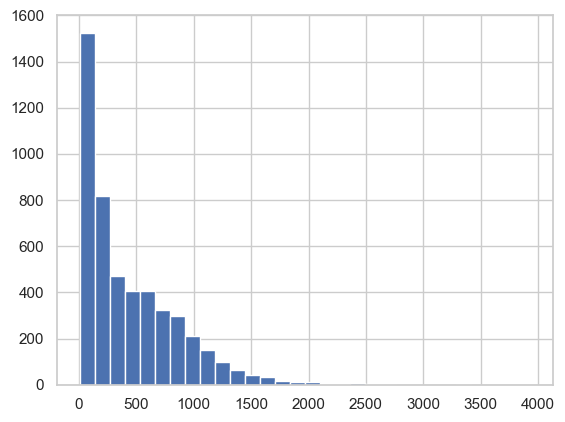

In [274]:
schools_df['pupils_amount'].hist(bins=30)

In [275]:
def categorize_size(x: int):
    if 0 <= x <= 100:
        return '0 - 100'
    elif 100 <= x <= 500:
        return '100 - 500'
    elif 500 <= x <= 1000:
        return '500 - 1000'
    elif x >= 1000:
        return '1000+'


In [276]:
schools_df['pupils_amount'] = schools_df['pupils_amount'].apply(categorize_size)

In [277]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,...,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat,distance_to_regional_center_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,True,100 - 500,0.776316,0.644444,0.658333,0.666667,...,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды,средняя_50_150
1,sch05153592,НПСТ,Карагас,1.000-10.000,False,100 - 500,0.641700,0.683838,0.600000,0.568750,...,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды,средняя_50_150
2,sch05153590,НПСТ,Боранчи,100.000+,True,0 - 100,0.610048,0.807407,0.600000,0.716667,...,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды,средняя_50_150
3,sch05153460,НПСТ,Некрасовка,0-1.000,False,100 - 500,0.501548,0.679365,0.584375,0.510000,...,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды,ближняя_зона_10_50
4,sch28183253,НПСТ,Лазаревка,0-1.000,False,0 - 100,0.605263,0.590476,0.475000,0.578571,...,1.284062,равнина_до_2,9.564162e-05,пограничная_до_30км,1,умеренный,1.332083,1,зона_барьера,дальняя_150_300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch27173291,НПСТ,село Дружба,1.000-10.000,False,100 - 500,0.663377,0.626389,0.533333,0.428125,...,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды,средняя_50_150
4914,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,False,100 - 500,0.713033,0.625000,0.636364,0.552083,...,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера,средняя_50_150
4915,sch10100191,НПСТ,Кубово,100.000+,False,0 - 100,0.483553,0.651852,0.493750,0.458333,...,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера,средняя_50_150
4916,sch30103082,НПСТ,Заречное,1.000-10.000,False,100 - 500,0.682566,0.515033,0.716667,0.486667,...,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды,дальняя_150_300


### Коррекционные школы можно сразу отнести к отдельному кластеру - разделим наш датасет

In [278]:
correctional_schools_df = schools_df[schools_df['is_correctional']]
schools_df = schools_df[schools_df['is_correctional'] == False]

### Методом локтевой кривой определим оптимальные признаки и количество кластеров

BASE_ONLY       | Cost:    6343 | На объект: 1.300
transport_1     | Cost:    8123 | На объект: 1.665
transport_2     | Cost:    8724 | На объект: 1.788
transport_3     | Cost:    8988 | На объект: 1.842
transport_4     | Cost:    8869 | На объект: 1.817
geo_1           | Cost:    7696 | На объект: 1.577
geo_2           | Cost:    7361 | На объект: 1.508
climate         | Cost:    8199 | На объект: 1.680
hydro           | Cost:    8099 | На объект: 1.660
transport_group | Cost:   15951 | На объект: 3.269
geo_group       | Cost:    8785 | На объект: 1.800
FULL_SET        | Cost:   22588 | На объект: 4.629


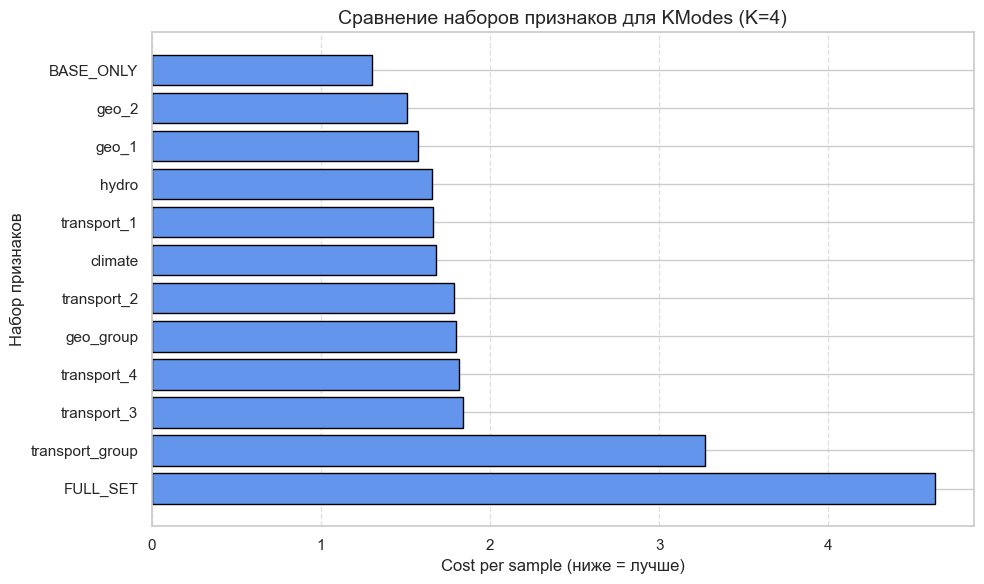

In [280]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mykmodes import MyKModes

K_CLUSTERS = 4
RUNS_AMOUNT = 15
RANDOM_SEED = 42

BASE_FEATURES = ['location_type', 'city_population', 'pupils_amount', 'district']

CANDIDATE_SETS = {
    "BASE_ONLY": [],
    "transport_1": ['distance_to_large_city_cat'],
    "transport_2": ['distance_to_federal_road_cat'],
    "transport_3": ['distance_to_railway_station_cat'],
    "transport_4": ['distance_to_regional_center_cat'],
    "geo_1": ['elevation_cat'],
    "geo_2": ['terrain_slope_cat'],
    "climate": ['climate_severity_cat'],
    "hydro": ['river_barrier_cat'],
    "transport_group": [
        'distance_to_large_city_cat', 'distance_to_federal_road_cat',
        'distance_to_railway_station_cat', 'distance_to_regional_center_cat'
    ],
    "geo_group": ['elevation_cat', 'terrain_slope_cat'],
    "FULL_SET": [
        'distance_to_large_city_cat', 'distance_to_federal_road_cat',
        'distance_to_railway_station_cat', 'distance_to_regional_center_cat',
        'elevation_cat', 'terrain_slope_cat', 'climate_severity_cat', 'river_barrier_cat'
    ]
}

df = schools_df

all_features = BASE_FEATURES + list(set().union(*CANDIDATE_SETS.values()))
valid_features = [f for f in all_features if f in df.columns]

df_proc = df[valid_features].fillna("missing_value").copy()

results = []

for name, add_feats in CANDIDATE_SETS.items():
    current_feats = BASE_FEATURES + add_feats
    if not all(f in df_proc.columns for f in current_feats):
        print(f"️  {name}: пропущены отсутствующие признаки")
        continue

    X = df_proc[current_feats]

    km = MyKModes(
        clusters_amount=K_CLUSTERS,
        max_iterations=100,
        runs_amount=RUNS_AMOUNT,
        logging=False,          # Отключаем вывод для скорости
        random_state=RANDOM_SEED
    )

    labels = km.fit_predict(X)
    cost = km.cost_
    n_samples = len(X)
    cost_per_sample = cost / n_samples

    results.append({
        "set_name": name,
        "features": current_feats,
        "n_features": len(current_feats),
        "cost": cost,
        "cost_per_sample": cost_per_sample,
        "n_samples": n_samples
    })
    print(f"{name:15s} | Cost: {cost:7.0f} | На объект: {cost_per_sample:.3f}")

res_df = pd.DataFrame(results)
res_df = res_df.sort_values("cost_per_sample", ascending=True)


best = res_df.iloc[0]

plt.figure(figsize=(10, 6))
plt.barh(res_df["set_name"][::-1], res_df["cost_per_sample"][::-1], color="cornflowerblue", edgecolor="black")
plt.xlabel("Cost per sample (ниже = лучше)", fontsize=12)
plt.ylabel("Набор признаков", fontsize=12)
plt.title(f"Сравнение наборов признаков для KModes (K={K_CLUSTERS})", fontsize=14)
plt.grid(axis="x", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

level=DEBUG Init: initializing centroids


level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 1 iteration: 1/100, moves: 0, cost: 17022.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 2 iteration: 1/100, moves: 0, cost: 17022.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 3 iteration: 1/100, moves: 0, cost: 17022.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 4 iteration: 1/100, moves: 0, cost: 17022.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 5 iteration: 1/100, moves: 0, cost: 17022.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations.

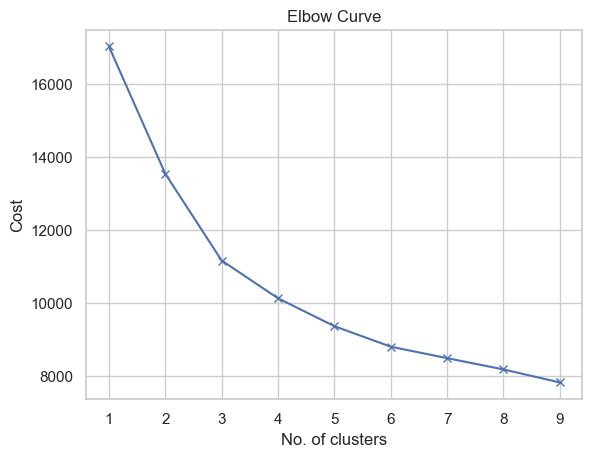

In [ ]:
cost = []
K = range(1,10)
for k in list(K):
    k_prototypes = MyKModes(clusters_amount=k,  runs_amount = 15, logging=True)
    k_prototypes.fit_predict(schools_df[['location_type', 'city_population', 'pupils_amount', 'district','distance_to_large_city_cat','climate_severity_cat']])
    cost.append(k_prototypes.cost_)

plt.plot(K, cost, 'x-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Curve')
plt.show()

Имеем, что оптимальное число кластеров - 4

In [282]:
columns_to_drop = ['lat', 'lon', 'distance_to_regional_center',
       'nearest_region_center', 'distance_to_large_city', 'nearest_large_city', 'distance_to_federal_road',
       'distance_to_federal_road_cat', 'distance_to_railway_station',
       'nearest_railway_station', 'distance_to_railway_station_cat',
       'elevation_meters', 'elevation_cat', 'terrain_slope_degrees',
       'terrain_slope_cat', 'distance_to_border_km', 'border_proximity_cat',
       'climate_severity_index', 'distance_to_river_km', 'river_barrier_flag', 'river_barrier_cat',
       'distance_to_regional_center_cat']
schools_df = schools_df.drop(columns=columns_to_drop, axis=1)
correctional_schools_df = correctional_schools_df.drop(columns=columns_to_drop, axis=1)

In [ ]:
k_prototypes = MyKModes(clusters_amount=4, runs_amount = 5)
clusters = k_prototypes.fit_predict(schools_df[['location_type', 'city_population', 'pupils_amount', 'district', 'distance_to_large_city_cat','climate_severity_cat']])
# попробовать сделать кластеризацию с 'distance_to_federal_road_cat' 'distance_to_railway_station_cat'
clusters

level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...


level=DEBUG Starting clustering iterations...
level=DEBUG Run 1 iteration: 1/100, moves: 1180, cost: 11094.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 2 iteration: 1/100, moves: 1646, cost: 11133.0
level=DEBUG Run 2 iteration: 2/100, moves: 76, cost: 11133.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 3 iteration: 1/100, moves: 986, cost: 10517.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 4 iteration: 1/100, moves: 1363, cost: 10729.0
level=DEBUG Run 4 iteration: 2/100, moves: 50, cost: 10729.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 5 iteration: 1/100, moves: 343, cost: 11595.0
level=DEBUG Run 5 itera

array([2, 2, 0, ..., 0, 2, 0], shape=(4880,), dtype=uint16)

In [284]:
schools_df['cluster'] = clusters

Дадим коррекционным школам отдельный кластер и объединим их в общий датафрейм

In [285]:
correctional_schools_df['cluster'] = 4

In [286]:
schools_df = pd.concat([schools_df, correctional_schools_df], ignore_index=True)

In [287]:
schools_df[schools_df['cluster'] == 0].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1430.000000,1430.0
mean,0.656982,0.611139,0.596940,0.531210,0.479669,0.556776,0.524034,0.472089,0.0
std,0.098382,0.110762,0.091104,0.104996,0.097851,0.120491,0.102944,0.113569,0.0
min,0.131579,0.000000,0.233333,0.000000,0.000000,0.051852,0.050000,0.000000,0.0
25%,0.599641,0.546042,0.540000,0.466667,0.422222,0.483951,0.462500,0.403167,0.0
50%,0.666979,0.622222,0.600000,0.533114,0.484444,0.566591,0.525000,0.475000,0.0
75%,0.722657,0.684188,0.654222,0.592857,0.541376,0.637037,0.582353,0.541769,0.0
max,0.947368,0.955556,0.900000,1.000000,0.777778,0.911111,1.000000,1.000000,0.0


In [288]:
schools_df[schools_df['cluster'] == 1].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,1354.000000,1354.000000,1354.000000,1354.000000,1354.000000,1354.000000,1354.000000,1354.000000,1354.0
mean,0.713275,0.613823,0.655196,0.546926,0.512179,0.563744,0.572602,0.491326,1.0
std,0.072592,0.081926,0.072142,0.079688,0.077507,0.093216,0.075895,0.084488,0.0
min,0.394737,0.265983,0.406875,0.220968,0.281064,0.219798,0.359483,0.127778,1.0
25%,0.670882,0.564300,0.609469,0.494039,0.459215,0.504468,0.521681,0.438638,1.0
50%,0.717293,0.618198,0.653725,0.544821,0.514954,0.568644,0.568562,0.490341,1.0
75%,0.761471,0.664639,0.700514,0.593728,0.567532,0.627024,0.620337,0.541106,1.0
max,0.931964,0.897778,0.917857,0.870000,0.732026,0.875472,0.858065,0.840000,1.0


In [289]:
schools_df[schools_df['cluster'] == 2].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,1557.000000,1557.000000,1557.000000,1557.000000,1557.000000,1557.000000,1557.000000,1557.000000,1557.0
mean,0.645814,0.574014,0.579888,0.492171,0.458678,0.525062,0.495789,0.445839,2.0
std,0.085034,0.086921,0.075473,0.079891,0.080911,0.095077,0.079519,0.084902,0.0
min,0.195291,0.220370,0.327083,0.182353,0.120904,0.106349,0.268421,0.112500,2.0
25%,0.595395,0.520413,0.531818,0.439083,0.406667,0.466667,0.442500,0.393421,2.0
50%,0.649798,0.580000,0.579496,0.492857,0.463248,0.533333,0.492857,0.450000,2.0
75%,0.703158,0.634074,0.629167,0.545294,0.514286,0.590338,0.550000,0.503333,2.0
max,0.878403,0.844444,0.834000,0.788462,0.753439,0.827778,0.850000,0.878947,2.0


In [290]:
schools_df[schools_df['cluster'] == 3].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.000000,539.0
mean,0.653000,0.570174,0.591691,0.491883,0.441546,0.503361,0.491398,0.419106,3.0
std,0.097724,0.106105,0.094183,0.098389,0.093544,0.117283,0.093357,0.103584,0.0
min,0.186842,0.164444,0.233333,0.216667,0.111111,0.102222,0.150000,0.095000,3.0
25%,0.594142,0.510404,0.536042,0.431534,0.380381,0.438801,0.430861,0.352753,3.0
50%,0.656863,0.571717,0.589286,0.491667,0.438384,0.507937,0.494118,0.422500,3.0
75%,0.718334,0.640000,0.649468,0.557692,0.507968,0.574444,0.550000,0.493726,3.0
max,0.956140,0.866667,1.000000,0.850000,0.800000,0.911111,0.800000,0.725000,3.0


In [291]:
schools_df[schools_df['cluster'] == 4].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.0
mean,0.659103,0.603592,0.602122,0.521440,0.446571,0.528188,0.523805,0.455774,4.0
std,0.099508,0.102562,0.084713,0.129064,0.126456,0.137484,0.082556,0.118061,0.0
min,0.415789,0.244444,0.444118,0.142857,0.088889,0.133333,0.308333,0.164286,4.0
25%,0.600820,0.546448,0.546250,0.473721,0.423146,0.484722,0.470625,0.388324,4.0
50%,0.664317,0.626508,0.594643,0.537829,0.475814,0.572982,0.542017,0.453623,4.0
75%,0.721377,0.670238,0.655597,0.588080,0.524260,0.610380,0.576422,0.539833,4.0
max,0.826870,0.807407,0.820755,0.730769,0.639589,0.752490,0.663415,0.708451,4.0


In [292]:
schools_df.to_csv('clustered_success.csv', index=False)

In [293]:
k_prototypes.cluster_centroids_

array([['НПСТ', '0-1.000', '0 - 100', 'ПФО', 'удалённая_зона',
        'континентальный'],
       ['Город', '100.000+', '500 - 1000', 'ПФО', 'в_городе',
        'континентальный'],
       ['НПСТ', '1.000-10.000', '100 - 500', 'СКФО', 'удалённая_зона',
        'умеренный'],
       ['НПСТ', '0-1.000', '100 - 500', 'СФО', 'удалённая_зона',
        'резко_континентальный']], dtype='<U21')

In [294]:
import json
with open('centroids.txt', 'w') as f:
    json.dump(list(k_prototypes.cluster_centroids_.tolist()), f)

# Изучение получившихся кластеров

In [1]:
import pandas as pd
import json
import seaborn as sns
from matplotlib import pyplot as plt

In [ ]:
schools_df = pd.read_csv('clustered_success.csv')
with open('centroids.txt', 'r') as f:
    centroids = json.load(f)

In [3]:
centroids

[['НПСТ', '0-1.000', '0 - 100', 'ПФО', 'удалённая_зона', 'континентальный'],
 ['Город', '100.000+', '500 - 1000', 'ПФО', 'в_городе', 'континентальный'],
 ['НПСТ', '1.000-10.000', '100 - 500', 'СКФО', 'удалённая_зона', 'умеренный'],
 ['НПСТ',
  '0-1.000',
  '100 - 500',
  'СФО',
  'удалённая_зона',
  'резко_континентальный']]

In [4]:
schools_df[schools_df['cluster'] == 0].sample(3)

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,climate_severity_cat,cluster
3426,sch13130006,НПГТ,Октябрьский,0-1.000,False,0 - 100,0.605263,0.396825,0.525000,0.3950,0.597531,0.644444,0.555556,0.468750,ПФО,удалённая_зона,континентальный,0
2831,sch10103019,Город,Питкяранта,10.000-100.000,False,100 - 500,0.647129,0.567251,0.606383,0.4925,0.419444,0.472072,0.509091,0.380488,СЗФО,удалённая_зона,континентальный,0
2970,sch27173258,НПСТ,Новая Иня,0-1.000,False,0 - 100,0.800000,0.422222,0.680000,0.5500,0.344444,0.614815,0.450000,0.457143,ДВФО,удалённая_зона,умеренный,0


In [5]:
schools_df[schools_df['cluster'] == 1].sample(3)

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,climate_severity_cat,cluster
1628,sch12123146,Город,Волжск,10.000-100.000,False,500 - 1000,0.730507,0.469048,0.685455,0.400000,0.517745,0.637726,0.650000,0.474444,ПФО,периферия,континентальный,1
2976,sch25153462,Город,Находка,100.000+,False,1000+,0.661654,0.747712,0.602451,0.678641,0.466049,0.484870,0.606466,0.457500,ДВФО,удалённая_зона,умеренный,1
4021,sch13130090,Столица субъекта РФ,г.Саранск,100.000+,False,100 - 500,0.753289,0.694017,0.697872,0.574074,0.555556,0.571274,0.575000,0.519512,ПФО,в_городе,континентальный,1


In [6]:
schools_df[schools_df['cluster'] == 2].sample(3)

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,climate_severity_cat,cluster
4014,sch05153318,НПСТ,Маджалис,1.000-10.000,False,500 - 1000,0.780294,0.697727,0.537791,0.645882,0.478388,0.645542,0.420787,0.476220,СКФО,удалённая_зона,умеренный,2
3317,sch33133047,НПСТ,Золотково,1.000-10.000,False,100 - 500,0.716066,0.666032,0.575000,0.584286,0.515873,0.619259,0.543103,0.488889,ЦФО,удалённая_зона,континентальный,2
4783,sch23133315,НПСТ,Центральный,1.000-10.000,False,100 - 500,0.723684,0.602778,0.650000,0.453125,0.385965,0.619608,0.386364,0.544118,ЮФО,спальный_пояс,континентальный,2


In [7]:
schools_df[schools_df['cluster'] == 3].sample(3)

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,climate_severity_cat,cluster
4110,sch22123501,НПСТ,Корчино,0-1.000,False,100 - 500,0.624402,0.635556,0.590909,0.570000,0.367677,0.375556,0.542857,0.288889,СФО,удалённая_зона,континентальный,3
1167,sch22123375,НПСТ,Новозыково,0-1.000,False,100 - 500,0.669591,0.714530,0.584211,0.457692,0.562963,0.495556,0.527778,0.352941,СФО,удалённая_зона,континентальный,3
3419,sch24143304,НПСТ,Манзя,1.000-10.000,False,100 - 500,0.678138,0.614379,0.603846,0.414706,0.415385,0.563636,0.475000,0.455556,СФО,удалённая_зона,резко_континентальный,3


In [8]:
schools_df[schools_df['cluster'] == 4].sample(3)

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,climate_severity_cat,cluster
4897,sch27173100,Город,Комсомольск-на-Амуре,100.000+,True,500 - 1000,0.826216,0.780889,0.820755,0.730769,0.639039,0.652525,0.663415,0.665385,ДВФО,удалённая_зона,резко_континентальный,4
4893,sch24146199,Город,Красноярск,100.000+,True,100 - 500,0.415789,0.244444,0.550000,0.142857,0.088889,0.152381,0.308333,0.385714,СФО,ближний_пригород,резко_континентальный,4
4905,sch05153793,НПСТ,Костек,1.000-10.000,True,500 - 1000,0.597744,0.558781,0.589286,0.472414,0.490159,0.629060,0.460563,0.508730,СКФО,спальный_пояс,умеренный,4


In [9]:
import numpy as np

Определим функцию для отрисовки HeatMap по населению и кол-ву учеников

In [33]:
def get_heatmap_df1(df, cluster = None):
    if cluster is not None:
        return df[df['cluster']==cluster][['city_population', 'pupils_amount']].pivot_table(index='city_population',columns='pupils_amount',aggfunc=len)
    return df[['city_population', 'pupils_amount']].pivot_table(index='city_population',columns='pupils_amount',aggfunc=len)

def get_heatmap_df2(df, cluster = None):
    if cluster is not None:
        return df[df['cluster']==cluster][['distance_to_large_city_cat', 'climate_severity_cat']].pivot_table(index='distance_to_large_city_cat',columns='climate_severity_cat',aggfunc=len)
    return df[['distance_to_large_city_cat', 'climate_severity_cat']].pivot_table(index='distance_to_large_city_cat',columns='climate_severity_cat',aggfunc=len)


def get_hist_by_cluster(df, cluster = None, feature='district'):
    if cluster is not None:
        return df[df['cluster'] == cluster][feature].hist()
    return df[feature].hist()

Посмотрим распределение по размерам городов и кол-ву учеников на общей выборке, а затем по кластерам

<Axes: xlabel='pupils_amount', ylabel='city_population'>

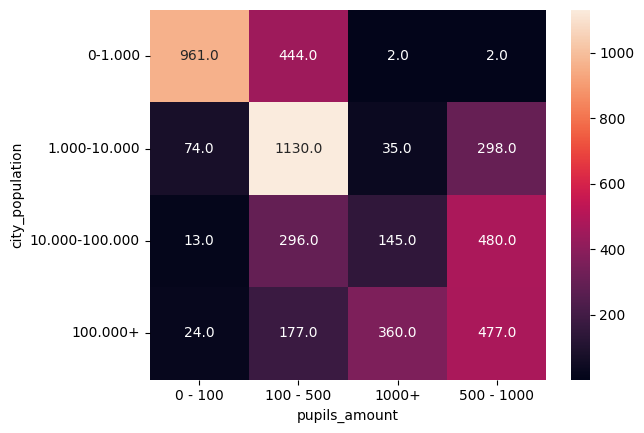

In [34]:
sns.heatmap(data=get_heatmap_df1(schools_df), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

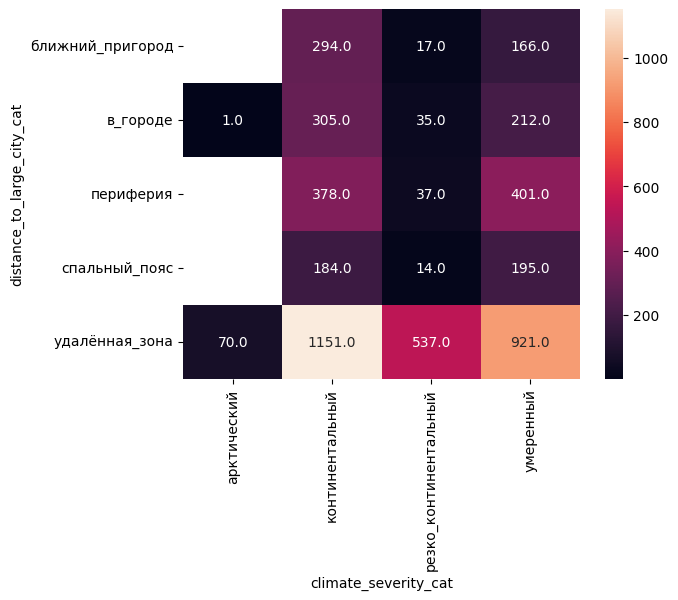

In [35]:
sns.heatmap(data=get_heatmap_df2(schools_df), annot=True, fmt=".1f")

<Axes: >

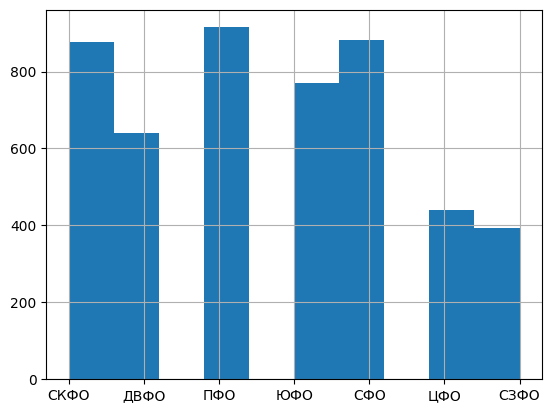

In [36]:
get_hist_by_cluster(schools_df)

# 1 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

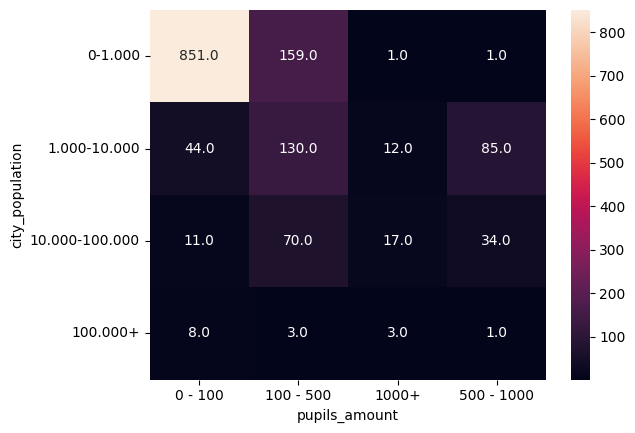

In [37]:
sns.heatmap(data=get_heatmap_df1(schools_df, 0), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

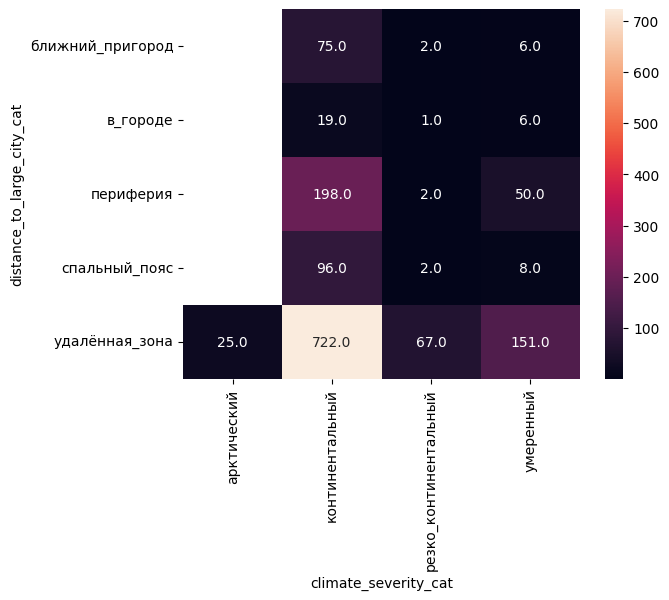

In [38]:
sns.heatmap(data=get_heatmap_df2(schools_df, 0), annot=True, fmt=".1f")

<Axes: >

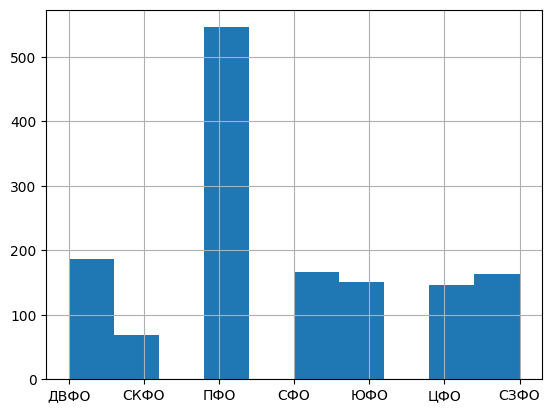

In [39]:
get_hist_by_cluster(schools_df, 0)

# 2 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

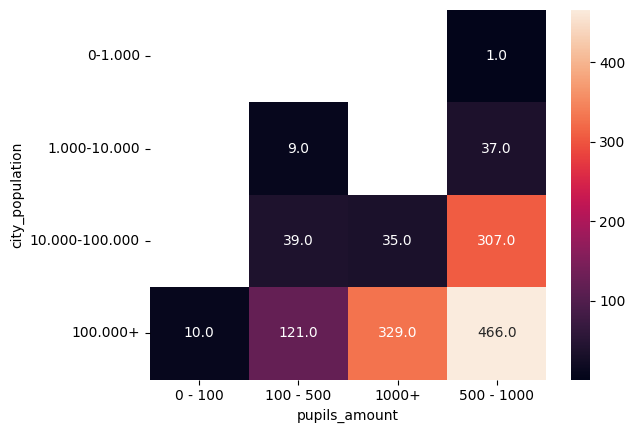

In [41]:
sns.heatmap(data=get_heatmap_df1(schools_df, 1), annot=True, fmt=".1f")


<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

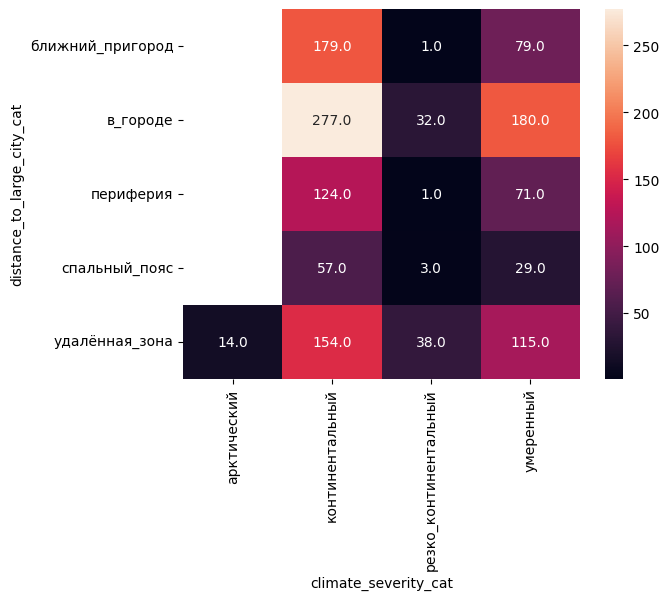

In [42]:
sns.heatmap(data=get_heatmap_df2(schools_df, 1), annot=True, fmt=".1f")

<Axes: >

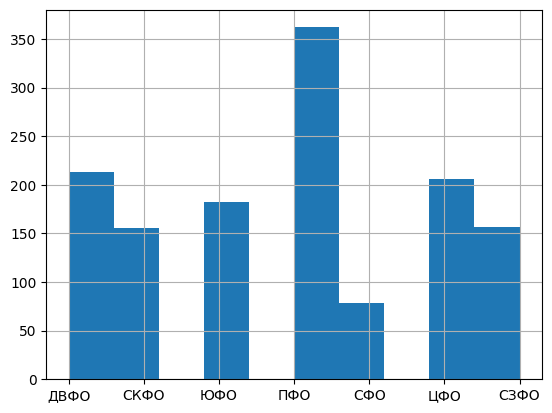

In [43]:
get_hist_by_cluster(schools_df, 1)

# 3 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

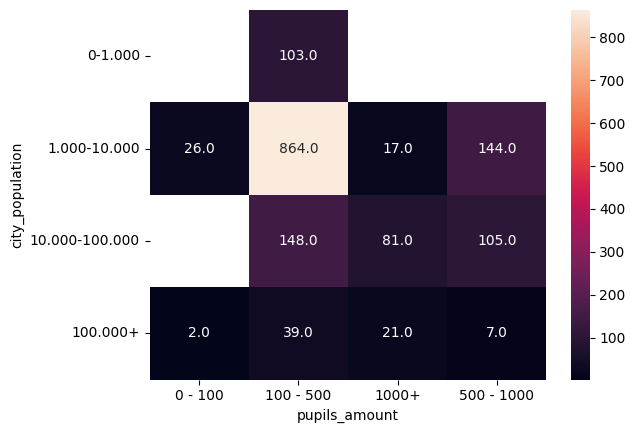

In [44]:
sns.heatmap(data=get_heatmap_df1(schools_df, 2), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

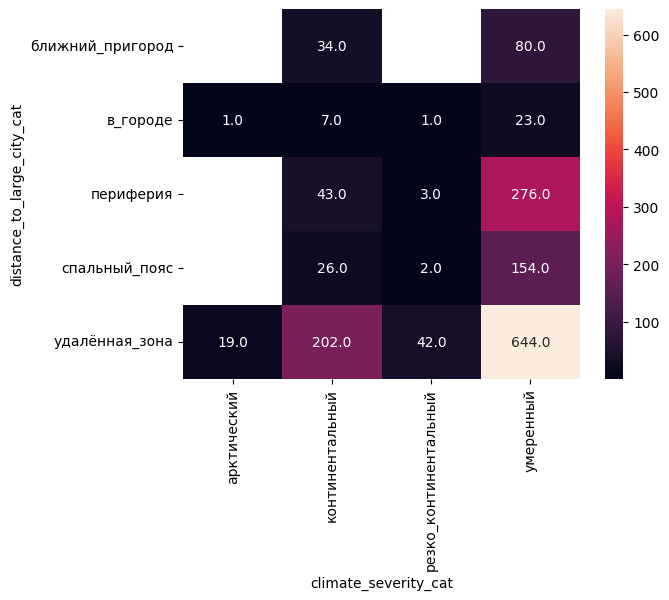

In [45]:
sns.heatmap(data=get_heatmap_df2(schools_df, 2), annot=True, fmt=".1f")

<Axes: >

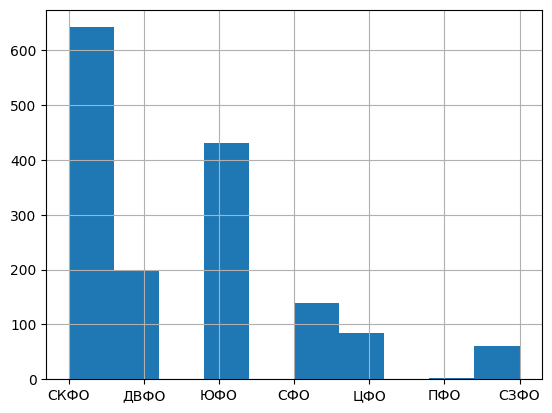

In [46]:
get_hist_by_cluster(schools_df, 2)

# 4 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

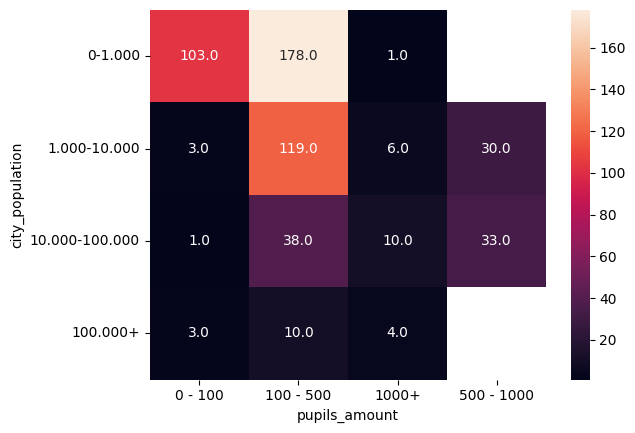

In [47]:
sns.heatmap(data=get_heatmap_df1(schools_df, 3), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

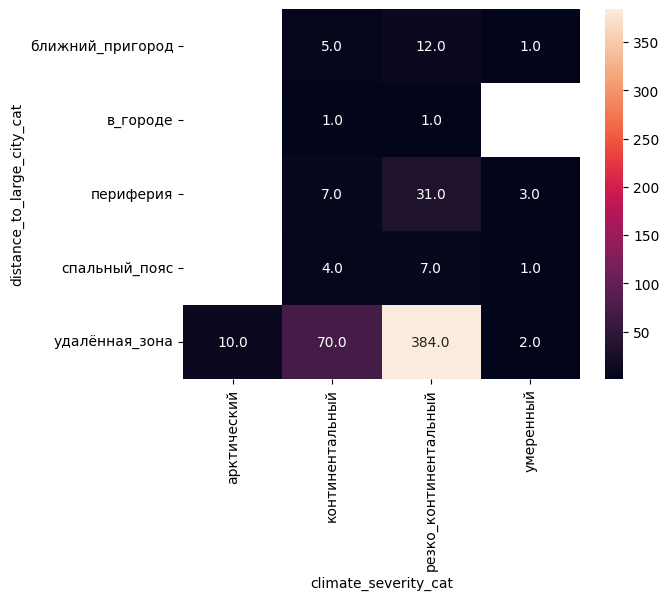

In [48]:
sns.heatmap(data=get_heatmap_df2(schools_df, 3), annot=True, fmt=".1f")

<Axes: >

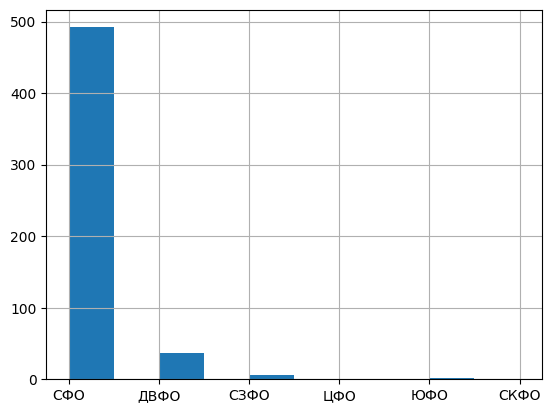

In [49]:
get_hist_by_cluster(schools_df, 3)

# 5 кластер (коррекционные)

<Axes: xlabel='pupils_amount', ylabel='city_population'>

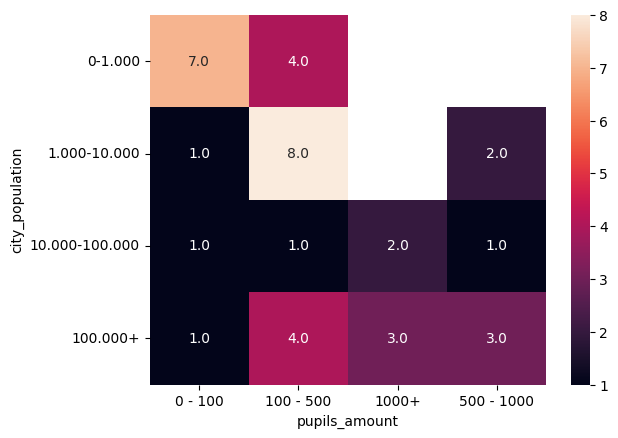

In [50]:
sns.heatmap(data=get_heatmap_df1(schools_df, 4), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

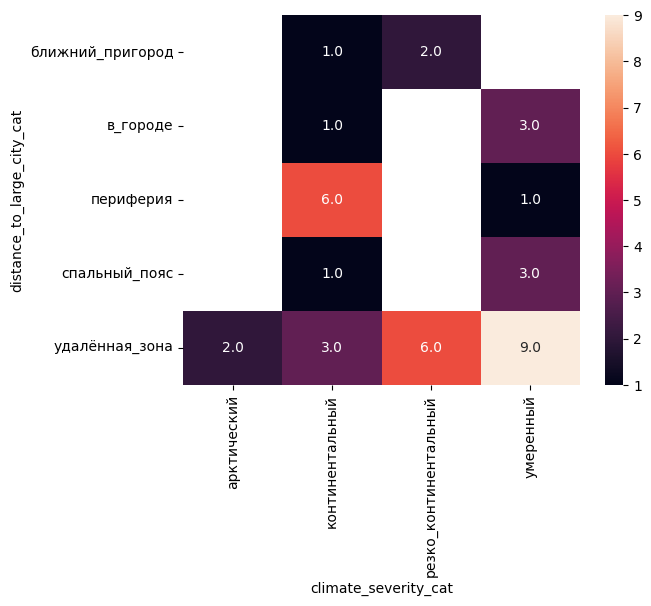

In [51]:
sns.heatmap(data=get_heatmap_df2(schools_df, 4), annot=True, fmt=".1f")

<Axes: >

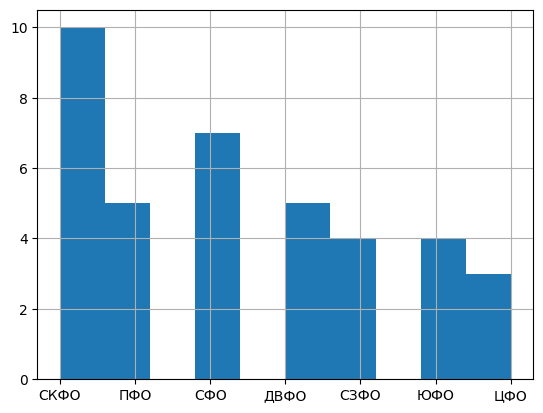

In [52]:
get_hist_by_cluster(schools_df, 4)

- визуализировать школы на карте
- визуализировать кластера на карте
- попробовать кластеризовать с дополнительными признаками 'distance_to_federal_road_cat', 'distance_to_railway_station_cat' 
- попробовать поменять кол-во кластеров
- сделать вторую кластеризацию (KPrototypes)
- посмотреть на корреляцию между успеваемостью и кластерами
ЯКОРЬ

In [3]:
import pandas as pd
import json
import seaborn as sns
from matplotlib import pyplot as plt
schools_df = pd.read_csv('clustered_success.csv')
with open('centroids.txt', 'r') as f:
    centroids = json.load(f)
df_with_coords = pd.read_csv('processed_data/schools_with_coord_features.csv')

In [5]:
df_with_coords


,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,...,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat,distance_to_regional_center_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,True,287,0.776316,0.644444,0.658333,0.666667,...,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды,средняя_50_150
1,sch05153592,НПСТ,Карагас,1.000-10.000,False,220,0.641700,0.683838,0.600000,0.568750,...,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды,средняя_50_150
2,sch05153590,НПСТ,Боранчи,100.000+,True,82,0.610048,0.807407,0.600000,0.716667,...,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды,средняя_50_150
3,sch05153460,НПСТ,Некрасовка,0-1.000,False,198,0.501548,0.679365,0.584375,0.510000,...,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды,ближняя_зона_10_50
4,sch28183253,НПСТ,Лазаревка,0-1.000,False,43,0.605263,0.590476,0.475000,0.578571,...,1.284062,равнина_до_2,9.564162e-05,пограничная_до_30км,1,умеренный,1.332083,1,зона_барьера,дальняя_150_300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch27173291,НПСТ,село Дружба,1.000-10.000,False,287,0.663377,0.626389,0.533333,0.428125,...,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды,средняя_50_150
4914,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,False,218,0.713033,0.625000,0.636364,0.552083,...,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера,средняя_50_150
4915,sch10100191,НПСТ,Кубово,100.000+,False,42,0.483553,0.651852,0.493750,0.458333,...,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера,средняя_50_150
4916,sch30103082,НПСТ,Заречное,1.000-10.000,False,225,0.682566,0.515033,0.716667,0.486667,...,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды,дальняя_150_300


In [10]:
schools_df['lat'] = df_with_coords['lat']
schools_df['lon'] = df_with_coords['lon']

In [11]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,climate_severity_cat,cluster,lat,lon
0,sch05153592,НПСТ,Карагас,1.000-10.000,False,100 - 500,0.641700,0.683838,0.600000,0.568750,0.558974,0.516239,0.5800,0.484615,СКФО,удалённая_зона,умеренный,2,44.158394,45.623682
1,sch05153460,НПСТ,Некрасовка,0-1.000,False,100 - 500,0.501548,0.679365,0.584375,0.510000,0.525556,0.598765,0.5125,0.369444,СКФО,спальный_пояс,умеренный,2,44.255992,45.383536
2,sch28183253,НПСТ,Лазаревка,0-1.000,False,0 - 100,0.605263,0.590476,0.475000,0.578571,0.566667,0.600000,0.5500,0.490000,ДВФО,удалённая_зона,умеренный,0,44.215541,45.531833
3,sch28186020,НПСТ,Буссе,0-1.000,False,0 - 100,0.736842,0.755556,0.580000,0.800000,0.555556,0.488889,0.7000,0.450000,ДВФО,удалённая_зона,резко_континентальный,0,48.351537,135.234497
4,sch05156206,НПСТ,Цанатль,0-1.000,False,0 - 100,0.403509,0.450000,0.366667,0.387500,0.283333,0.528889,0.4125,0.410000,СКФО,периферия,умеренный,0,44.347573,133.411513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch05153262,НПСТ,Джалган,0-1.000,True,0 - 100,0.578947,0.463889,0.483333,0.555556,0.468889,0.537037,0.3850,0.458333,СКФО,удалённая_зона,умеренный,4,42.240163,48.004948
4914,sch11116082,Город,Воркута,10.000-100.000,True,100 - 500,0.570850,0.624444,0.557692,0.600000,0.430769,0.452778,0.5000,0.263636,СЗФО,удалённая_зона,арктический,4,56.253823,41.309117
4915,sch27173318,Город,Комсомольск-на-Амуре,100.000+,True,100 - 500,0.718228,0.591111,0.614286,0.362500,0.578431,0.580781,0.6250,0.396154,ДВФО,удалённая_зона,резко_континентальный,4,61.949586,37.169885
4916,sch22123773,НПСТ,Никольское,0-1.000,True,100 - 500,0.720096,0.603704,0.526471,0.541667,0.446667,0.268056,0.5100,0.329412,СФО,удалённая_зона,резко_континентальный,4,51.657741,43.142866


In [ ]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

def plot_clusters_russia(df, lat_col='lat', lon_col='lon', cluster_col='cluster',
                         zoom_start=4, output_file='clusters_map.html'):
    """
    Интерактивная карта кластеров с возможностью фильтрации по чекбоксам.
    """
    # 1. Валидация
    valid_df = df.dropna(subset=[lat_col, lon_col, cluster_col]).copy()
    if valid_df.empty:
        raise ValueError("Нет данных для отображения. Проверьте координаты и колонку кластеров.")

    # 2. Инициализация карты
    m = folium.Map(location=[65, 100], zoom_start=zoom_start, tiles='CartoDB positron')

    # 3. Цвета и список кластеров
    colors = ['blue', 'red', 'green', 'orange', 'purple', 'cyan', 'pink', 'black']
    clusters = sorted(valid_df[cluster_col].unique())

    # 4. Создание слоёв для каждого кластера
    for i, c in enumerate(clusters):
        cluster_df = valid_df[valid_df[cluster_col] == c]

        # FeatureGroup отвечает за видимость слоя (чекбокс)
        fg = folium.FeatureGroup(name=f"Кластер {c}", show=True)
        # MarkerCluster группирует точки при отдалении для производительности
        mc = MarkerCluster().add_to(fg)

        for _, row in cluster_df.iterrows():
            folium.CircleMarker(
                location=[row[lat_col], row[lon_col]],
                radius=3,
                color=colors[i % len(colors)],
                fill=True,
                fill_color=colors[i % len(colors)],
                fill_opacity=0.8,
                popup=f"Кластер: {c}"
            ).add_to(mc)

        fg.add_to(m)

    # 5. Панель управления слоями (чекбоксы)
    # collapsed=False делает чекбоксы видимыми сразу
    folium.LayerControl(collapsed=False).add_to(m)

    # 6. Сохранение
    m.save(output_file)
    print(f"✅ Карта сохранена: {output_file}")
    print("💡 Используйте чекбоксы справа вверху для фильтрации кластеров.")
    return m

In [19]:
plot_clusters_russia(
    df=schools_df,
    cluster_col='cluster',
    output_file='schools_clusters_map.html'
)

✅ Карта сохранена: schools_clusters_map.html
💡 Используйте чекбоксы справа вверху для фильтрации кластеров.


In [16]:
schools_df[schools_df['cluster'] == 0]

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,climate_severity_cat,cluster,lat,lon
2,sch28183253,НПСТ,Лазаревка,0-1.000,False,0 - 100,0.605263,0.590476,0.475000,0.578571,0.566667,0.600000,0.55000,0.490000,ДВФО,удалённая_зона,умеренный,0,44.215541,45.531833
3,sch28186020,НПСТ,Буссе,0-1.000,False,0 - 100,0.736842,0.755556,0.580000,0.800000,0.555556,0.488889,0.70000,0.450000,ДВФО,удалённая_зона,резко_континентальный,0,48.351537,135.234497
4,sch05156206,НПСТ,Цанатль,0-1.000,False,0 - 100,0.403509,0.450000,0.366667,0.387500,0.283333,0.528889,0.41250,0.410000,СКФО,периферия,умеренный,0,44.347573,133.411513
5,sch28183178,НПСТ,Желтоярово,0-1.000,False,0 - 100,0.482456,0.484848,0.361111,0.466667,0.622222,0.514286,0.57500,0.461111,ДВФО,удалённая_зона,резко_континентальный,0,51.224218,126.917352
7,sch28183087,НПСТ,Куприяновка,0-1.000,False,0 - 100,0.662281,0.638095,0.525000,0.421429,0.462222,0.595556,0.65000,0.415000,ДВФО,удалённая_зона,умеренный,0,51.522463,128.432455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,sch30103098,НПСТ,Михайловка,0-1.000,False,0 - 100,0.739035,0.587302,0.579167,0.566667,0.503704,0.436111,0.60000,0.463636,ЮФО,удалённая_зона,континентальный,0,55.660402,40.560636
4870,sch23133348,НПСТ,Балковская,0-1.000,False,0 - 100,0.743421,0.438889,0.575000,0.587500,0.400000,0.562963,0.57500,0.683333,ЮФО,удалённая_зона,умеренный,0,56.302067,90.518137
4872,sch12126012,НПСТ,Сардаял,0-1.000,False,0 - 100,0.794737,0.677778,0.760000,0.850000,0.300000,0.705556,0.50000,0.675000,ПФО,удалённая_зона,континентальный,0,61.794323,34.313628
4877,sch10100191,НПСТ,Кубово,100.000+,False,0 - 100,0.483553,0.651852,0.493750,0.458333,0.344444,0.451852,0.30000,0.316667,СЗФО,удалённая_зона,континентальный,0,61.763863,34.434009


# Кластеризация с признаками "расстояние до трассы" и "расстояние до жд станции"

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mykmodes import MyKModes

In [48]:
schools_df = pd.read_csv('processed_data/schools_with_coord_features.csv')

In [49]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,...,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat,distance_to_regional_center_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,True,287,0.776316,0.644444,0.658333,0.666667,...,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды,средняя_50_150
1,sch05153592,НПСТ,Карагас,1.000-10.000,False,220,0.641700,0.683838,0.600000,0.568750,...,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды,средняя_50_150
2,sch05153590,НПСТ,Боранчи,100.000+,True,82,0.610048,0.807407,0.600000,0.716667,...,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды,средняя_50_150
3,sch05153460,НПСТ,Некрасовка,0-1.000,False,198,0.501548,0.679365,0.584375,0.510000,...,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды,ближняя_зона_10_50
4,sch28183253,НПСТ,Лазаревка,0-1.000,False,43,0.605263,0.590476,0.475000,0.578571,...,1.284062,равнина_до_2,9.564162e-05,пограничная_до_30км,1,умеренный,1.332083,1,зона_барьера,дальняя_150_300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch27173291,НПСТ,село Дружба,1.000-10.000,False,287,0.663377,0.626389,0.533333,0.428125,...,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды,средняя_50_150
4914,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,False,218,0.713033,0.625000,0.636364,0.552083,...,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера,средняя_50_150
4915,sch10100191,НПСТ,Кубово,100.000+,False,42,0.483553,0.651852,0.493750,0.458333,...,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера,средняя_50_150
4916,sch30103082,НПСТ,Заречное,1.000-10.000,False,225,0.682566,0.515033,0.716667,0.486667,...,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды,дальняя_150_300


In [50]:
def categorize_size(x: int):
    if 0 <= x <= 100:
        return '0 - 100'
    elif 100 <= x <= 500:
        return '100 - 500'
    elif 500 <= x <= 1000:
        return '500 - 1000'
    elif x >= 1000:
        return '1000+'
schools_df['pupils_amount'] = schools_df['pupils_amount'].apply(categorize_size)

In [51]:
schools_df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,...,terrain_slope_degrees,terrain_slope_cat,distance_to_border_km,border_proximity_cat,climate_severity_index,climate_severity_cat,distance_to_river_km,river_barrier_flag,river_barrier_cat,distance_to_regional_center_cat
0,sch05153601,НПСТ,Червленные-буруны,1.000-10.000,True,100 - 500,0.776316,0.644444,0.658333,0.666667,...,0.177509,равнина_до_2,3.307607e-05,пограничная_до_30км,1,умеренный,54.947777,0,нет_преграды,средняя_50_150
1,sch05153592,НПСТ,Карагас,1.000-10.000,False,100 - 500,0.641700,0.683838,0.600000,0.568750,...,0.305364,равнина_до_2,3.620786e-05,пограничная_до_30км,1,умеренный,46.097042,0,нет_преграды,средняя_50_150
2,sch05153590,НПСТ,Боранчи,100.000+,True,0 - 100,0.610048,0.807407,0.600000,0.716667,...,0.102939,равнина_до_2,9.107665e-06,пограничная_до_30км,1,умеренный,52.137157,0,нет_преграды,средняя_50_150
3,sch05153460,НПСТ,Некрасовка,0-1.000,False,100 - 500,0.501548,0.679365,0.584375,0.510000,...,4.274559,пологие_2_5,1.886977e-05,пограничная_до_30км,1,умеренный,5.511909,0,нет_преграды,ближняя_зона_10_50
4,sch28183253,НПСТ,Лазаревка,0-1.000,False,0 - 100,0.605263,0.590476,0.475000,0.578571,...,1.284062,равнина_до_2,9.564162e-05,пограничная_до_30км,1,умеренный,1.332083,1,зона_барьера,дальняя_150_300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch27173291,НПСТ,село Дружба,1.000-10.000,False,100 - 500,0.663377,0.626389,0.533333,0.428125,...,1.384311,равнина_до_2,8.351788e-07,пограничная_до_30км,1,умеренный,2.934419,0,нет_преграды,средняя_50_150
4914,sch33133194,НПГТ,пгт. Мелехово,1.000-10.000,False,100 - 500,0.713033,0.625000,0.636364,0.552083,...,1.202113,равнина_до_2,6.921112e-06,пограничная_до_30км,2,континентальный,0.777355,1,зона_барьера,средняя_50_150
4915,sch10100191,НПСТ,Кубово,100.000+,False,0 - 100,0.483553,0.651852,0.493750,0.458333,...,0.000000,равнина_до_2,9.149107e-05,пограничная_до_30км,2,континентальный,0.616835,1,зона_барьера,средняя_50_150
4916,sch30103082,НПСТ,Заречное,1.000-10.000,False,100 - 500,0.682566,0.515033,0.716667,0.486667,...,0.374763,равнина_до_2,2.252657e-05,пограничная_до_30км,2,континентальный,3.346009,0,нет_преграды,дальняя_150_300


In [52]:
correctional_schools_df = schools_df[schools_df['is_correctional']]
schools_df = schools_df[schools_df['is_correctional'] == False]

level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 1 iteration: 1/100, moves: 0, cost: 22909.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 2 iteration: 1/100, moves: 0, cost: 22909.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 3 iteration: 1/100, moves: 0, cost: 22909.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 4 iteration: 1/100, moves: 0, cost: 22909.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 5 iteration: 1/100, moves: 0, cost: 22909.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
le

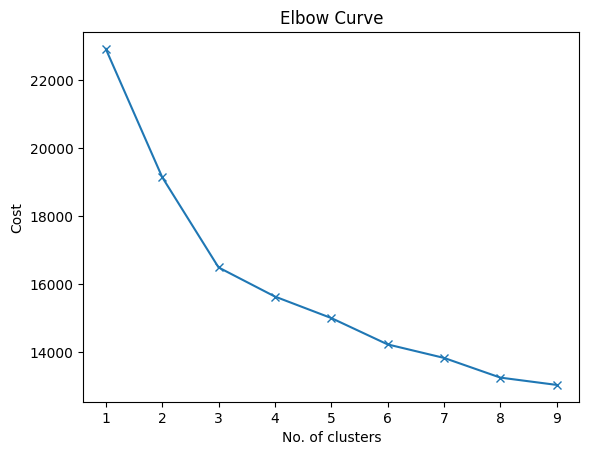

In [53]:
cost = []
K = range(1,10)
for k in list(K):
    k_prototypes = MyKModes(clusters_amount=k,  runs_amount = 15, logging=True)
    k_prototypes.fit_predict(schools_df[['location_type', 'city_population', 'pupils_amount', 'district','distance_to_large_city_cat','climate_severity_cat', 'distance_to_federal_road_cat',
        'distance_to_railway_station_cat']])
    cost.append(k_prototypes.cost_)

plt.plot(K, cost, 'x-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Curve')
plt.show()

In [54]:
columns_to_drop = ['lat', 'lon', 'distance_to_regional_center',
       'nearest_region_center', 'distance_to_large_city', 'nearest_large_city', 'distance_to_federal_road', 'distance_to_railway_station',
       'nearest_railway_station',
       'elevation_meters', 'elevation_cat', 'terrain_slope_degrees',
       'terrain_slope_cat', 'distance_to_border_km', 'border_proximity_cat',
       'climate_severity_index', 'distance_to_river_km', 'river_barrier_flag', 'river_barrier_cat',
       'distance_to_regional_center_cat']
schools_df = schools_df.drop(columns=columns_to_drop, axis=1)
correctional_schools_df = correctional_schools_df.drop(columns=columns_to_drop, axis=1)

In [55]:
k_prototypes = MyKModes(clusters_amount=5, runs_amount = 5)
clusters = k_prototypes.fit_predict(schools_df[['location_type', 'city_population', 'pupils_amount', 'district', 'distance_to_large_city_cat','climate_severity_cat', 'distance_to_federal_road_cat', 'distance_to_railway_station_cat']])
# попробовать сделать кластеризацию с 'distance_to_federal_road_cat' 'distance_to_railway_station_cat'
clusters

level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 1 iteration: 1/100, moves: 1065, cost: 16222.0
level=DEBUG Run 1 iteration: 2/100, moves: 352, cost: 16094.0
level=DEBUG Run 1 iteration: 3/100, moves: 120, cost: 16094.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 2 iteration: 1/100, moves: 1440, cost: 15126.0
level=DEBUG Run 2 iteration: 2/100, moves: 233, cost: 15126.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 3 iteration: 1/100, moves: 852, cost: 15909.0
level=DEBUG Init: initializing centroids
level=DEBUG Initializing clusters...
level=DEBUG Starting clustering iterations...
level=DEBUG Run 4 iteration: 1/100, moves: 1188, cost: 14588.0
level=DEBUG Run 4 iteration: 2/100, moves: 241, cost: 14588.0
level

array([0, 0, 0, ..., 1, 2, 1], shape=(4880,), dtype=uint16)

In [56]:
schools_df['cluster'] = clusters
correctional_schools_df['cluster'] = 5

In [57]:
schools_df = pd.concat([schools_df, correctional_schools_df], ignore_index=True)

In [58]:
schools_df[schools_df['cluster'] == 0].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,1455.000000,1455.000000,1455.000000,1455.000000,1455.000000,1455.000000,1455.000000,1455.000000,1455.0
mean,0.642997,0.574339,0.577931,0.492303,0.451774,0.524404,0.492774,0.444955,0.0
std,0.088985,0.093297,0.080580,0.086636,0.084276,0.100651,0.083375,0.089044,0.0
min,0.175439,0.200000,0.233333,0.182353,0.111111,0.051852,0.150000,0.112500,0.0
25%,0.593160,0.517912,0.526631,0.435093,0.397458,0.461032,0.436451,0.389087,0.0
50%,0.645092,0.580159,0.577632,0.492857,0.456410,0.532407,0.488462,0.450000,0.0
75%,0.701441,0.637761,0.629815,0.550000,0.509276,0.591111,0.546291,0.505000,0.0
max,0.901316,0.866667,0.866667,0.800000,0.753439,0.859259,0.883333,0.878947,0.0


In [59]:
schools_df[schools_df['cluster'] == 1].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.000000,1219.0
mean,0.649206,0.604006,0.589492,0.522966,0.470675,0.546730,0.513969,0.460807,1.0
std,0.103323,0.119118,0.097434,0.112242,0.104693,0.130018,0.111170,0.124579,0.0
min,0.131579,0.000000,0.250000,0.000000,0.000000,0.066667,0.050000,0.000000,1.0
25%,0.588268,0.530864,0.527273,0.450000,0.405556,0.461605,0.441667,0.383333,1.0
50%,0.657895,0.612698,0.585714,0.524590,0.475556,0.555556,0.514286,0.462500,1.0
75%,0.715550,0.683333,0.650000,0.590000,0.538889,0.635833,0.577442,0.540000,1.0
max,0.956140,0.955556,1.000000,1.000000,0.800000,0.911111,1.000000,1.000000,1.0


In [60]:
schools_df[schools_df['cluster'] == 2].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.0
mean,0.669468,0.602087,0.609126,0.527188,0.482880,0.543247,0.524879,0.461722,2.0
std,0.083250,0.085472,0.075662,0.080787,0.078120,0.104998,0.079265,0.092693,0.0
min,0.354251,0.267937,0.405769,0.300000,0.227053,0.200000,0.264286,0.162500,2.0
25%,0.620510,0.543897,0.561051,0.475000,0.428190,0.479960,0.471864,0.399038,2.0
50%,0.674561,0.609903,0.607655,0.526095,0.487781,0.552007,0.526805,0.464435,2.0
75%,0.723778,0.658870,0.651505,0.579588,0.534841,0.618651,0.575000,0.525189,2.0
max,0.931964,0.824359,0.884615,0.814706,0.703704,0.851852,0.840816,0.811628,2.0


In [61]:
schools_df[schools_df['cluster'] == 3].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.000000,951.0
mean,0.689737,0.590058,0.626839,0.514749,0.487375,0.538142,0.539225,0.463638,3.0
std,0.074103,0.083478,0.069342,0.075759,0.078047,0.092119,0.071439,0.077985,0.0
min,0.368421,0.200000,0.406875,0.212500,0.190741,0.212903,0.285714,0.197368,3.0
25%,0.644194,0.540108,0.580605,0.467586,0.439010,0.482224,0.491111,0.412500,3.0
50%,0.694508,0.589802,0.626667,0.515000,0.491068,0.542690,0.539608,0.463636,3.0
75%,0.737760,0.641408,0.675526,0.559337,0.539835,0.600871,0.587596,0.515881,3.0
max,0.925697,0.897778,0.842857,0.855000,0.703978,0.811111,0.850000,0.801087,3.0


In [64]:
schools_df[schools_df['cluster'] == 4].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.000000,699.0
mean,0.726255,0.626974,0.669939,0.565329,0.527202,0.579457,0.591314,0.505925,4.0
std,0.070248,0.077538,0.071821,0.078737,0.074575,0.086303,0.076177,0.084911,0.0
min,0.416268,0.360932,0.434091,0.342982,0.311475,0.277143,0.393750,0.127778,4.0
25%,0.684528,0.580455,0.624591,0.513046,0.470789,0.524173,0.540418,0.453673,4.0
50%,0.728886,0.629553,0.669143,0.560920,0.532026,0.581287,0.587500,0.501744,4.0
75%,0.772025,0.675883,0.716668,0.615195,0.582729,0.634663,0.639798,0.555505,4.0
max,0.931787,0.879202,0.917857,0.870000,0.732026,0.875472,0.858065,0.840000,4.0


In [66]:
schools_df[schools_df['cluster'] == 5].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,cluster
count,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.0
mean,0.659103,0.603592,0.602122,0.521440,0.446571,0.528188,0.523805,0.455774,5.0
std,0.099508,0.102562,0.084713,0.129064,0.126456,0.137484,0.082556,0.118061,0.0
min,0.415789,0.244444,0.444118,0.142857,0.088889,0.133333,0.308333,0.164286,5.0
25%,0.600820,0.546448,0.546250,0.473721,0.423146,0.484722,0.470625,0.388324,5.0
50%,0.664317,0.626508,0.594643,0.537829,0.475814,0.572982,0.542017,0.453623,5.0
75%,0.721377,0.670238,0.655597,0.588080,0.524260,0.610380,0.576422,0.539833,5.0
max,0.826870,0.807407,0.820755,0.730769,0.639589,0.752490,0.663415,0.708451,5.0


In [63]:
schools_df.to_csv('clustered_extended_success.csv', index=False)

In [68]:
import json
with open('centroids_extended.txt', 'w') as f:
    json.dump(list(k_prototypes.cluster_centroids_.tolist()), f)

In [65]:
k_prototypes.cluster_centroids_

array([['НПСТ', '1.000-10.000', '100 - 500', 'СКФО', 'удалённая_зона',
        'умеренный', 'в_1км', 'пригородная'],
       ['НПСТ', '0-1.000', '0 - 100', 'СФО', 'удалённая_зона',
        'континентальный', 'в_15км', 'критически_удалённая'],
       ['НПСТ', '1.000-10.000', '100 - 500', 'ПФО', 'периферия',
        'континентальный', 'на_трассе', 'ближняя_станция'],
       ['Город', '10.000-100.000', '500 - 1000', 'ЮФО', 'удалённая_зона',
        'умеренный', 'на_трассе', 'ближняя_станция'],
       ['Город', '100.000+', '500 - 1000', 'ПФО', 'в_городе',
        'континентальный', 'на_трассе', 'ближняя_станция']], dtype='<U20')

# Изучение

In [67]:
import pandas as pd
import json
import seaborn as sns
from matplotlib import pyplot as plt

In [69]:
schools_df = pd.read_csv('clustered_extended_success.csv')
with open('centroids_extended.txt', 'r') as f:
    centroids = json.load(f)

In [93]:
schools_df.columns

Index(['Логин ОО', 'location_type', 'city_name', 'city_population',
       'is_correctional', 'pupils_amount', '2019_ru_4', '2019_ru_5',
       '2019_ma_4', '2019_ma_5', '2020_ru_5', '2020_ru_6', '2020_ma_5',
       '2020_ma_6', 'district', 'distance_to_large_city_cat',
       'distance_to_federal_road_cat', 'distance_to_railway_station_cat',
       'climate_severity_cat', 'cluster'],
      dtype='object')

In [94]:
def get_heatmap_df1(df, cluster = None):
    if cluster is not None:
        return df[df['cluster']==cluster][['city_population', 'pupils_amount']].pivot_table(index='city_population',columns='pupils_amount',aggfunc=len)
    return df[['city_population', 'pupils_amount']].pivot_table(index='city_population',columns='pupils_amount',aggfunc=len)

def get_heatmap_df2(df, cluster = None):
    if cluster is not None:
        return df[df['cluster']==cluster][['distance_to_large_city_cat', 'climate_severity_cat']].pivot_table(index='distance_to_large_city_cat',columns='climate_severity_cat',aggfunc=len)
    return df[['distance_to_large_city_cat', 'climate_severity_cat']].pivot_table(index='distance_to_large_city_cat',columns='climate_severity_cat',aggfunc=len)

def get_heatmap_df3(df, cluster = None):
    if cluster is not None:
        return df[df['cluster']==cluster][['distance_to_federal_road_cat', 'distance_to_railway_station_cat']].pivot_table(index='distance_to_federal_road_cat',columns='distance_to_railway_station_cat',aggfunc=len)
    return df[['distance_to_federal_road_cat', 'distance_to_railway_station_cat']].pivot_table(index='distance_to_federal_road_cat',columns='distance_to_railway_station_cat',aggfunc=len)


def get_hist_by_cluster(df, cluster = None, feature='district'):
    if cluster is not None:
        return df[df['cluster'] == cluster][feature].hist()
    return df[feature].hist()

<Axes: xlabel='pupils_amount', ylabel='city_population'>

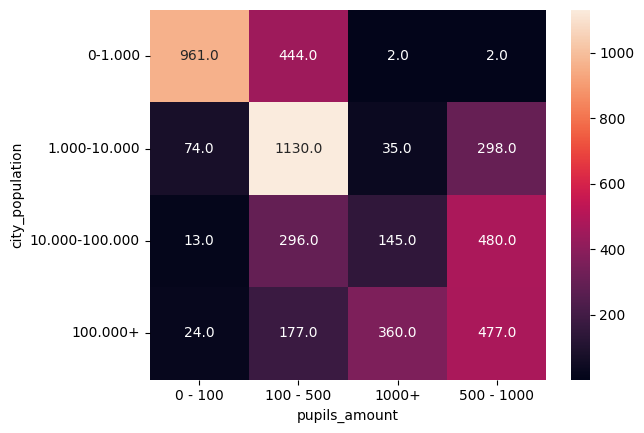

In [72]:
sns.heatmap(data=get_heatmap_df1(schools_df), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

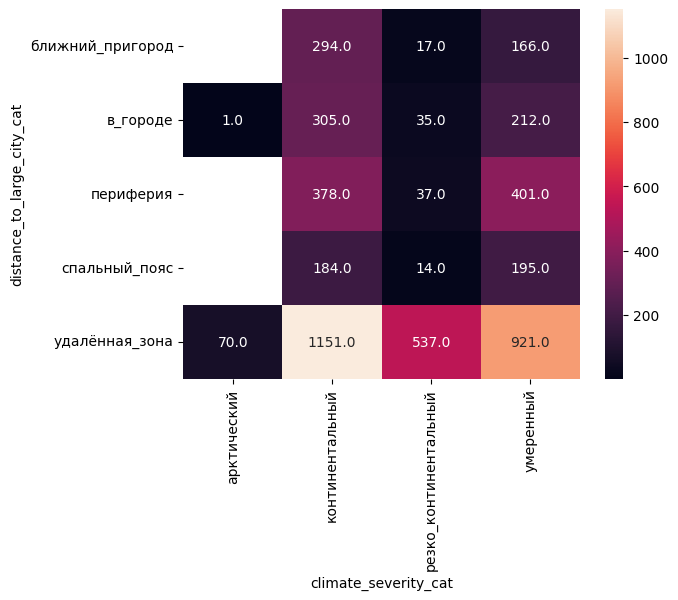

In [73]:
sns.heatmap(data=get_heatmap_df2(schools_df), annot=True, fmt=".1f")

<Axes: xlabel='distance_to_railway_station_cat', ylabel='distance_to_federal_road_cat'>

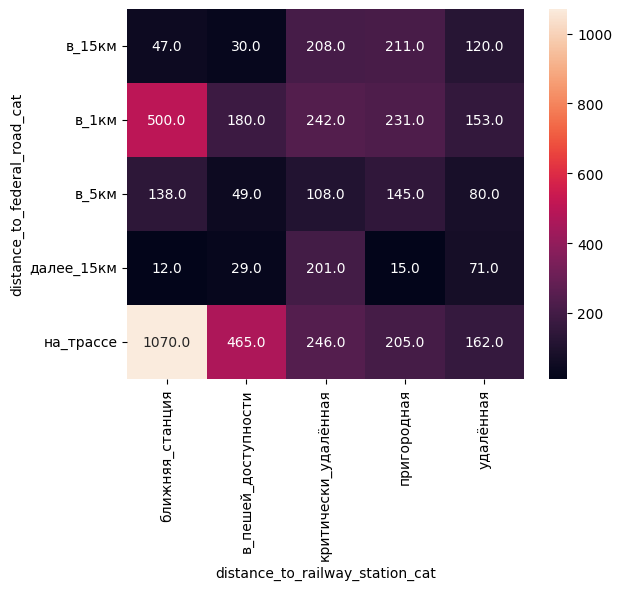

In [95]:
sns.heatmap(data=get_heatmap_df3(schools_df), annot=True, fmt=".1f")

<Axes: >

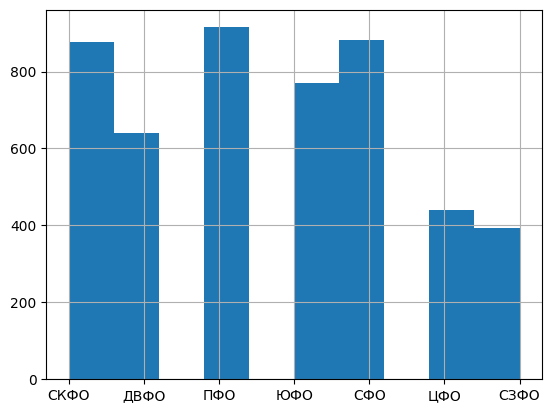

In [74]:
get_hist_by_cluster(schools_df)

1 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

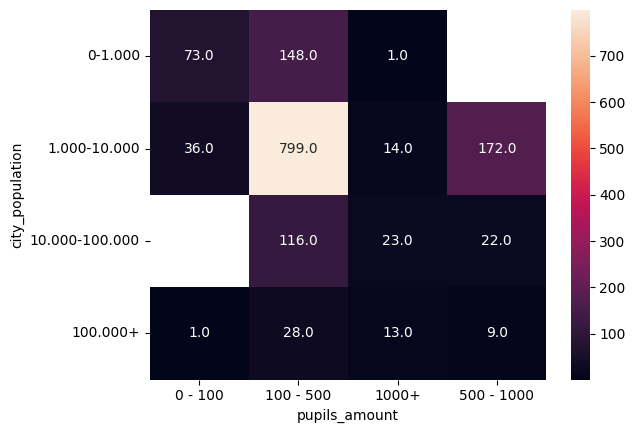

In [75]:
sns.heatmap(data=get_heatmap_df1(schools_df, 0), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

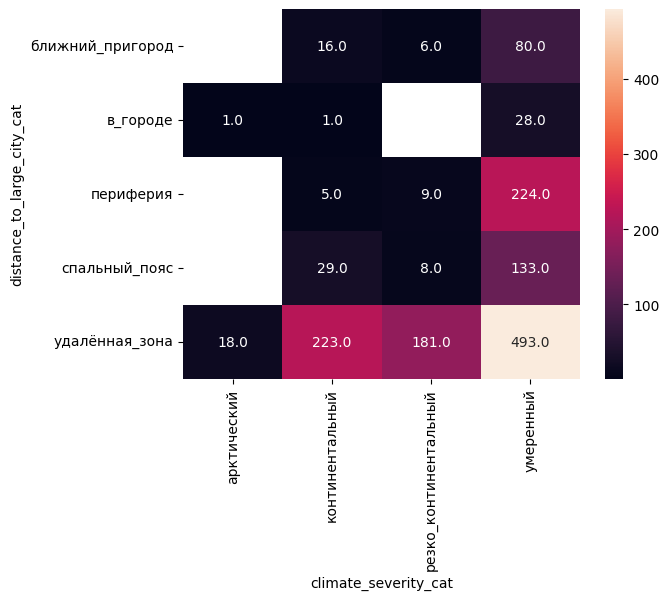

In [76]:
sns.heatmap(data=get_heatmap_df2(schools_df, 0), annot=True, fmt=".1f")

<Axes: xlabel='distance_to_railway_station_cat', ylabel='distance_to_federal_road_cat'>

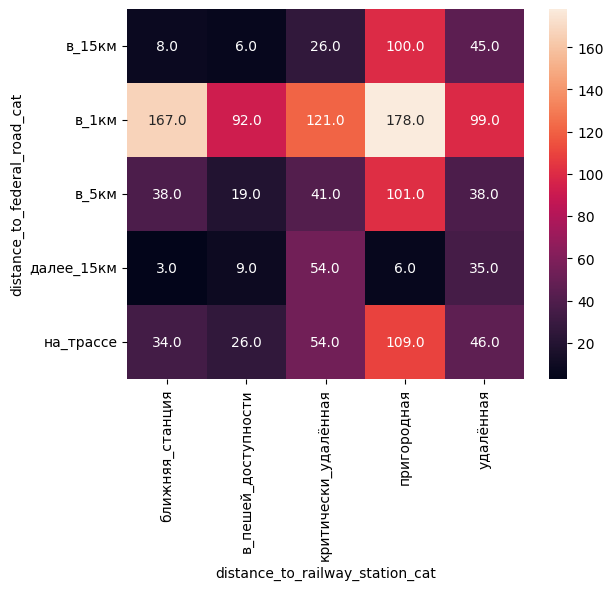

In [96]:
sns.heatmap(data=get_heatmap_df3(schools_df, 0), annot=True, fmt=".1f")

<Axes: >

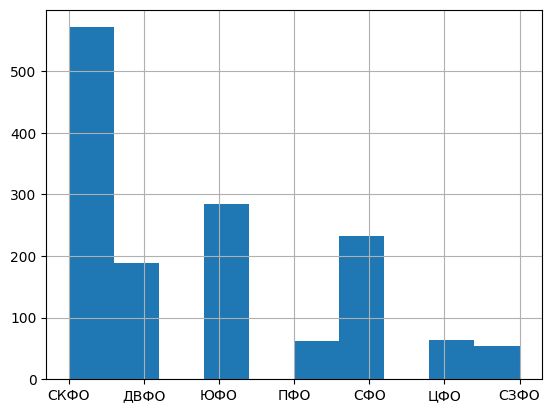

In [77]:
get_hist_by_cluster(schools_df, 0)

2 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

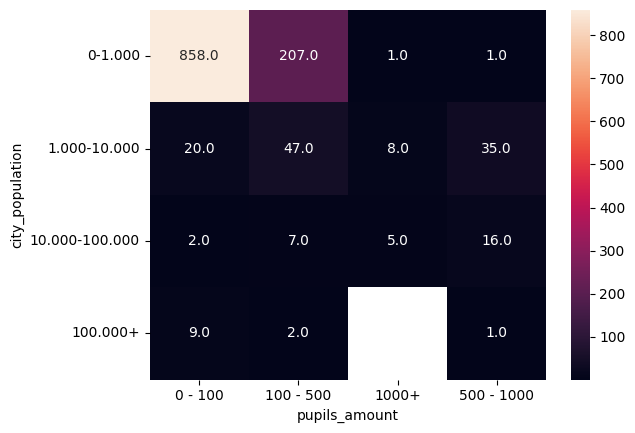

In [78]:
sns.heatmap(data=get_heatmap_df1(schools_df, 1), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

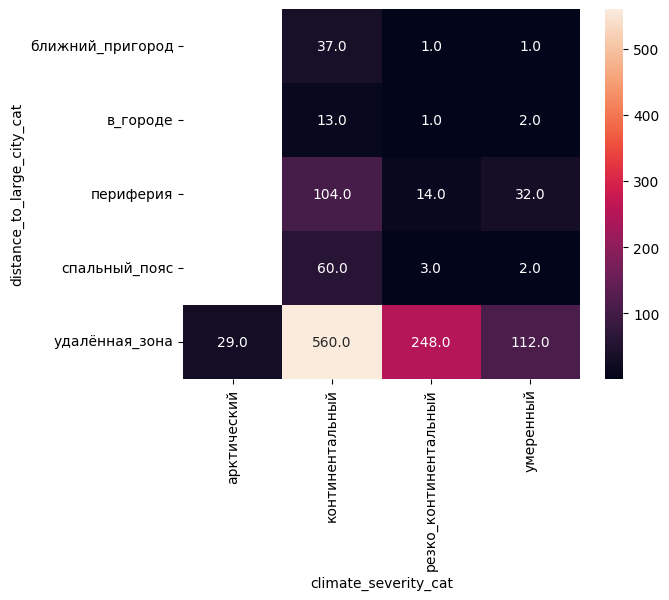

In [79]:
sns.heatmap(data=get_heatmap_df2(schools_df, 1), annot=True, fmt=".1f")

<Axes: xlabel='distance_to_railway_station_cat', ylabel='distance_to_federal_road_cat'>

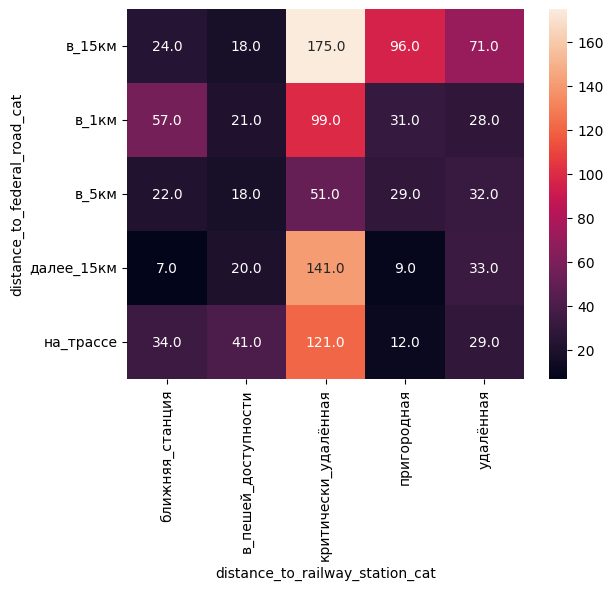

In [97]:
sns.heatmap(data=get_heatmap_df3(schools_df, 1), annot=True, fmt=".1f")

<Axes: >

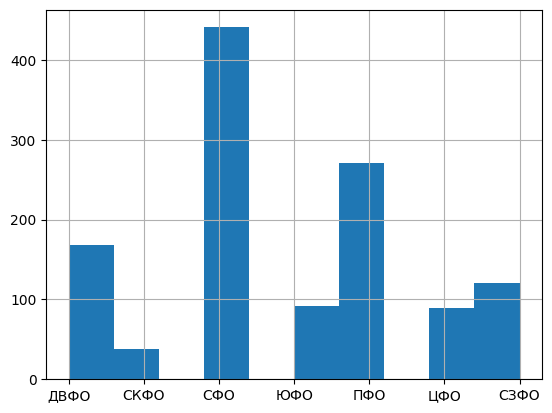

In [80]:
get_hist_by_cluster(schools_df, 1)

3 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

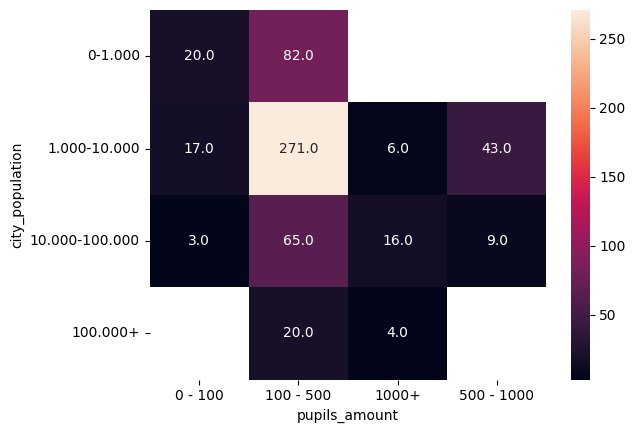

In [81]:
sns.heatmap(data=get_heatmap_df1(schools_df, 2), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

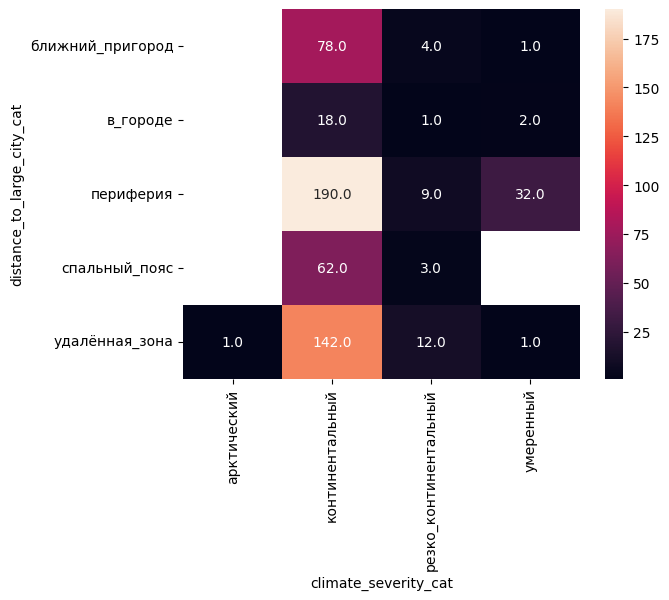

In [82]:
sns.heatmap(data=get_heatmap_df2(schools_df, 2), annot=True, fmt=".1f")

<Axes: xlabel='distance_to_railway_station_cat', ylabel='distance_to_federal_road_cat'>

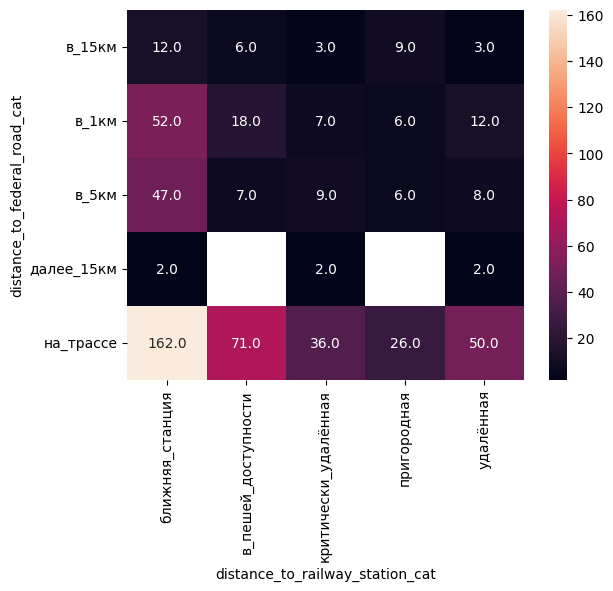

In [98]:
sns.heatmap(data=get_heatmap_df3(schools_df, 2), annot=True, fmt=".1f")

<Axes: >

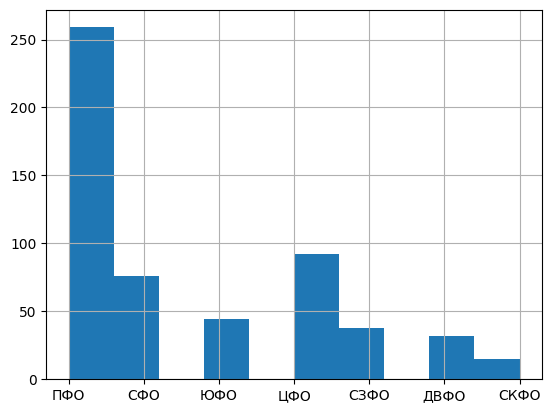

In [83]:
get_hist_by_cluster(schools_df, 2)

4 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

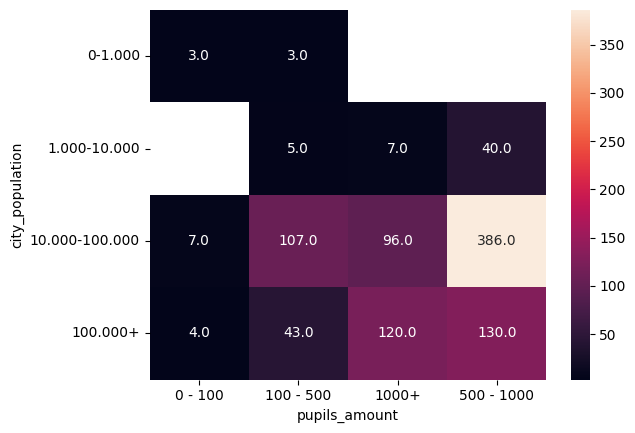

In [84]:
sns.heatmap(data=get_heatmap_df1(schools_df, 3), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

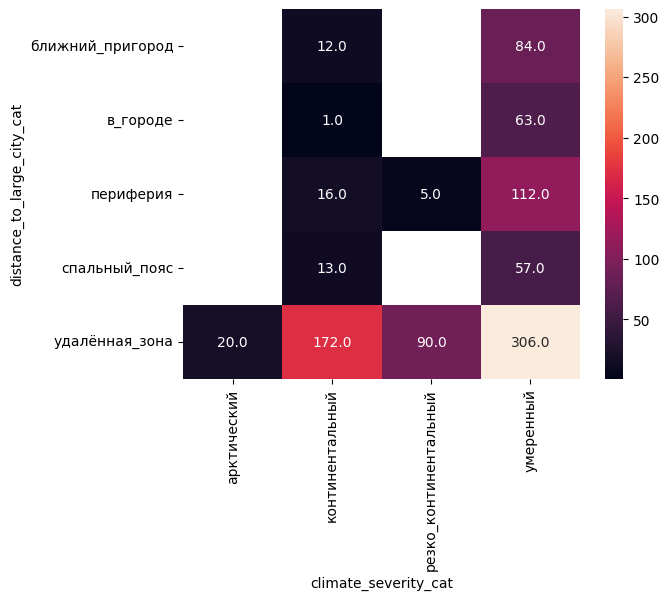

In [85]:
sns.heatmap(data=get_heatmap_df2(schools_df, 3), annot=True, fmt=".1f")

<Axes: xlabel='distance_to_railway_station_cat', ylabel='distance_to_federal_road_cat'>

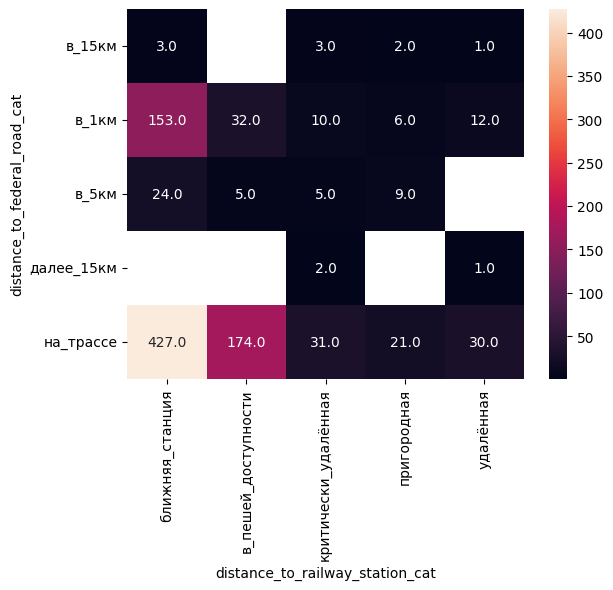

In [99]:
sns.heatmap(data=get_heatmap_df3(schools_df, 3), annot=True, fmt=".1f")

<Axes: >

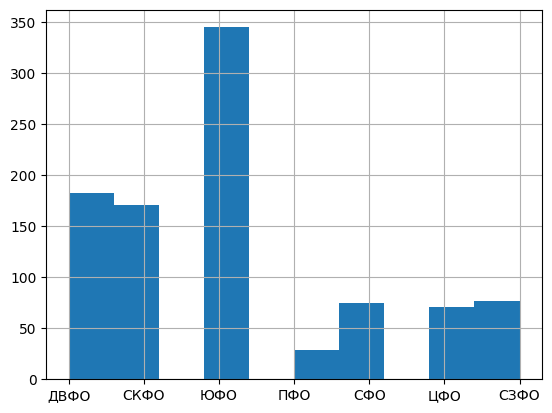

In [86]:
get_hist_by_cluster(schools_df, 3)

5 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

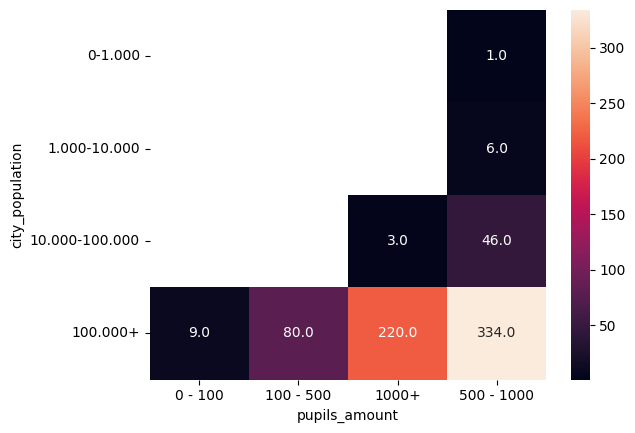

In [87]:
sns.heatmap(data=get_heatmap_df1(schools_df, 4), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

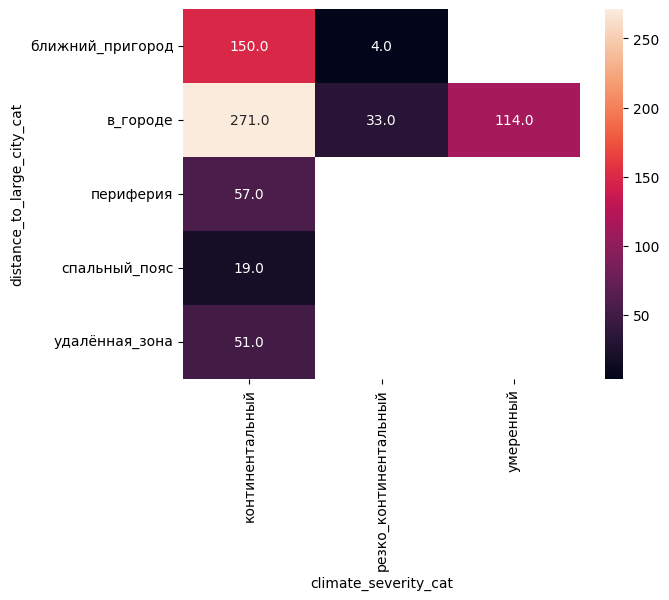

In [88]:
sns.heatmap(data=get_heatmap_df2(schools_df, 4), annot=True, fmt=".1f")

<Axes: xlabel='distance_to_railway_station_cat', ylabel='distance_to_federal_road_cat'>

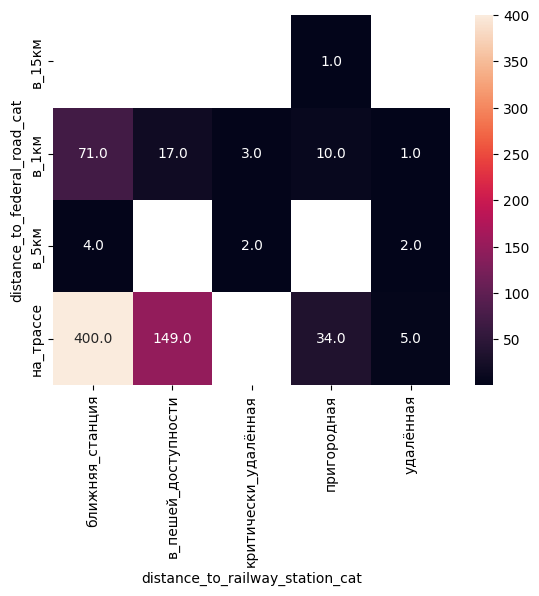

In [100]:
sns.heatmap(data=get_heatmap_df3(schools_df, 4), annot=True, fmt=".1f")

<Axes: >

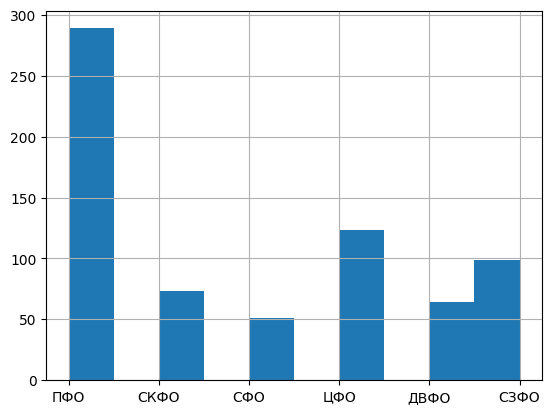

In [89]:
get_hist_by_cluster(schools_df, 4)

6 кластер

<Axes: xlabel='pupils_amount', ylabel='city_population'>

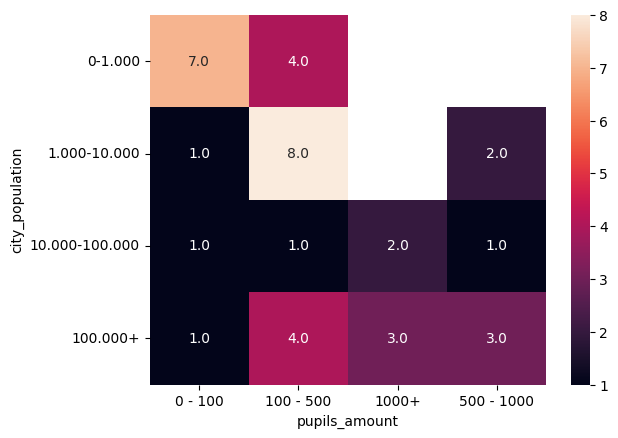

In [90]:
sns.heatmap(data=get_heatmap_df1(schools_df, 5), annot=True, fmt=".1f")

<Axes: xlabel='climate_severity_cat', ylabel='distance_to_large_city_cat'>

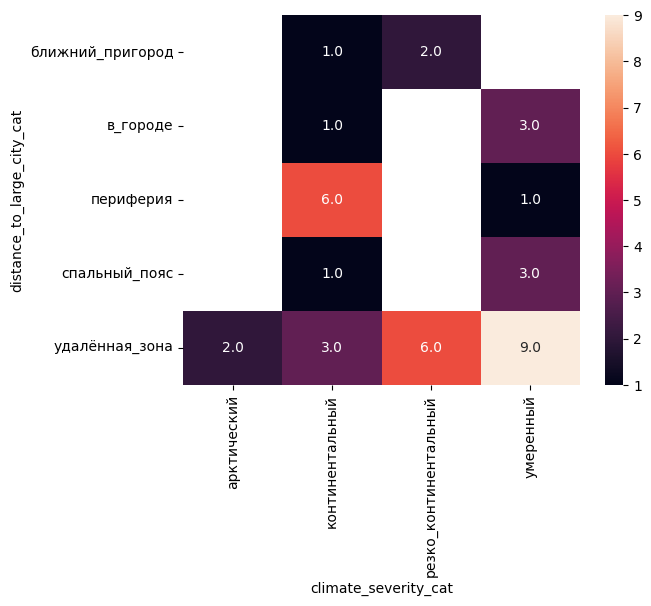

In [91]:
sns.heatmap(data=get_heatmap_df2(schools_df, 5), annot=True, fmt=".1f")

<Axes: xlabel='distance_to_railway_station_cat', ylabel='distance_to_federal_road_cat'>

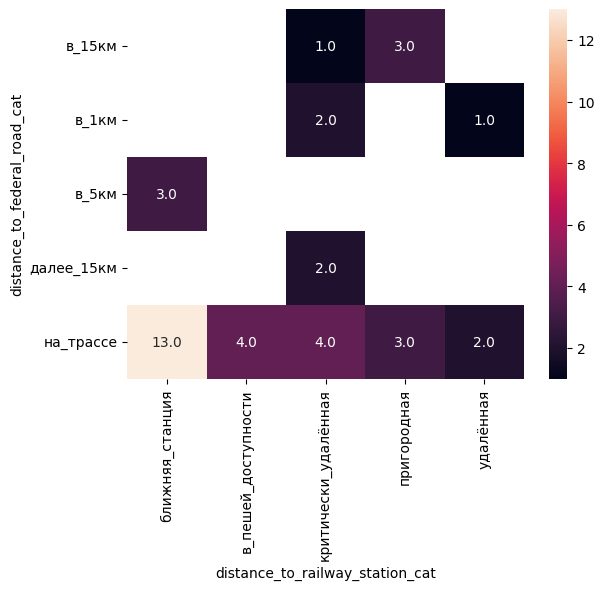

In [101]:
sns.heatmap(data=get_heatmap_df3(schools_df, 5), annot=True, fmt=".1f")

<Axes: >

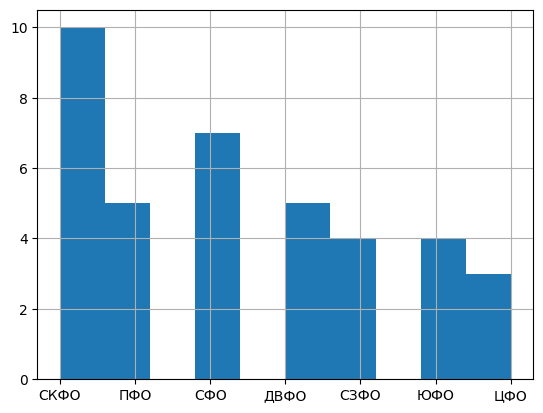

In [92]:
get_hist_by_cluster(schools_df, 5)

In [102]:
import pandas as pd
import json
import seaborn as sns
from matplotlib import pyplot as plt
schools_df = pd.read_csv('clustered_extended_success.csv')
with open('centroids_extended.txt', 'r') as f:
    centroids = json.load(f)
df_with_coords = pd.read_csv('processed_data/schools_with_coord_features.csv')

In [103]:
schools_df['lat'] = df_with_coords['lat']
schools_df['lon'] = df_with_coords['lon']

In [104]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

def plot_clusters_russia(df, lat_col='lat', lon_col='lon', cluster_col='cluster',
                         zoom_start=4, output_file='clusters_map.html'):
    """
    Интерактивная карта кластеров с возможностью фильтрации по чекбоксам.
    """
    # 1. Валидация
    valid_df = df.dropna(subset=[lat_col, lon_col, cluster_col]).copy()
    if valid_df.empty:
        raise ValueError("Нет данных для отображения. Проверьте координаты и колонку кластеров.")

    # 2. Инициализация карты
    m = folium.Map(location=[65, 100], zoom_start=zoom_start, tiles='CartoDB positron')

    # 3. Цвета и список кластеров
    colors = ['blue', 'red', 'green', 'orange', 'purple', 'cyan', 'pink', 'black']
    clusters = sorted(valid_df[cluster_col].unique())

    # 4. Создание слоёв для каждого кластера
    for i, c in enumerate(clusters):
        cluster_df = valid_df[valid_df[cluster_col] == c]

        # FeatureGroup отвечает за видимость слоя (чекбокс)
        fg = folium.FeatureGroup(name=f"Кластер {c}", show=True)
        # MarkerCluster группирует точки при отдалении для производительности
        mc = MarkerCluster().add_to(fg)

        for _, row in cluster_df.iterrows():
            folium.CircleMarker(
                location=[row[lat_col], row[lon_col]],
                radius=3,
                color=colors[i % len(colors)],
                fill=True,
                fill_color=colors[i % len(colors)],
                fill_opacity=0.8,
                popup=f"Кластер: {c}"
            ).add_to(mc)

        fg.add_to(m)

    # 5. Панель управления слоями (чекбоксы)
    # collapsed=False делает чекбоксы видимыми сразу
    folium.LayerControl(collapsed=False).add_to(m)

    # 6. Сохранение
    m.save(output_file)
    print(f"✅ Карта сохранена: {output_file}")
    print("💡 Используйте чекбоксы справа вверху для фильтрации кластеров.")
    return m

In [105]:
plot_clusters_russia(
    df=schools_df,
    cluster_col='cluster',
    output_file='schools_clusters_extended_map.html'
)

✅ Карта сохранена: schools_clusters_extended_map.html
💡 Используйте чекбоксы справа вверху для фильтрации кластеров.


# Кластеризация KPrototypes

In [107]:
import pandas as pd
import numpy as np
from mykprototypes import MyKPrototypes
import matplotlib.pyplot as plt

In [108]:
schools_df = pd.read_csv('processed_data/schools_with_coord_features.csv')
def categorize_size(x: int):
    if 0 <= x <= 100:
        return '0 - 100'
    elif 100 <= x <= 500:
        return '100 - 500'
    elif 500 <= x <= 1000:
        return '500 - 1000'
    elif x >= 1000:
        return '1000+'
schools_df['pupils_amount'] = schools_df['pupils_amount'].apply(categorize_size)
correctional_schools_df = schools_df[schools_df['is_correctional']]
schools_df = schools_df[schools_df['is_correctional'] == False]

Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 1, iteration: 1/100, moves: 0, cost: 109487967.17828032
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 2, iteration: 1/100, moves: 0, cost: 109487967.17828032
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 3, iteration: 1/100, moves: 0, cost: 109487967.17828032
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 4, iteration: 1/100, moves: 0, cost: 109487967.17828032
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 5, iteration: 1/100, moves: 0, cost: 109487967.17828032
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 6, iteration: 1/100, moves: 0, cost: 109487967.17828032
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 7, iteration:

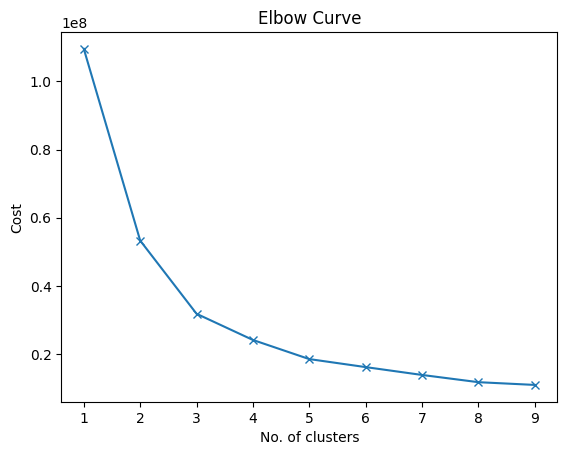

Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 1, iteration: 1/100, moves: 0, cost: 110820057.17828031
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 2, iteration: 1/100, moves: 0, cost: 110820057.17828031
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 3, iteration: 1/100, moves: 0, cost: 110820057.17828031
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 4, iteration: 1/100, moves: 0, cost: 110820057.17828031
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 5, iteration: 1/100, moves: 0, cost: 110820057.17828031
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 6, iteration: 1/100, moves: 0, cost: 110820057.17828031
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 7, iteration:

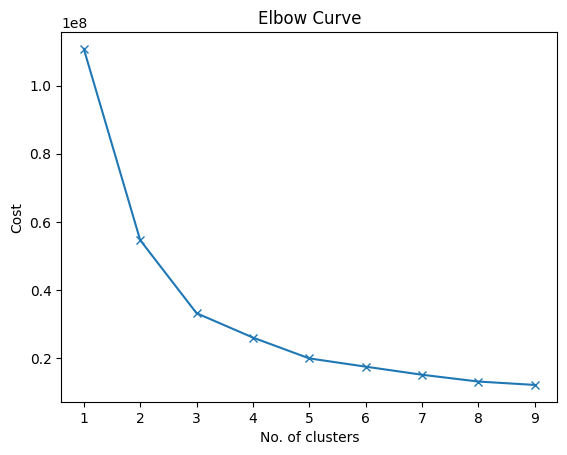

Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 1, iteration: 1/100, moves: 0, cost: 124140957.1782803
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 2, iteration: 1/100, moves: 0, cost: 124140957.1782803
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 3, iteration: 1/100, moves: 0, cost: 124140957.1782803
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 4, iteration: 1/100, moves: 0, cost: 124140957.1782803
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 5, iteration: 1/100, moves: 0, cost: 124140957.1782803
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 6, iteration: 1/100, moves: 0, cost: 124140957.1782803
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 7, iteration: 1/100

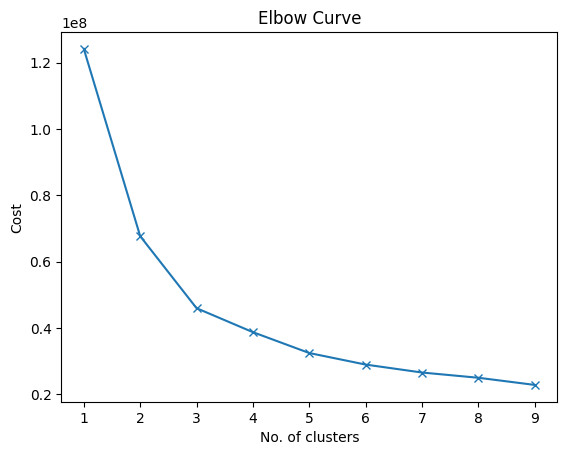

Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 1, iteration: 1/100, moves: 0, cost: 257349957.17827982
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 2, iteration: 1/100, moves: 0, cost: 257349957.17827982
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 3, iteration: 1/100, moves: 0, cost: 257349957.17827982
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 4, iteration: 1/100, moves: 0, cost: 257349957.17827982
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 5, iteration: 1/100, moves: 0, cost: 257349957.17827982
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 6, iteration: 1/100, moves: 0, cost: 257349957.17827982
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 7, iteration:

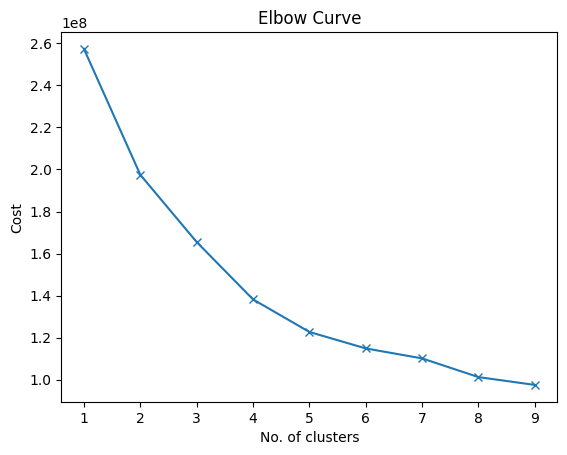

Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 1, iteration: 1/100, moves: 0, cost: 1589439957.1782799
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 2, iteration: 1/100, moves: 0, cost: 1589439957.1782799
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 3, iteration: 1/100, moves: 0, cost: 1589439957.1782799
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 4, iteration: 1/100, moves: 0, cost: 1589439957.1782799
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 5, iteration: 1/100, moves: 0, cost: 1589439957.1782799
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 6, iteration: 1/100, moves: 0, cost: 1589439957.1782799
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 7, iteration:

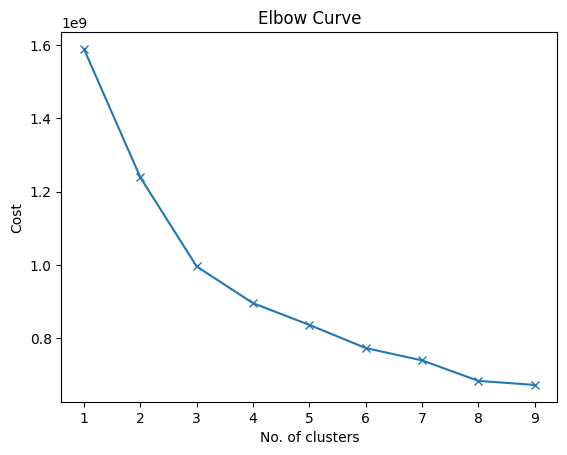

Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 1, iteration: 1/100, moves: 0, cost: 14910339957.178242
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 2, iteration: 1/100, moves: 0, cost: 14910339957.178242
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 3, iteration: 1/100, moves: 0, cost: 14910339957.178242
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 4, iteration: 1/100, moves: 0, cost: 14910339957.178242
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 5, iteration: 1/100, moves: 0, cost: 14910339957.178242
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 6, iteration: 1/100, moves: 0, cost: 14910339957.178242
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 7, iteration:

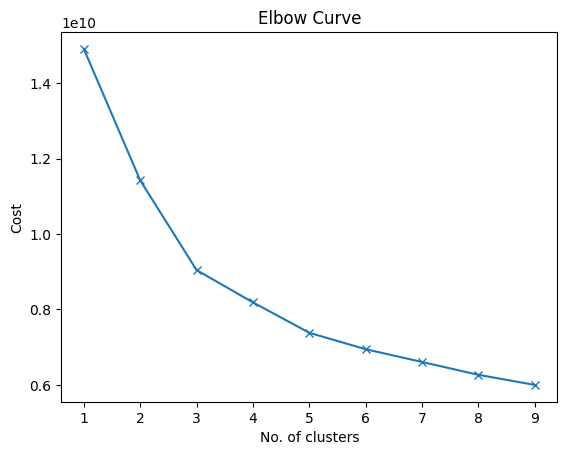

In [114]:
cost = []
K = range(1,10)
G = [10, 100, 1000, 10000, 100000, 1000000]
for gamma in G:
    cost = []
    for k in list(K):
        k_prototypes = MyKPrototypes(clusters_amount=k,  runs_amount = 15, logging=True, gamma=gamma)
        k_prototypes.fit_predict(schools_df[['location_type', 'city_population', 'pupils_amount', 'district','distance_to_large_city', 'climate_severity_cat', 'distance_to_federal_road', 'distance_to_railway_station']],
        categorical=[0,1,2,3,5])
        cost.append(k_prototypes.cost_)

    plt.plot(K, cost, 'x-')
    plt.xlabel('No. of clusters')
    plt.ylabel('Cost')
    plt.title('Elbow Curve')
    plt.show()

In [116]:
k_prototypes = MyKPrototypes(clusters_amount=3,  runs_amount = 15, logging=True, gamma=100)
clusters = k_prototypes.fit_predict(schools_df[['location_type', 'city_population', 'pupils_amount', 'district','distance_to_large_city', 'climate_severity_cat', 'distance_to_federal_road', 'distance_to_railway_station']],
categorical=[0,1,2,3,5])
cost.append(k_prototypes.cost_)

Init: initializing centroids
Initializing clusters...
Init: initializing centroids
Initializing clusters...
Init: initializing centroids
Initializing clusters...
Init: initializing centroids
Initializing clusters...
Init: initializing centroids
Initializing clusters...
Init: initializing centroids
Initializing clusters...
Init: initializing centroids
Initializing clusters...
Starting clustering iterations...
Run: 1, iteration: 1/100, moves: 1479, cost: 44809581.12633837
Run: 1, iteration: 2/100, moves: 554, cost: 42385119.62598122
Run: 1, iteration: 3/100, moves: 612, cost: 38030344.79033815
Run: 1, iteration: 4/100, moves: 461, cost: 34588593.18144496
Run: 1, iteration: 5/100, moves: 226, cost: 33513568.91728979
Run: 1, iteration: 6/100, moves: 118, cost: 33244255.123555824
Run: 1, iteration: 7/100, moves: 45, cost: 33193765.490584545
Run: 1, iteration: 8/100, moves: 40, cost: 33166866.61407692
Run: 1, iteration: 9/100, moves: 30, cost: 33151347.67091517
Run: 1, iteration: 10/100, mov

In [117]:
clusters

array([0, 0, 1, ..., 1, 1, 0], shape=(4880,), dtype=uint16)

In [118]:
schools_df['cluster'] = clusters
correctional_schools_df['cluster'] = 3

In [119]:
schools_df = pd.concat([schools_df, correctional_schools_df], ignore_index=True)

In [120]:
schools_df[schools_df['cluster'] == 0].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,lat,lon,...,distance_to_large_city,distance_to_federal_road,distance_to_railway_station,elevation_meters,terrain_slope_degrees,distance_to_border_km,climate_severity_index,distance_to_river_km,river_barrier_flag,cluster
count,3783.000000,3783.000000,3783.000000,3783.000000,3783.000000,3783.000000,3783.000000,3783.000000,3783.000000,3783.000000,...,3783.000000,3783.000000,3783.000000,3783.000000,3783.000000,3.783000e+03,3783.000000,3783.000000,3783.000000,3783.0
mean,0.672519,0.598657,0.610602,0.523551,0.483434,0.548392,0.529883,0.470388,50.454087,56.401349,...,52.775003,2.620639,12.454570,205.832672,2.606240,3.185569e-05,1.626223,2.381906,0.583928,0.0
std,0.089543,0.095144,0.086105,0.091540,0.087164,0.103429,0.091939,0.093892,5.684188,27.244228,...,41.645948,5.349932,18.030280,220.880267,8.604731,4.482934e-05,0.611341,4.031828,0.492971,0.0
min,0.131579,0.000000,0.233333,0.000000,0.000000,0.102222,0.050000,0.100000,41.864908,20.100892,...,0.104468,0.000043,0.000000,0.000000,0.000000,1.681568e-09,1.000000,0.000191,0.000000,0.0
25%,0.618287,0.541333,0.554006,0.464286,0.427778,0.485489,0.470000,0.411573,44.591442,40.720736,...,12.427037,0.183939,1.485461,90.000000,0.401995,8.318885e-06,1.000000,0.545229,0.000000,0.0
50%,0.679426,0.603794,0.610870,0.524419,0.485185,0.553030,0.531461,0.472500,51.501594,45.244937,...,46.527098,0.587156,3.911351,145.000000,0.894984,1.755544e-05,2.000000,1.181693,1.000000,0.0
75%,0.732041,0.659185,0.667371,0.579412,0.542671,0.616794,0.588493,0.529167,55.691566,53.170026,...,84.237303,2.282686,16.668710,217.500000,1.853093,3.532575e-05,2.000000,2.702819,1.000000,0.0
max,0.934211,0.955556,1.000000,1.000000,0.777778,0.911111,1.000000,0.878947,69.400134,142.809766,...,151.560494,80.644420,120.631200,3775.000000,90.000000,5.769701e-04,4.000000,94.960330,1.000000,0.0


In [121]:
schools_df[schools_df['cluster'] == 1].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,lat,lon,...,distance_to_large_city,distance_to_federal_road,distance_to_railway_station,elevation_meters,terrain_slope_degrees,distance_to_border_km,climate_severity_index,distance_to_river_km,river_barrier_flag,cluster
count,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,...,967.000000,967.000000,967.000000,967.000000,967.000000,9.670000e+02,967.000000,967.000000,967.000000,967.0
mean,0.655234,0.584337,0.595112,0.502273,0.461027,0.524596,0.510717,0.438940,53.966602,82.500992,...,243.456664,6.882611,41.023476,242.110651,2.231319,1.040172e-04,2.156153,3.971912,0.630817,1.0
std,0.098667,0.102316,0.088283,0.094035,0.095544,0.115096,0.095046,0.108319,5.657342,35.537441,...,76.567226,15.733625,58.638777,261.890059,8.125437,1.424483e-04,0.750032,9.896069,0.482833,0.0
min,0.175439,0.213333,0.233333,0.182353,0.077778,0.051852,0.150000,0.000000,41.907949,30.594824,...,134.305945,0.000117,0.000000,1.000000,0.000000,3.706342e-08,1.000000,0.000100,0.000000,1.0
25%,0.599103,0.523930,0.539898,0.444444,0.405556,0.455556,0.454580,0.376015,50.370222,45.175575,...,178.843874,0.335684,1.830179,112.000000,0.082260,1.790716e-05,2.000000,0.461822,0.000000,1.0
50%,0.661184,0.588406,0.593929,0.500000,0.459770,0.530000,0.511290,0.441667,53.106801,84.866894,...,229.766206,1.079833,13.108210,145.000000,0.513781,4.871701e-05,2.000000,0.985934,1.000000,1.0
75%,0.720964,0.652880,0.650000,0.560000,0.523662,0.600000,0.566789,0.505000,58.387754,109.776501,...,293.366457,6.412395,55.062336,264.500000,1.543710,1.449617e-04,3.000000,2.698023,1.000000,1.0
max,0.956140,0.911111,0.950000,0.950000,0.800000,0.911111,0.883333,1.000000,68.090849,140.365511,...,524.737071,191.149460,305.958000,2538.000000,90.000000,1.204019e-03,4.000000,109.721810,1.000000,1.0


In [122]:
schools_df[schools_df['cluster'] == 2].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,lat,lon,...,distance_to_large_city,distance_to_federal_road,distance_to_railway_station,elevation_meters,terrain_slope_degrees,distance_to_border_km,climate_severity_index,distance_to_river_km,river_barrier_flag,cluster
count,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,...,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.0
mean,0.653903,0.587200,0.593726,0.502400,0.437906,0.511398,0.485143,0.434445,59.939500,104.947767,...,647.772447,93.205018,282.150607,284.738462,0.832300,0.000327,3.184615,9.450894,0.761538,2.0
std,0.096361,0.117399,0.101178,0.113182,0.105509,0.134939,0.099700,0.131535,6.269913,32.736854,...,181.070078,159.422905,234.512114,301.684792,1.368909,0.001341,0.860725,89.154245,0.427791,0.0
min,0.407895,0.266667,0.325000,0.256250,0.185185,0.066667,0.266667,0.112500,50.197872,4.892397,...,399.991005,0.000098,0.351679,4.000000,0.000000,0.000002,1.000000,0.028785,0.000000,2.0
25%,0.593809,0.517593,0.537993,0.428857,0.368584,0.435913,0.403286,0.359450,53.143176,70.309759,...,513.538465,0.434744,62.918597,145.000000,0.000000,0.000011,3.000000,0.493663,1.000000,2.0
50%,0.661184,0.580367,0.605812,0.509691,0.445820,0.519365,0.483648,0.437367,60.373816,114.006177,...,636.695018,8.777638,262.366715,145.000000,0.000000,0.000055,3.000000,0.866457,1.000000,2.0
75%,0.724687,0.660538,0.658400,0.566319,0.506180,0.614815,0.550000,0.521429,66.000422,133.404313,...,712.593977,146.964650,420.313977,379.250000,1.327009,0.000267,4.000000,1.466054,1.000000,2.0
max,0.873355,0.918519,0.840909,0.825000,0.733333,0.811111,0.750000,0.850000,71.632681,156.587657,...,1387.369758,1019.551700,1086.857700,1309.000000,6.694874,0.014648,4.000000,1017.650300,1.000000,2.0


In [123]:
schools_df[schools_df['cluster'] == 3].describe()

,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,lat,lon,...,distance_to_large_city,distance_to_federal_road,distance_to_railway_station,elevation_meters,terrain_slope_degrees,distance_to_border_km,climate_severity_index,distance_to_river_km,river_barrier_flag,cluster
count,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,38.000000,...,38.000000,38.000000,38.000000,38.000000,38.000000,3.800000e+01,38.000000,38.000000,38.000000,38.0
mean,0.659103,0.603592,0.602122,0.521440,0.446571,0.528188,0.523805,0.455774,50.803346,64.508693,...,123.903903,2.795211,20.899331,247.763158,1.377798,4.040395e-05,1.894737,5.159991,0.500000,3.0
std,0.099508,0.102562,0.084713,0.129064,0.126456,0.137484,0.082556,0.118061,6.774293,32.850309,...,151.208900,6.296680,33.617525,237.525695,2.159391,6.500632e-05,0.923843,12.083528,0.506712,0.0
min,0.415789,0.244444,0.444118,0.142857,0.088889,0.133333,0.308333,0.164286,42.022481,34.405979,...,0.492675,0.007669,0.301039,3.000000,0.000000,7.340464e-07,1.000000,0.118795,0.000000,3.0
25%,0.600820,0.546448,0.546250,0.473721,0.423146,0.484722,0.470625,0.388324,44.322483,43.222279,...,25.649164,0.132612,1.663297,79.750000,0.241652,9.370321e-06,1.000000,0.622017,0.000000,3.0
50%,0.664317,0.626508,0.594643,0.537829,0.475814,0.572982,0.542017,0.453623,50.742360,48.672399,...,65.193233,0.299653,4.543784,152.500000,0.550718,2.461283e-05,2.000000,1.484851,0.500000,3.0
75%,0.721377,0.670238,0.655597,0.588080,0.524260,0.610380,0.576422,0.539833,55.175471,84.545845,...,140.462652,0.854552,25.934875,367.000000,1.144337,4.313574e-05,2.750000,2.280270,1.000000,3.0
max,0.826870,0.807407,0.820755,0.730769,0.639589,0.752490,0.663415,0.708451,67.501546,137.019031,...,712.778432,29.749989,140.706100,1120.000000,10.514656,3.642538e-04,4.000000,54.947777,1.000000,3.0


In [124]:
k_prototypes.cluster_centroids_

array([['52.775003350793455', '2.6206393532583596', '12.454569941211103',
        'НПСТ', '1.000-10.000', '100 - 500', 'ПФО', 'континентальный'],
       ['243.45666415458857', '6.882610511835812', '41.023476310548055',
        'НПСТ', '0-1.000', '100 - 500', 'СФО', 'континентальный'],
       ['647.772447114469', '93.20501830631', '282.15060708323097',
        'НПСТ', '0-1.000', '100 - 500', 'ДВФО', 'резко_континентальный']],
      dtype='<U32')

# Корреляция

In [136]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_cluster_means(df, cluster_col, performance_cols,
                       figsize_per_plot=(8, 5),
                       sort_by='mean',  # 'mean' или 'cluster'
                       color_palette='viridis',
                       save_path=None):
    """
    Строит столбчатые диаграммы средней успеваемости по кластерам.

    Параметры:
    - df: DataFrame с данными
    - cluster_col: название колонки с метками кластеров
    - performance_cols: список колонок с успеваемостью
    - figsize_per_plot: размер одного графика (ширина, высота)
    - sort_by: сортировать ли кластеры по среднему ('mean') или оставить как есть ('cluster')
    - color_palette: цветовая схема seaborn
    - save_path: если указан, сохраняет графики в файл (PDF/PNG)

    Возвращает:
    - plots_data: dict {subject: DataFrame} с данными для графиков (mean, std, count по кластерам)
    """

    plots_data = {}

    for col in performance_cols:
        # Считаем статистику по кластерам
        stats = df.groupby(cluster_col)[col].agg(['mean', 'std', 'count']).round(3).reset_index()
        stats = stats.rename(columns={cluster_col: 'cluster'})
        stats['std'] = stats['std'].fillna(0)  # если в кластере 1 наблюдение

        # Сортировка
        if sort_by == 'mean':
            stats = stats.sort_values('mean', ascending=False)

        plots_data[col] = stats

        # Построение графика
        plt.figure(figsize=figsize_per_plot)
        bars = plt.bar(
            stats['cluster'].astype(str),
            stats['mean'],
            yerr=stats['std'],
            capsize=5,
            color=sns.color_palette(color_palette, len(stats)),
            edgecolor='black',
            alpha=0.9
        )

        # Подписи значений на столбцах
        for bar in bars:
            height = bar.get_height()
            plt.text(
                bar.get_x() + bar.get_width()/2,
                height + 0.01,
                f'{height:.2f}',
                ha='center',
                va='bottom',
                fontsize=9
            )

        plt.title(f'Средняя успеваемость по кластерам: {col}', fontsize=14, pad=15)
        plt.xlabel('Кластер', fontsize=11)
        plt.ylabel('Доля верных ответов (0–1)', fontsize=11)
        plt.ylim(0, 1.05)  # фиксированная шкала для сравнения
        plt.grid(axis='y', alpha=0.3, linestyle='--')
        plt.tight_layout()

        if save_path:
            fname = f"{save_path}/{col.replace('/', '_')}.png"
            plt.savefig(fname, dpi=300, bbox_inches='tight')
            print(f"✓ Сохранено: {fname}")
        else:
            plt.show()
        plt.close()

    return plots_data

In [126]:
df = pd.read_csv('clustered_extended_success.csv')

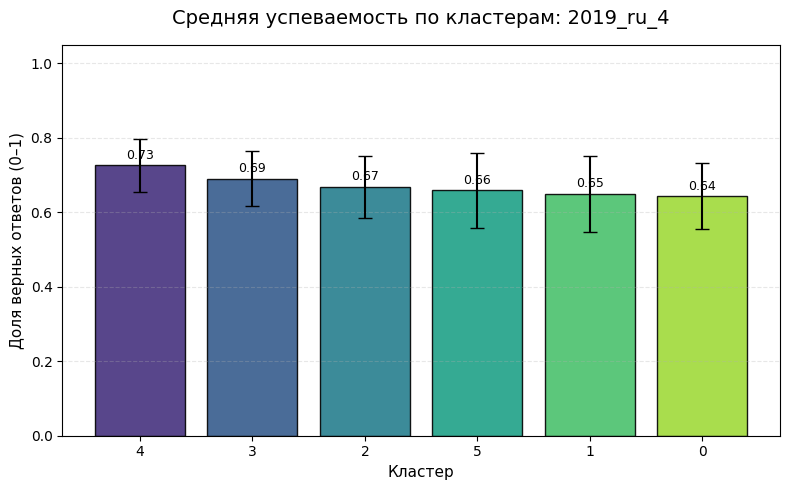

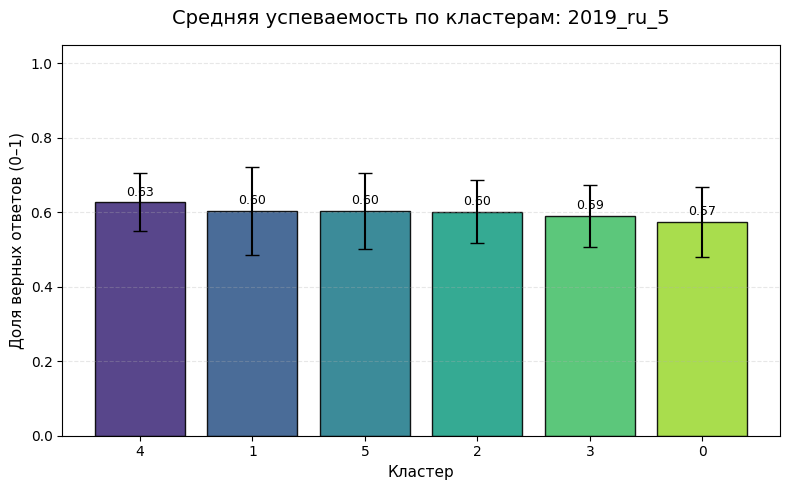

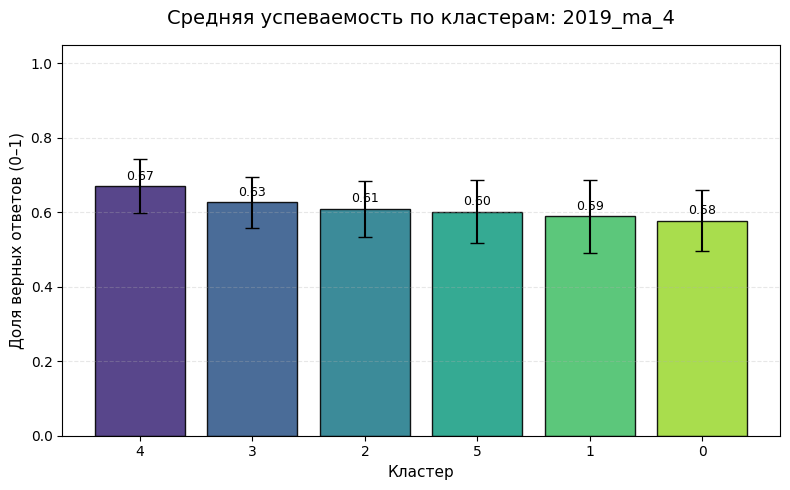

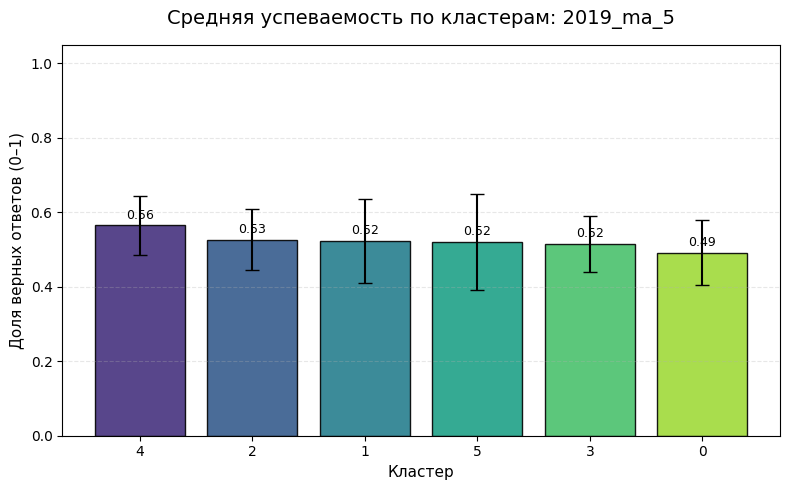

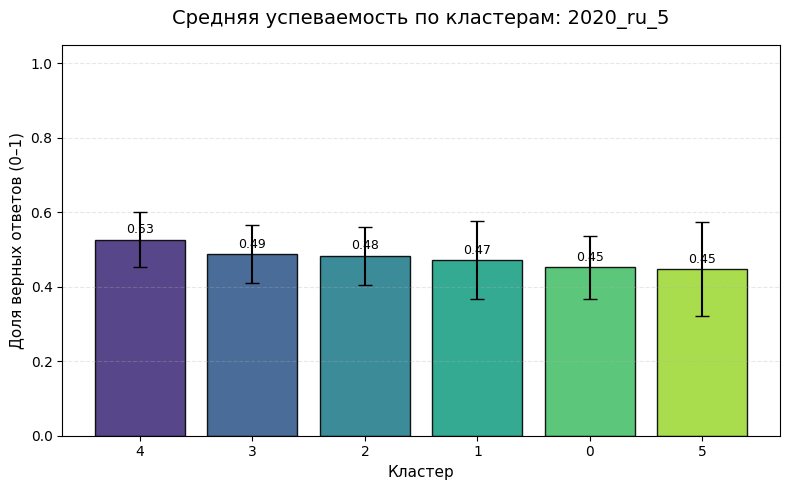

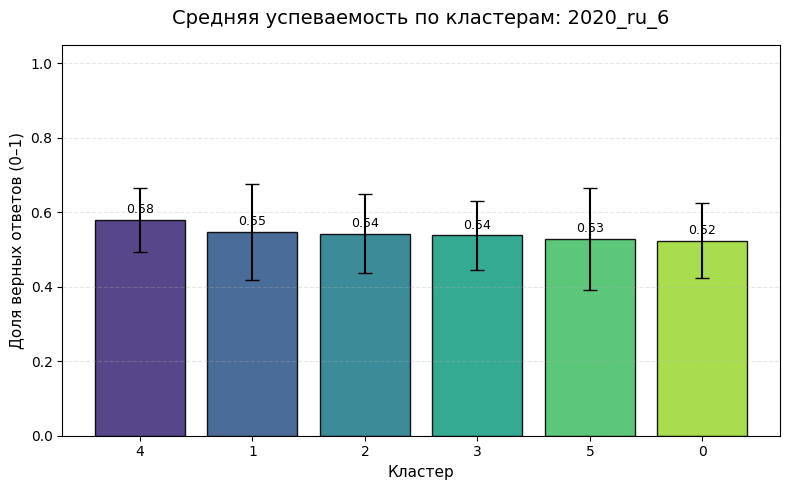

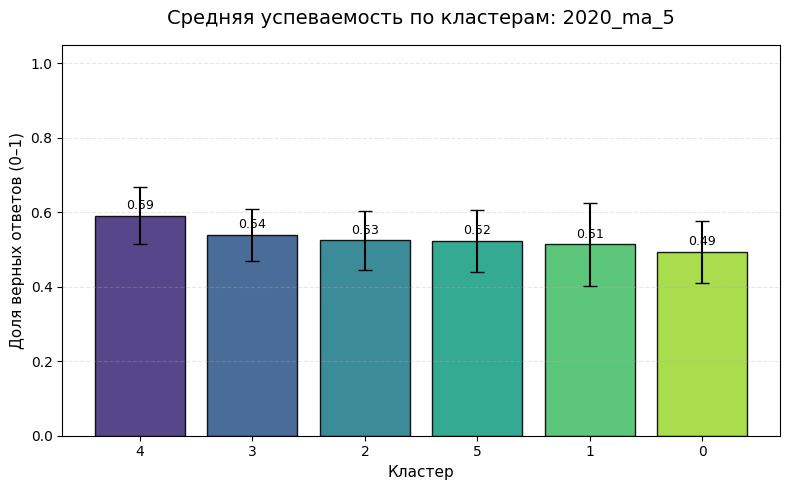

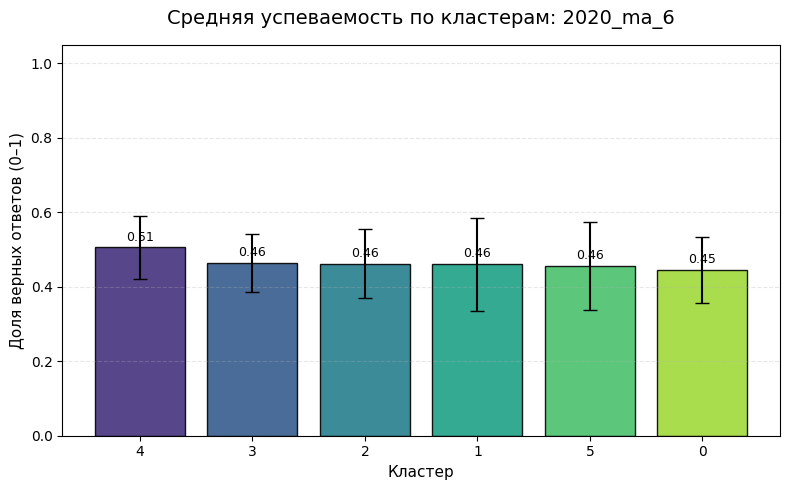

In [137]:
perf_cols = ['2019_ru_4', '2019_ru_5', '2019_ma_4', '2019_ma_5',
             '2020_ru_5', '2020_ru_6', '2020_ma_5', '2020_ma_6']

# Построить все графики (откроются по очереди)
plots = plot_cluster_means(df, 'cluster', perf_cols)

# Или сохранить в папку
# plots = plot_cluster_means(df, 'cluster', perf_cols, save_path='./output/charts')

In [138]:
with open('centroids_extended.txt', 'r') as f:
    centroids = json.load(f)

centroids

[['НПСТ',
  '1.000-10.000',
  '100 - 500',
  'СКФО',
  'удалённая_зона',
  'умеренный',
  'в_1км',
  'пригородная'],
 ['НПСТ',
  '0-1.000',
  '0 - 100',
  'СФО',
  'удалённая_зона',
  'континентальный',
  'в_15км',
  'критически_удалённая'],
 ['НПСТ',
  '1.000-10.000',
  '100 - 500',
  'ПФО',
  'периферия',
  'континентальный',
  'на_трассе',
  'ближняя_станция'],
 ['Город',
  '10.000-100.000',
  '500 - 1000',
  'ЮФО',
  'удалённая_зона',
  'умеренный',
  'на_трассе',
  'ближняя_станция'],
 ['Город',
  '100.000+',
  '500 - 1000',
  'ПФО',
  'в_городе',
  'континентальный',
  'на_трассе',
  'ближняя_станция']]

важный тезиис

есть зависимость успеваемости от кластера, где-то статистически значимая, где-то - нет

считаем что школы с равными условиями, лучшие по успеваемости школы берём в пример, худшие - ищем пути исправления ситуации (финансирование, доп исследования и т д)

в практической значимости упомянуть позитивный мониторинг - программа поощрения хороших школ и помощи отстающим, в рамках приказа МинОбр


доделать:
- выписать как пример аномально плохие\хорошие школы по кластерам
- аномалии проверить на предмет объективности (по дополнительному списку школ с необъективными результатами)
- кластеризацию KProto посмотреть кластера, большой кластер прокластеризовать ещё раз

In [ ]:
import pandas as pd

def find_anomalous_schools(df, school_id_col, cluster_col, performance_col,
                           cluster_low, cluster_high, top_n=10):
    """
    Находит школы с аномально низкой/высокой успеваемостью в указанных кластерах.

    Параметры:
    - df: DataFrame с данными
    - school_id_col: название колонки с идентификатором школы (например, 'school_id')
    - cluster_col: название колонки с метками кластеров
    - performance_col: колонка с успеваемостью (например, '2019_ru_4')
    - cluster_low: кластер, где ищем минимальные значения (например, 4)
    - cluster_high: кластер, где ищем максимальные значения (например, 0)
    - top_n: сколько школ вернуть в каждом списке

    Возвращает:
    - low_performers: DataFrame с школами из cluster_low с наименьшей успеваемостью
    - high_performers: DataFrame с школами из cluster_high с наибольшей успеваемостью
    """

    # Школы с минимальной успеваемостью в cluster_low
    low_mask = (df[cluster_col] == cluster_low) & (df[performance_col].notna())
    low_performers = (df.loc[low_mask, [school_id_col, cluster_col, performance_col]]
                      .sort_values(performance_col, ascending=True)
                      .head(top_n)
                      .reset_index(drop=True))

    # Школы с максимальной успеваемостью в cluster_high
    high_mask = (df[cluster_col] == cluster_high) & (df[performance_col].notna())
    high_performers = (df.loc[high_mask, [school_id_col, cluster_col, performance_col]]
                       .sort_values(performance_col, ascending=False)
                       .head(top_n)
                       .reset_index(drop=True))

    # Печать краткого отчёта
    print(f"Аномалии по признаку: {performance_col}")
    print(f"\nКластер {cluster_low} — {top_n} школ с минимальной успеваемостью:")
    print(low_performers.to_string(index=False))
    print(f"\n   Статистика: min={low_performers[performance_col].min():.3f}, "
          f"mean={low_performers[performance_col].mean():.3f}")

    print(f"\nКластер {cluster_high} — {top_n} школ с максимальной успеваемостью:")
    print(high_performers.to_string(index=False))
    print(f"\n   Статистика: max={high_performers[performance_col].max():.3f}, "
          f"mean={high_performers[performance_col].mean():.3f}")

    # Разрыв между группами
    gap = high_performers[performance_col].mean() - low_performers[performance_col].mean()
    print(f"\n Разрыв средних: {gap:.3f} ({gap*100:.1f} п.п.)")

    return low_performers, high_performers

In [2]:
df = pd.read_csv('clustered_extended_success.csv')

In [5]:
df

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,distance_to_federal_road_cat,distance_to_railway_station_cat,climate_severity_cat,cluster
0,sch05153592,НПСТ,Карагас,1.000-10.000,False,100 - 500,0.641700,0.683838,0.600000,0.568750,0.558974,0.516239,0.5800,0.484615,СКФО,удалённая_зона,далее_15км,критически_удалённая,умеренный,0
1,sch05153460,НПСТ,Некрасовка,0-1.000,False,100 - 500,0.501548,0.679365,0.584375,0.510000,0.525556,0.598765,0.5125,0.369444,СКФО,спальный_пояс,в_5км,пригородная,умеренный,0
2,sch28183253,НПСТ,Лазаревка,0-1.000,False,0 - 100,0.605263,0.590476,0.475000,0.578571,0.566667,0.600000,0.5500,0.490000,ДВФО,удалённая_зона,на_трассе,пригородная,умеренный,0
3,sch28186020,НПСТ,Буссе,0-1.000,False,0 - 100,0.736842,0.755556,0.580000,0.800000,0.555556,0.488889,0.7000,0.450000,ДВФО,удалённая_зона,в_15км,критически_удалённая,резко_континентальный,1
4,sch05156206,НПСТ,Цанатль,0-1.000,False,0 - 100,0.403509,0.450000,0.366667,0.387500,0.283333,0.528889,0.4125,0.410000,СКФО,периферия,в_5км,критически_удалённая,умеренный,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4913,sch05153262,НПСТ,Джалган,0-1.000,True,0 - 100,0.578947,0.463889,0.483333,0.555556,0.468889,0.537037,0.3850,0.458333,СКФО,удалённая_зона,в_5км,ближняя_станция,умеренный,5
4914,sch11116082,Город,Воркута,10.000-100.000,True,100 - 500,0.570850,0.624444,0.557692,0.600000,0.430769,0.452778,0.5000,0.263636,СЗФО,удалённая_зона,на_трассе,ближняя_станция,арктический,5
4915,sch27173318,Город,Комсомольск-на-Амуре,100.000+,True,100 - 500,0.718228,0.591111,0.614286,0.362500,0.578431,0.580781,0.6250,0.396154,ДВФО,удалённая_зона,на_трассе,ближняя_станция,резко_континентальный,5
4916,sch22123773,НПСТ,Никольское,0-1.000,True,100 - 500,0.720096,0.603704,0.526471,0.541667,0.446667,0.268056,0.5100,0.329412,СФО,удалённая_зона,в_15км,пригородная,резко_континентальный,5


In [6]:
# Пример вызова для вашего случая
low_4, high_0 = find_anomalous_schools(
    df=df,
    school_id_col='Логин ОО',  # замените на ваше название колонки
    cluster_col='cluster',
    performance_col='2019_ru_4',
    cluster_low=4,      # кластер с низкой успеваемостью
    cluster_high=0,     # кластер с высокой успеваемостью
    top_n=10
)

🔍 Аномалии по признаку: 2019_ru_4

📉 Кластер 4 — 10 школ с минимальной успеваемостью:
   Логин ОО  cluster  2019_ru_4
sch25156018        4   0.416268
sch18183097        4   0.477444
sch20106529        4   0.481693
sch21113273        4   0.489474
sch28180193        4   0.491866
sch22124398        4   0.500000
sch35150110        4   0.532223
sch22124193        4   0.536437
sch18186044        4   0.539474
sch10100127        4   0.540583

   Статистика: min=0.416, mean=0.501

📈 Кластер 0 — 10 школ с максимальной успеваемостью:
   Логин ОО  cluster  2019_ru_4
sch24143410        0   0.901316
sch23133173        0   0.890838
sch23133806        0   0.878403
sch34143353        0   0.868421
sch25153245        0   0.858553
sch11110053        0   0.846154
sch23133801        0   0.840132
sch23136043        0   0.839713
sch12123048        0   0.836715
sch34143115        0   0.833616

   Статистика: max=0.901, mean=0.859

⚡ Разрыв средних: 0.359 (35.9 п.п.)


In [7]:
low_4

,Логин ОО,cluster,2019_ru_4
0,sch25156018,4,0.416268
1,sch18183097,4,0.477444
2,sch20106529,4,0.481693
3,sch21113273,4,0.489474
4,sch28180193,4,0.491866
5,sch22124398,4,0.500000
6,sch35150110,4,0.532223
7,sch22124193,4,0.536437
8,sch18186044,4,0.539474
9,sch10100127,4,0.540583


In [9]:
df[df['Логин ОО'].isin(low_4['Логин ОО'])]

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,distance_to_federal_road_cat,distance_to_railway_station_cat,climate_severity_cat,cluster
872,sch18186044,Столица субъекта РФ,город,100.000+,False,100 - 500,0.539474,0.553086,0.615000,0.450000,0.369444,0.431746,0.506250,0.433333,ПФО,в_городе,на_трассе,ближняя_станция,континентальный,4
971,sch22124398,Город,Барнаул,100.000+,False,100 - 500,0.500000,0.629167,0.520833,0.461538,0.520261,0.637037,0.465789,0.500000,СФО,ближний_пригород,на_трассе,ближняя_станция,континентальный,4
1414,sch21113273,Город,Чебоксары,100.000+,False,100 - 500,0.489474,0.470707,0.527778,0.413636,0.471111,0.405556,0.566667,0.238889,ПФО,ближний_пригород,в_1км,ближняя_станция,континентальный,4
1833,sch22124193,Город,Бийск,100.000+,False,500 - 1000,0.536437,0.653595,0.558108,0.552830,0.502102,0.537037,0.584444,0.345000,СФО,в_городе,в_1км,ближняя_станция,континентальный,4
2621,sch10100127,Столица субъекта РФ,Петрозаводск,100.000+,False,500 - 1000,0.540583,0.444055,0.563750,0.342982,0.325926,0.393827,0.442391,0.372321,СЗФО,удалённая_зона,на_трассе,ближняя_станция,континентальный,4
2973,sch25156018,Город,Владивосток,100.000+,False,100 - 500,0.416268,0.516667,0.434091,0.495652,0.541880,0.495960,0.475000,0.415217,ДВФО,в_городе,на_трассе,ближняя_станция,умеренный,4
3115,sch28180193,НПГТ,Февральск,1.000-10.000,False,500 - 1000,0.491866,0.499839,0.549167,0.434058,0.402020,0.469444,0.495536,0.346078,ДВФО,в_городе,на_трассе,в_пешей_доступности,континентальный,4
3446,sch18183097,Столица субъекта РФ,Ижевск,100.000+,False,100 - 500,0.477444,0.405128,0.553846,0.386364,0.607018,0.514141,0.650000,0.504545,ПФО,в_городе,в_1км,в_пешей_доступности,континентальный,4
4073,sch35150110,Город,Череповец,100.000+,False,0 - 100,0.532223,0.431515,0.524000,0.465179,0.409829,0.343981,0.528704,0.247115,СЗФО,в_городе,на_трассе,ближняя_станция,континентальный,4
4797,sch20106529,Город,Грозный,100.000+,False,100 - 500,0.481693,0.535979,0.535417,0.565854,0.544444,0.603704,0.579167,0.462500,СКФО,в_городе,на_трассе,ближняя_станция,умеренный,4


In [10]:
df[df['Логин ОО'].isin(high_0['Логин ОО'])]

,Логин ОО,location_type,city_name,city_population,is_correctional,pupils_amount,2019_ru_4,2019_ru_5,2019_ma_4,2019_ma_5,2020_ru_5,2020_ru_6,2020_ma_5,2020_ma_6,district,distance_to_large_city_cat,distance_to_federal_road_cat,distance_to_railway_station_cat,climate_severity_cat,cluster
259,sch12123048,НПГТ,Мари-Турек,1.000-10.000,False,500 - 1000,0.836715,0.590338,0.811905,0.507303,0.406734,0.516306,0.523267,0.502740,ПФО,удалённая_зона,в_1км,критически_удалённая,континентальный,0
2114,sch34143115,Город,Волгоград,100.000+,False,100 - 500,0.833616,0.631111,0.706000,0.573077,0.651341,0.792982,0.816667,0.577083,ЮФО,ближний_пригород,в_1км,в_пешей_доступности,умеренный,0
2445,sch11110053,НПГТ,Воргашор,1.000-10.000,False,100 - 500,0.846154,0.818107,0.811538,0.647170,0.593827,0.718056,0.685294,0.521875,СЗФО,удалённая_зона,далее_15км,удалённая,континентальный,0
3150,sch23133801,НПСТ,Сенной,1.000-10.000,False,100 - 500,0.840132,0.470222,0.790244,0.414583,0.365577,0.541602,0.450000,0.324194,ЮФО,удалённая_зона,на_трассе,в_пешей_доступности,умеренный,0
3241,sch23133806,НПСТ,Ильич,1.000-10.000,False,100 - 500,0.878403,0.688889,0.796552,0.648214,0.422222,0.460905,0.558333,0.382692,ЮФО,удалённая_зона,на_трассе,пригородная,умеренный,0
3412,sch34143353,НПСТ,Генераловский,0-1.000,False,100 - 500,0.868421,0.406944,0.444444,0.453125,0.536111,0.692929,0.632353,0.475000,ЮФО,удалённая_зона,далее_15км,удалённая,умеренный,0
3471,sch24143410,НПСТ,Момотово,1.000-10.000,False,100 - 500,0.901316,0.546667,0.775000,0.760000,0.503030,0.520000,0.485000,0.440000,СФО,удалённая_зона,в_5км,критически_удалённая,резко_континентальный,0
4173,sch23136043,НПСТ,Красная Нива,0-1.000,False,0 - 100,0.839713,0.379167,0.613636,0.315625,0.238889,0.464646,0.425000,0.270000,ЮФО,удалённая_зона,в_1км,пригородная,умеренный,0
4329,sch25153245,НПСТ,Пожарское,1.000-10.000,False,100 - 500,0.858553,0.696296,0.825000,0.550000,0.466667,0.418182,0.510000,0.505000,ДВФО,удалённая_зона,на_трассе,пригородная,умеренный,0
4648,sch23133173,Город,Новвороссийск,100.000+,False,100 - 500,0.890838,0.829206,0.866667,0.744444,0.606111,0.762037,0.653750,0.763636,ЮФО,в_городе,в_5км,пригородная,умеренный,0


In [11]:
high_0['Логин ОО']

0    sch24143410
1    sch23133173
2    sch23133806
3    sch34143353
4    sch25153245
5    sch11110053
6    sch23133801
7    sch23136043
8    sch12123048
9    sch34143115
Name: Логин ОО, dtype: object

In [13]:
df[df['Логин ОО'].isin(low_4['Логин ОО'])].to_csv('anomaly_low_results.csv', index=False)
df[df['Логин ОО'].isin(high_0['Логин ОО'])].to_csv('anomaly_good_results.csv', index=False)